In [1]:
# pip install pandasql
# pip install datetime

In [112]:
import pandas as pd
calls = pd.read_csv('C:/Users/Acer/Downloads/calls.csv')
calls

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript
0,4667960400,2033123310,963118,7/31/2024 23:56,8/1/2024 0:03,8/1/2024 0:34,\n\nAgent: Thank you for calling United Airlin...
1,1122072124,8186702651,519057,8/1/2024 0:03,8/1/2024 0:06,8/1/2024 0:18,\n\nAgent: Thank you for calling United Airlin...
2,6834291559,2416856629,158319,7/31/2024 23:59,8/1/2024 0:07,8/1/2024 0:26,\n\nAgent: Thank you for calling United Airlin...
3,2266439882,1154544516,488324,8/1/2024 0:05,8/1/2024 0:10,8/1/2024 0:17,\n\nAgent: Thank you for calling United Airlin...
4,1211603231,5214456437,721730,8/1/2024 0:04,8/1/2024 0:14,8/1/2024 0:23,\n\nAgent: Thank you for calling United Airlin...
...,...,...,...,...,...,...,...
71805,1563273072,8022667294,413148,8/31/2024 23:48,8/31/2024 23:57,9/1/2024 0:25,\n\nAgent: Thank you for calling United Airlin...
71806,8865997781,4474867021,980156,8/31/2024 23:55,8/31/2024 23:58,9/1/2024 0:06,\n\nAgent: Thank you for calling United Airlin...
71807,8019240181,9762042472,616988,8/31/2024 23:52,8/31/2024 23:58,9/1/2024 0:04,\n\nAgent: Thank you for calling United Airlin...
71808,8332067080,8095620266,161354,8/31/2024 23:53,8/31/2024 23:59,9/1/2024 0:03,\n\nAgent: Thank you for calling United Airlin...


In [113]:
calls.iloc[0,-1]

"\n\nAgent: Thank you for calling United Airlines customer service, my name is Sarah how may I help you?\n\nCustomer: Hi, yeah I'm calling because my flight from Chicago to New York was delayed by over 3 hours! This is ridiculous, I'm missing important meetings because of this. \n\nAgent: I'm so sorry to hear about the delay, that's definitely frustrating. Umm, let me pull up your reservation and take a look at what happened. *typing sounds* Okay, it looks like there was severe weather in Chicago that caused multiple flight cancellations and delays across the board for all the airlines. Ahh shoot, yeah your original flight was scheduled to depart at 2pm but didn't actually take off until after 5pm.\n\nCustomer: Ugh this is such poor planning on United's part, you should have rerouted passengers or put us on other flights that weren't delayed. Now I've wasted a whole day. \n\nAgent: I understand your frustration sir, delays are never fun. Let me see what options I have available to help

In [114]:
customers = pd.read_csv('C:/Users/Acer/Downloads/customers.csv')
reason = pd.read_csv('C:/Users/Acer/Downloads/reason.csv')
sentiment = pd.read_csv('C:/Users/Acer/Downloads/sentiment.csv')
test = pd.read_csv('C:/Users/Acer/Downloads/test_utd.csv')

In [115]:
print(customers.columns)
print(reason.columns)
print(sentiment.columns)
print(calls.columns)

Index(['customer_id', 'customer_name', 'elite_level_code'], dtype='object')
Index(['call_id', 'primary_call_reason'], dtype='object')
Index(['call_id', 'agent_id', 'agent_tone', 'customer_tone',
       'average_sentiment', 'silence_percent_average'],
      dtype='object')
Index(['call_id', 'customer_id', 'agent_id', 'call_start_datetime',
       'agent_assigned_datetime', 'call_end_datetime', 'call_transcript'],
      dtype='object')


In [116]:
customers

,customer_id,customer_name,elite_level_code
0,2033123310,Matthew Foster,4.0
1,8186702651,Tammy Walters,NaN
2,2416856629,Jeffery Dixon,NaN
3,1154544516,David Wilkins,2.0
4,5214456437,Elizabeth Daniels,0.0
...,...,...,...
71805,8022667294,Dennis Singleton DDS,NaN
71806,4474867021,Paul Mitchell,1.0
71807,9762042472,Kaylee Lang,NaN
71808,8095620266,Christine Oneal,1.0


In [117]:
sentiment

,call_id,agent_id,agent_tone,customer_tone,average_sentiment,silence_percent_average
0,4667960400,963118,neutral,angry,-0.04,0.39
1,1122072124,519057,calm,neutral,0.02,0.35
2,6834291559,158319,neutral,polite,-0.13,0.32
3,2266439882,488324,neutral,frustrated,-0.20,0.20
4,1211603231,721730,neutral,polite,-0.05,0.35
...,...,...,...,...,...,...
71805,1563273072,413148,calm,calm,0.05,0.34
71806,8865997781,980156,calm,frustrated,0.03,0.22
71807,8019240181,616988,calm,polite,0.05,0.42
71808,8332067080,161354,neutral,polite,-0.07,0.13


In [118]:
reason

,call_id,primary_call_reason
0,4667960400,Voluntary Cancel
1,1122072124,Booking
2,6834291559,IRROPS
3,2266439882,Upgrade
4,1211603231,Seating
...,...,...
66648,7569738090,Mileage Plus
66649,1563273072,Post Flight
66650,8865997781,Upgrade
66651,8019240181,Upgrade


In [119]:
test

,call_id
0,7732610078
1,2400299738
2,6533095063
3,7774450920
4,9214147168
...,...
5152,5300201106
5153,727694488
5154,147487837
5155,5330794838


In [120]:
import pandas as pd
import pandasql as psql

In [121]:
query1 = "SELECT * FROM calls LEFT JOIN customers ON calls.customer_id = customers.customer_id LEFT JOIN sentiment ON calls.call_id = sentiment.call_id JOIN reason ON reason.call_id = calls.call_id"
df = psql.sqldf(query1, locals())
df


,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_id,customer_name,elite_level_code,call_id,agent_id,agent_tone,customer_tone,average_sentiment,silence_percent_average,call_id,primary_call_reason
0,4667960400,2033123310,963118,7/31/2024 23:56,8/1/2024 0:03,8/1/2024 0:34,\n\nAgent: Thank you for calling United Airlin...,2033123310,Matthew Foster,4.0,4667960400,963118,neutral,angry,-0.04,0.39,4667960400,Voluntary Cancel
1,1122072124,8186702651,519057,8/1/2024 0:03,8/1/2024 0:06,8/1/2024 0:18,\n\nAgent: Thank you for calling United Airlin...,8186702651,Tammy Walters,NaN,1122072124,519057,calm,neutral,0.02,0.35,1122072124,Booking
2,6834291559,2416856629,158319,7/31/2024 23:59,8/1/2024 0:07,8/1/2024 0:26,\n\nAgent: Thank you for calling United Airlin...,2416856629,Jeffery Dixon,NaN,6834291559,158319,neutral,polite,-0.13,0.32,6834291559,IRROPS
3,2266439882,1154544516,488324,8/1/2024 0:05,8/1/2024 0:10,8/1/2024 0:17,\n\nAgent: Thank you for calling United Airlin...,1154544516,David Wilkins,2.0,2266439882,488324,neutral,frustrated,-0.20,0.20,2266439882,Upgrade
4,1211603231,5214456437,721730,8/1/2024 0:04,8/1/2024 0:14,8/1/2024 0:23,\n\nAgent: Thank you for calling United Airlin...,5214456437,Elizabeth Daniels,0.0,1211603231,721730,neutral,polite,-0.05,0.35,1211603231,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,8/31/2024 23:51,8/31/2024 23:57,9/1/2024 0:07,\n\nAgent: Thank you for calling United Airlin...,7367304988,Kevin Warner,2.0,7569738090,783441,neutral,frustrated,-0.19,0.51,7569738090,Mileage Plus
66649,1563273072,8022667294,413148,8/31/2024 23:48,8/31/2024 23:57,9/1/2024 0:25,\n\nAgent: Thank you for calling United Airlin...,8022667294,Dennis Singleton DDS,NaN,1563273072,413148,calm,calm,0.05,0.34,1563273072,Post Flight
66650,8865997781,4474867021,980156,8/31/2024 23:55,8/31/2024 23:58,9/1/2024 0:06,\n\nAgent: Thank you for calling United Airlin...,4474867021,Paul Mitchell,1.0,8865997781,980156,calm,frustrated,0.03,0.22,8865997781,Upgrade
66651,8019240181,9762042472,616988,8/31/2024 23:52,8/31/2024 23:58,9/1/2024 0:04,\n\nAgent: Thank you for calling United Airlin...,9762042472,Kaylee Lang,NaN,8019240181,616988,calm,polite,0.05,0.42,8019240181,Upgrade


In [122]:
df = df.loc[:, ~df.columns.duplicated()]

In [123]:
df

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason
0,4667960400,2033123310,963118,7/31/2024 23:56,8/1/2024 0:03,8/1/2024 0:34,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel
1,1122072124,8186702651,519057,8/1/2024 0:03,8/1/2024 0:06,8/1/2024 0:18,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking
2,6834291559,2416856629,158319,7/31/2024 23:59,8/1/2024 0:07,8/1/2024 0:26,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS
3,2266439882,1154544516,488324,8/1/2024 0:05,8/1/2024 0:10,8/1/2024 0:17,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade
4,1211603231,5214456437,721730,8/1/2024 0:04,8/1/2024 0:14,8/1/2024 0:23,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,8/31/2024 23:51,8/31/2024 23:57,9/1/2024 0:07,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus
66649,1563273072,8022667294,413148,8/31/2024 23:48,8/31/2024 23:57,9/1/2024 0:25,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight
66650,8865997781,4474867021,980156,8/31/2024 23:55,8/31/2024 23:58,9/1/2024 0:06,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade
66651,8019240181,9762042472,616988,8/31/2024 23:52,8/31/2024 23:58,9/1/2024 0:04,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade


In [124]:
query2 = "SELECT * FROM calls LEFT JOIN customers ON calls.customer_id = customers.customer_id LEFT JOIN sentiment ON calls.call_id = sentiment.call_id INNER JOIN test ON test.call_id = calls.call_id"
testdf = psql.sqldf(query2, locals())
testdf


,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_id,customer_name,elite_level_code,call_id,agent_id,agent_tone,customer_tone,average_sentiment,silence_percent_average,call_id
0,7732610078,4029953261,488324,8/1/2024 0:23,8/1/2024 0:34,8/1/2024 1:32,\n\nAgent: Thank you for calling United Airlin...,4029953261,Cassandra Flores,NaN,7732610078,488324,neutral,neutral,-0.06,0.58,7732610078
1,2400299738,2034858976,963118,8/1/2024 1:33,8/1/2024 1:41,8/1/2024 1:54,\n\nAgent: Thank you for calling United Airlin...,2034858976,Hannah Drake,0.0,2400299738,963118,calm,angry,0.01,0.40,2400299738
2,6533095063,1874845993,519057,8/1/2024 2:17,8/1/2024 2:27,8/1/2024 2:29,\n\nAgent: Thank you for calling United Airlin...,1874845993,Larry Nolan,NaN,6533095063,519057,neutral,calm,0.00,0.49,6533095063
3,7774450920,2633426588,963118,8/1/2024 2:49,8/1/2024 2:53,8/1/2024 2:57,\n\nAgent: Thank you for calling United Airlin...,2633426588,Shelby Wright,NaN,7774450920,963118,calm,angry,0.02,0.28,7774450920
4,9214147168,8334856492,158319,8/1/2024 2:49,8/1/2024 2:55,8/1/2024 2:59,\n\nAgent: Thank you for calling United Airlin...,8334856492,Mr. Thomas Simmons,3.0,9214147168,158319,neutral,frustrated,-0.12,0.12,9214147168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,5300201106,955491559,638327,8/31/2024 22:27,8/31/2024 22:30,8/31/2024 22:43,\n\nAgent: Thank you for calling United Airlin...,955491559,Christopher Morgan,0.0,5300201106,638327,neutral,polite,-0.15,0.29,5300201106
5153,727694488,5500822696,859203,8/31/2024 22:43,8/31/2024 22:51,8/31/2024 23:54,\n\nAgent: Thank you for calling United Airlin...,5500822696,James Cunningham,2.0,727694488,859203,calm,frustrated,0.03,0.67,727694488
5154,147487837,5121247144,520243,8/31/2024 23:04,8/31/2024 23:09,8/31/2024 23:14,\n\nAgent: Thank you for calling United Airlin...,5121247144,Crystal Guzman,1.0,147487837,520243,neutral,frustrated,-0.14,0.02,147487837
5155,5330794838,4211618675,255256,8/31/2024 23:14,8/31/2024 23:22,8/31/2024 23:30,\n\nAgent: Thank you for calling United Airlin...,4211618675,Robert Ruiz,0.0,5330794838,255256,calm,calm,0.14,0.53,5330794838


In [125]:
testdf = testdf.loc[:, ~testdf.columns.duplicated()]

In [126]:
df

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason
0,4667960400,2033123310,963118,7/31/2024 23:56,8/1/2024 0:03,8/1/2024 0:34,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel
1,1122072124,8186702651,519057,8/1/2024 0:03,8/1/2024 0:06,8/1/2024 0:18,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking
2,6834291559,2416856629,158319,7/31/2024 23:59,8/1/2024 0:07,8/1/2024 0:26,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS
3,2266439882,1154544516,488324,8/1/2024 0:05,8/1/2024 0:10,8/1/2024 0:17,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade
4,1211603231,5214456437,721730,8/1/2024 0:04,8/1/2024 0:14,8/1/2024 0:23,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,8/31/2024 23:51,8/31/2024 23:57,9/1/2024 0:07,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus
66649,1563273072,8022667294,413148,8/31/2024 23:48,8/31/2024 23:57,9/1/2024 0:25,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight
66650,8865997781,4474867021,980156,8/31/2024 23:55,8/31/2024 23:58,9/1/2024 0:06,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade
66651,8019240181,9762042472,616988,8/31/2024 23:52,8/31/2024 23:58,9/1/2024 0:04,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade


In [127]:
df

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason
0,4667960400,2033123310,963118,7/31/2024 23:56,8/1/2024 0:03,8/1/2024 0:34,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel
1,1122072124,8186702651,519057,8/1/2024 0:03,8/1/2024 0:06,8/1/2024 0:18,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking
2,6834291559,2416856629,158319,7/31/2024 23:59,8/1/2024 0:07,8/1/2024 0:26,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS
3,2266439882,1154544516,488324,8/1/2024 0:05,8/1/2024 0:10,8/1/2024 0:17,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade
4,1211603231,5214456437,721730,8/1/2024 0:04,8/1/2024 0:14,8/1/2024 0:23,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,8/31/2024 23:51,8/31/2024 23:57,9/1/2024 0:07,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus
66649,1563273072,8022667294,413148,8/31/2024 23:48,8/31/2024 23:57,9/1/2024 0:25,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight
66650,8865997781,4474867021,980156,8/31/2024 23:55,8/31/2024 23:58,9/1/2024 0:06,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade
66651,8019240181,9762042472,616988,8/31/2024 23:52,8/31/2024 23:58,9/1/2024 0:04,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade


In [128]:
df

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason
0,4667960400,2033123310,963118,7/31/2024 23:56,8/1/2024 0:03,8/1/2024 0:34,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel
1,1122072124,8186702651,519057,8/1/2024 0:03,8/1/2024 0:06,8/1/2024 0:18,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking
2,6834291559,2416856629,158319,7/31/2024 23:59,8/1/2024 0:07,8/1/2024 0:26,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS
3,2266439882,1154544516,488324,8/1/2024 0:05,8/1/2024 0:10,8/1/2024 0:17,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade
4,1211603231,5214456437,721730,8/1/2024 0:04,8/1/2024 0:14,8/1/2024 0:23,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,8/31/2024 23:51,8/31/2024 23:57,9/1/2024 0:07,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus
66649,1563273072,8022667294,413148,8/31/2024 23:48,8/31/2024 23:57,9/1/2024 0:25,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight
66650,8865997781,4474867021,980156,8/31/2024 23:55,8/31/2024 23:58,9/1/2024 0:06,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade
66651,8019240181,9762042472,616988,8/31/2024 23:52,8/31/2024 23:58,9/1/2024 0:04,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade


In [129]:
def calculate_times(df):
    # Convert object columns to datetime
    df['call_start_datetime'] = pd.to_datetime(df['call_start_datetime'])
    df['agent_assigned_datetime'] = pd.to_datetime(df['agent_assigned_datetime'])
    df['call_end_datetime'] = pd.to_datetime(df['call_end_datetime'])

    # Calculate Handling Time (HT) in seconds
    df['HT'] = (df['call_end_datetime'] - df['agent_assigned_datetime']).dt.total_seconds()/60

    # Calculate Response Time (ST) in seconds
    df['ST'] = (df['agent_assigned_datetime'] - df['call_start_datetime']).dt.total_seconds()/60

    return df


traindf = calculate_times(df)
testdf = calculate_times(testdf)

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\4228536798.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['call_start_datetime'] = pd.to_datetime(df['call_start_datetime'])
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\4228536798.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['agent_assigned_datetime'] = pd.to_datetime(df['agent_assigned_datetime'])
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\4228536798.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

In [130]:
traindf

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST
0,4667960400,2033123310,963118,2024-07-31 23:56:00,2024-08-01 00:03:00,2024-08-01 00:34:00,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0
1,1122072124,8186702651,519057,2024-08-01 00:03:00,2024-08-01 00:06:00,2024-08-01 00:18:00,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,12.0,3.0
2,6834291559,2416856629,158319,2024-07-31 23:59:00,2024-08-01 00:07:00,2024-08-01 00:26:00,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,19.0,8.0
3,2266439882,1154544516,488324,2024-08-01 00:05:00,2024-08-01 00:10:00,2024-08-01 00:17:00,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,7.0,5.0
4,1211603231,5214456437,721730,2024-08-01 00:04:00,2024-08-01 00:14:00,2024-08-01 00:23:00,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,9.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,2024-08-31 23:51:00,2024-08-31 23:57:00,2024-09-01 00:07:00,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus,10.0,6.0
66649,1563273072,8022667294,413148,2024-08-31 23:48:00,2024-08-31 23:57:00,2024-09-01 00:25:00,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight,28.0,9.0
66650,8865997781,4474867021,980156,2024-08-31 23:55:00,2024-08-31 23:58:00,2024-09-01 00:06:00,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade,8.0,3.0
66651,8019240181,9762042472,616988,2024-08-31 23:52:00,2024-08-31 23:58:00,2024-09-01 00:04:00,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade,6.0,6.0


In [131]:
testdf

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,HT,ST
0,7732610078,4029953261,488324,2024-08-01 00:23:00,2024-08-01 00:34:00,2024-08-01 01:32:00,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,neutral,neutral,-0.06,0.58,58.0,11.0
1,2400299738,2034858976,963118,2024-08-01 01:33:00,2024-08-01 01:41:00,2024-08-01 01:54:00,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,calm,angry,0.01,0.40,13.0,8.0
2,6533095063,1874845993,519057,2024-08-01 02:17:00,2024-08-01 02:27:00,2024-08-01 02:29:00,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,neutral,calm,0.00,0.49,2.0,10.0
3,7774450920,2633426588,963118,2024-08-01 02:49:00,2024-08-01 02:53:00,2024-08-01 02:57:00,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,calm,angry,0.02,0.28,4.0,4.0
4,9214147168,8334856492,158319,2024-08-01 02:49:00,2024-08-01 02:55:00,2024-08-01 02:59:00,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,neutral,frustrated,-0.12,0.12,4.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,5300201106,955491559,638327,2024-08-31 22:27:00,2024-08-31 22:30:00,2024-08-31 22:43:00,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,neutral,polite,-0.15,0.29,13.0,3.0
5153,727694488,5500822696,859203,2024-08-31 22:43:00,2024-08-31 22:51:00,2024-08-31 23:54:00,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,calm,frustrated,0.03,0.67,63.0,8.0
5154,147487837,5121247144,520243,2024-08-31 23:04:00,2024-08-31 23:09:00,2024-08-31 23:14:00,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,neutral,frustrated,-0.14,0.02,5.0,5.0
5155,5330794838,4211618675,255256,2024-08-31 23:14:00,2024-08-31 23:22:00,2024-08-31 23:30:00,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,calm,calm,0.14,0.53,8.0,8.0


In [132]:
traindf.isnull().sum()

call_id                        0
customer_id                    0
agent_id                       0
call_start_datetime            0
agent_assigned_datetime        0
call_end_datetime              0
call_transcript                0
customer_name                  0
elite_level_code           23959
agent_tone                   198
customer_tone                  0
average_sentiment            101
silence_percent_average        0
primary_call_reason            0
HT                             0
ST                             0
dtype: int64

In [133]:
testdf.isnull().sum()

call_id                       0
customer_id                   0
agent_id                      0
call_start_datetime           0
agent_assigned_datetime       0
call_end_datetime             0
call_transcript               0
customer_name                 0
elite_level_code           1808
agent_tone                   19
customer_tone                 0
average_sentiment             8
silence_percent_average       0
HT                            0
ST                            0
dtype: int64

In [134]:
query3 = "SELECT customer_id, AVG(ST)as AST from traindf GROUP BY customer_id ORDER BY AST asc "
ast = psql.sqldf(query3, locals())
ast


,customer_id,AST
0,957084,3.0
1,1162759,3.0
2,4591173,3.0
3,11209888,3.0
4,12209145,3.0
...,...,...
66648,9825149966,15.0
66649,9854470594,15.0
66650,9879815386,15.0
66651,9894816042,15.0


In [135]:
query4 = "SELECT agent_id, AVG(HT)as AHT from traindf GROUP BY agent_id ORDER BY AHT asc "
aht = psql.sqldf(query4, locals())
aht


,agent_id,AHT
0,547592,3.000000
1,616988,4.750000
2,229129,5.875000
3,676262,6.500000
4,814757,7.130435
...,...,...
378,136065,35.750000
379,140146,43.666667
380,506130,48.000000
381,102574,60.000000


In [136]:
query5 = "SELECT * from traindf LEFT JOIN aht ON traindf.agent_id = aht.agent_id LEFT JOIN ast ON traindf.customer_id = ast.customer_id"
traindf2 = psql.sqldf(query5, locals())
traindf2


,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST,agent_id,AHT,customer_id,AST
0,4667960400,2033123310,963118,2024-07-31 23:56:00.000000,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0,963118,10.893424,2033123310,7.0
1,1122072124,8186702651,519057,2024-08-01 00:03:00.000000,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,12.0,3.0,519057,11.471939,8186702651,3.0
2,6834291559,2416856629,158319,2024-07-31 23:59:00.000000,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,19.0,8.0,158319,11.594005,2416856629,8.0
3,2266439882,1154544516,488324,2024-08-01 00:05:00.000000,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,7.0,5.0,488324,10.270718,1154544516,5.0
4,1211603231,5214456437,721730,2024-08-01 00:04:00.000000,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,9.0,10.0,721730,10.635762,5214456437,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,2024-08-31 23:51:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus,10.0,6.0,783441,15.000000,7367304988,6.0
66649,1563273072,8022667294,413148,2024-08-31 23:48:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight,28.0,9.0,413148,18.666667,8022667294,9.0
66650,8865997781,4474867021,980156,2024-08-31 23:55:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade,8.0,3.0,980156,18.500000,4474867021,3.0
66651,8019240181,9762042472,616988,2024-08-31 23:52:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade,6.0,6.0,616988,4.750000,9762042472,6.0


In [137]:
query6 = "SELECT customer_id, AVG(ST)as AST from testdf GROUP BY customer_id ORDER BY AST asc "
ast_test = psql.sqldf(query6, locals())
ast_test

,customer_id,AST
0,65683011,3.0
1,258778951,3.0
2,269004551,3.0
3,316129399,3.0
4,357329419,3.0
...,...,...
5152,6920264913,15.0
5153,7918734415,15.0
5154,8675987159,15.0
5155,8792553015,15.0


In [138]:
query7= "SELECT agent_id, AVG(HT)as AHT from testdf GROUP BY agent_id ORDER BY AHT asc "
aht_test = psql.sqldf(query7, locals())
aht_test

,agent_id,AHT
0,833458,1.500000
1,522981,2.000000
2,377855,2.500000
3,742430,2.666667
4,524948,3.000000
...,...,...
338,937733,43.000000
339,175271,50.750000
340,398990,53.500000
341,859203,63.000000


In [139]:
query8 = "SELECT * from testdf LEFT JOIN aht_test ON testdf.agent_id = aht_test.agent_id LEFT JOIN ast_test ON testdf.customer_id = ast_test.customer_id"
testdf2 = psql.sqldf(query8, locals())
testdf2

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,HT,ST,agent_id,AHT,customer_id,AST
0,7732610078,4029953261,488324,2024-08-01 00:23:00.000000,2024-08-01 00:34:00.000000,2024-08-01 01:32:00.000000,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,neutral,neutral,-0.06,0.58,58.0,11.0,488324,9.300000,4029953261,11.0
1,2400299738,2034858976,963118,2024-08-01 01:33:00.000000,2024-08-01 01:41:00.000000,2024-08-01 01:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,calm,angry,0.01,0.40,13.0,8.0,963118,9.900000,2034858976,8.0
2,6533095063,1874845993,519057,2024-08-01 02:17:00.000000,2024-08-01 02:27:00.000000,2024-08-01 02:29:00.000000,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,neutral,calm,0.00,0.49,2.0,10.0,519057,8.368421,1874845993,10.0
3,7774450920,2633426588,963118,2024-08-01 02:49:00.000000,2024-08-01 02:53:00.000000,2024-08-01 02:57:00.000000,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,calm,angry,0.02,0.28,4.0,4.0,963118,9.900000,2633426588,4.0
4,9214147168,8334856492,158319,2024-08-01 02:49:00.000000,2024-08-01 02:55:00.000000,2024-08-01 02:59:00.000000,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,neutral,frustrated,-0.12,0.12,4.0,6.0,158319,8.000000,8334856492,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,5300201106,955491559,638327,2024-08-31 22:27:00.000000,2024-08-31 22:30:00.000000,2024-08-31 22:43:00.000000,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,neutral,polite,-0.15,0.29,13.0,3.0,638327,6.666667,955491559,3.0
5153,727694488,5500822696,859203,2024-08-31 22:43:00.000000,2024-08-31 22:51:00.000000,2024-08-31 23:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,calm,frustrated,0.03,0.67,63.0,8.0,859203,63.000000,5500822696,8.0
5154,147487837,5121247144,520243,2024-08-31 23:04:00.000000,2024-08-31 23:09:00.000000,2024-08-31 23:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,neutral,frustrated,-0.14,0.02,5.0,5.0,520243,5.000000,5121247144,5.0
5155,5330794838,4211618675,255256,2024-08-31 23:14:00.000000,2024-08-31 23:22:00.000000,2024-08-31 23:30:00.000000,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,calm,calm,0.14,0.53,8.0,8.0,255256,8.000000,4211618675,8.0


In [140]:
traindf2 = traindf2.loc[:, ~traindf2.columns.duplicated()]

In [141]:
testdf2 = testdf2.loc[:, ~testdf2.columns.duplicated()]

In [142]:
traindf2

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST,AHT,AST
0,4667960400,2033123310,963118,2024-07-31 23:56:00.000000,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0
1,1122072124,8186702651,519057,2024-08-01 00:03:00.000000,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,12.0,3.0,11.471939,3.0
2,6834291559,2416856629,158319,2024-07-31 23:59:00.000000,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,19.0,8.0,11.594005,8.0
3,2266439882,1154544516,488324,2024-08-01 00:05:00.000000,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,7.0,5.0,10.270718,5.0
4,1211603231,5214456437,721730,2024-08-01 00:04:00.000000,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,9.0,10.0,10.635762,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,2024-08-31 23:51:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus,10.0,6.0,15.000000,6.0
66649,1563273072,8022667294,413148,2024-08-31 23:48:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight,28.0,9.0,18.666667,9.0
66650,8865997781,4474867021,980156,2024-08-31 23:55:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade,8.0,3.0,18.500000,3.0
66651,8019240181,9762042472,616988,2024-08-31 23:52:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade,6.0,6.0,4.750000,6.0


In [143]:
testdf2

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,HT,ST,AHT,AST
0,7732610078,4029953261,488324,2024-08-01 00:23:00.000000,2024-08-01 00:34:00.000000,2024-08-01 01:32:00.000000,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,neutral,neutral,-0.06,0.58,58.0,11.0,9.300000,11.0
1,2400299738,2034858976,963118,2024-08-01 01:33:00.000000,2024-08-01 01:41:00.000000,2024-08-01 01:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,calm,angry,0.01,0.40,13.0,8.0,9.900000,8.0
2,6533095063,1874845993,519057,2024-08-01 02:17:00.000000,2024-08-01 02:27:00.000000,2024-08-01 02:29:00.000000,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,neutral,calm,0.00,0.49,2.0,10.0,8.368421,10.0
3,7774450920,2633426588,963118,2024-08-01 02:49:00.000000,2024-08-01 02:53:00.000000,2024-08-01 02:57:00.000000,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,calm,angry,0.02,0.28,4.0,4.0,9.900000,4.0
4,9214147168,8334856492,158319,2024-08-01 02:49:00.000000,2024-08-01 02:55:00.000000,2024-08-01 02:59:00.000000,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,neutral,frustrated,-0.12,0.12,4.0,6.0,8.000000,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,5300201106,955491559,638327,2024-08-31 22:27:00.000000,2024-08-31 22:30:00.000000,2024-08-31 22:43:00.000000,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,neutral,polite,-0.15,0.29,13.0,3.0,6.666667,3.0
5153,727694488,5500822696,859203,2024-08-31 22:43:00.000000,2024-08-31 22:51:00.000000,2024-08-31 23:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,calm,frustrated,0.03,0.67,63.0,8.0,63.000000,8.0
5154,147487837,5121247144,520243,2024-08-31 23:04:00.000000,2024-08-31 23:09:00.000000,2024-08-31 23:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,neutral,frustrated,-0.14,0.02,5.0,5.0,5.000000,5.0
5155,5330794838,4211618675,255256,2024-08-31 23:14:00.000000,2024-08-31 23:22:00.000000,2024-08-31 23:30:00.000000,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,calm,calm,0.14,0.53,8.0,8.0,8.000000,8.0


In [144]:
traindf2.columns

Index(['call_id', 'customer_id', 'agent_id', 'call_start_datetime',
       'agent_assigned_datetime', 'call_end_datetime', 'call_transcript',
       'customer_name', 'elite_level_code', 'agent_tone', 'customer_tone',
       'average_sentiment', 'silence_percent_average', 'primary_call_reason',
       'HT', 'ST', 'AHT', 'AST'],
      dtype='object')

In [145]:
traindf2

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST,AHT,AST
0,4667960400,2033123310,963118,2024-07-31 23:56:00.000000,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0
1,1122072124,8186702651,519057,2024-08-01 00:03:00.000000,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,12.0,3.0,11.471939,3.0
2,6834291559,2416856629,158319,2024-07-31 23:59:00.000000,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,19.0,8.0,11.594005,8.0
3,2266439882,1154544516,488324,2024-08-01 00:05:00.000000,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,7.0,5.0,10.270718,5.0
4,1211603231,5214456437,721730,2024-08-01 00:04:00.000000,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,9.0,10.0,10.635762,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,2024-08-31 23:51:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus,10.0,6.0,15.000000,6.0
66649,1563273072,8022667294,413148,2024-08-31 23:48:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight,28.0,9.0,18.666667,9.0
66650,8865997781,4474867021,980156,2024-08-31 23:55:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade,8.0,3.0,18.500000,3.0
66651,8019240181,9762042472,616988,2024-08-31 23:52:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade,6.0,6.0,4.750000,6.0


In [146]:
traindf2

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST,AHT,AST
0,4667960400,2033123310,963118,2024-07-31 23:56:00.000000,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0
1,1122072124,8186702651,519057,2024-08-01 00:03:00.000000,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,12.0,3.0,11.471939,3.0
2,6834291559,2416856629,158319,2024-07-31 23:59:00.000000,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,19.0,8.0,11.594005,8.0
3,2266439882,1154544516,488324,2024-08-01 00:05:00.000000,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,7.0,5.0,10.270718,5.0
4,1211603231,5214456437,721730,2024-08-01 00:04:00.000000,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,9.0,10.0,10.635762,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,7569738090,7367304988,783441,2024-08-31 23:51:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus,10.0,6.0,15.000000,6.0
66649,1563273072,8022667294,413148,2024-08-31 23:48:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight,28.0,9.0,18.666667,9.0
66650,8865997781,4474867021,980156,2024-08-31 23:55:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade,8.0,3.0,18.500000,3.0
66651,8019240181,9762042472,616988,2024-08-31 23:52:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade,6.0,6.0,4.750000,6.0


In [147]:
traindf2['call_start_datetime'] = pd.to_datetime(traindf2['call_start_datetime'])
traindf2['hour'] = traindf2['call_start_datetime'].dt.floor('H')

# Calculate value counts for each hour
call_volume = traindf2['hour'].value_counts().sort_index()

# Display the result
(call_volume)

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\747010580.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  traindf2['call_start_datetime'] = pd.to_datetime(traindf2['call_start_datetime'])
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\747010580.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  traindf2['hour'] = traindf2['call_start_datetime'].dt.floor('H')
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\747010580.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

hour
2024-07-31 23:00:00     2
2024-08-01 00:00:00    20
2024-08-01 01:00:00    20
2024-08-01 02:00:00    15
2024-08-01 03:00:00    16
                       ..
2024-08-31 19:00:00    68
2024-08-31 20:00:00    72
2024-08-31 21:00:00    59
2024-08-31 22:00:00    65
2024-08-31 23:00:00    54
Name: count, Length: 745, dtype: int64

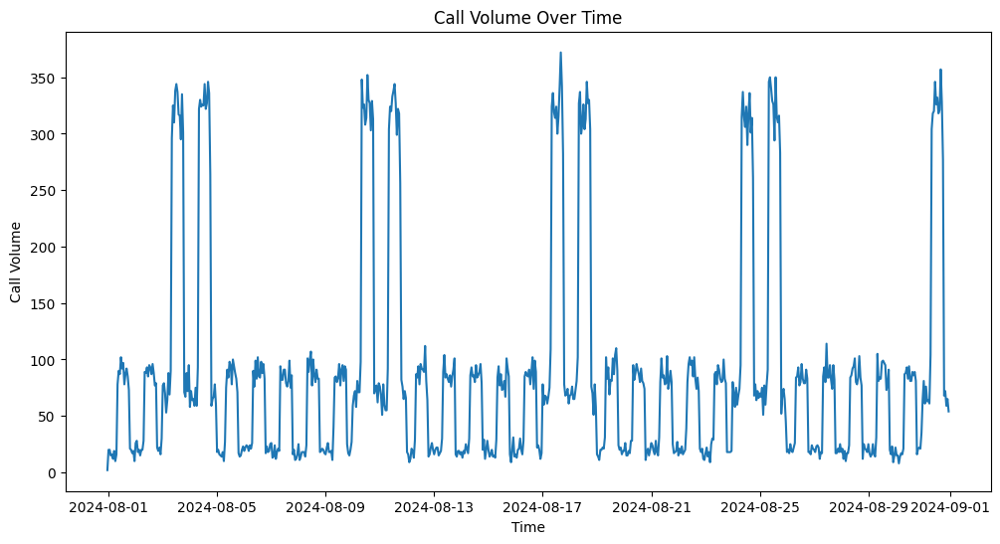

ADF Statistic: -3.5428446637935163
p-value: 0.006952565416498368
Critical Values:
   1%, -3.4394144152232995
Critical Values:
   5%, -2.8655403100177566
Critical Values:
   10%, -2.5689002207655443


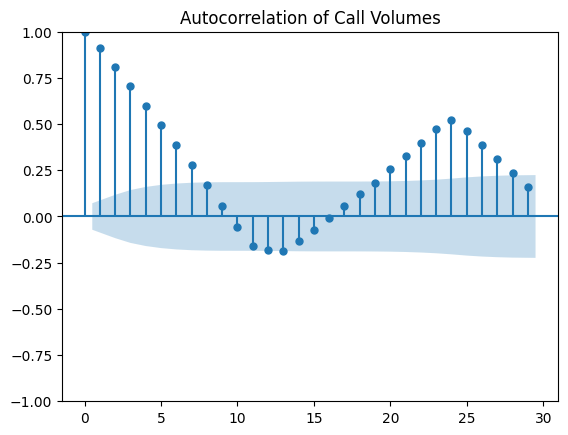

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 10000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


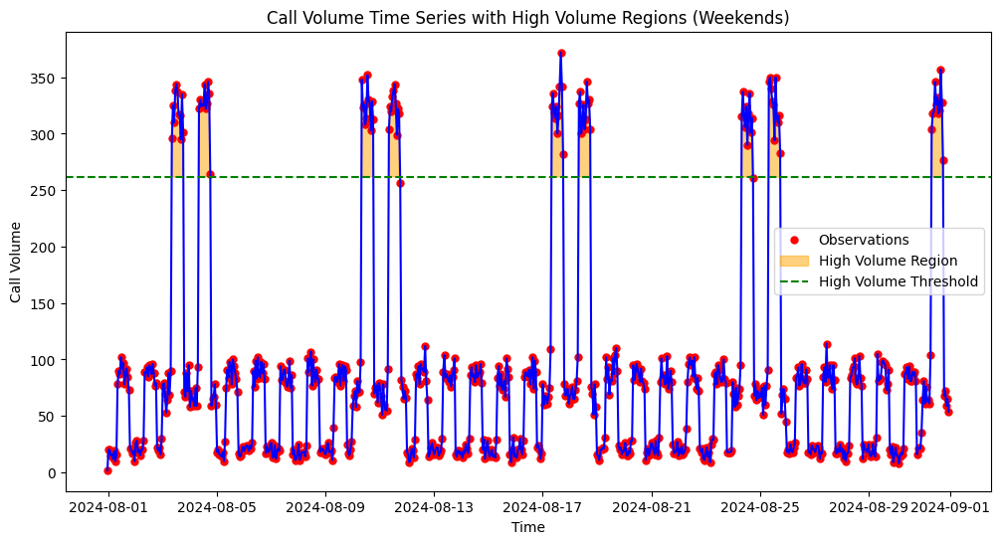

In [148]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

# Example data
# Replace this with your actual data
# call_volume = pd.Series(data, index=pd.date_range(start='2024-01-01', periods=len(data), freq='H'))

# Plot the call volume data
plt.figure(figsize=(12, 6))
plt.plot(call_volume)
plt.title('Call Volume Over Time')
plt.xlabel('Time')
plt.ylabel('Call Volume')
plt.show()

# Perform ADF Test
result = adfuller(call_volume)
print('ADF Statistic:', result[0])
print('p-value:', result[1])
for key, value in result[4].items():
    print('Critical Values:')
    print(f'   {key}, {value}')

# Plot Autocorrelation
plot_acf(call_volume)
plt.title('Autocorrelation of Call Volumes')
plt.show()

# Fit Gaussian Process
# Define the kernel: ConstantKernel * RBF with increased upper bound
kernel = C(1.0, (1e-3, 1e4)) * RBF(1, (1e-2, 1e2))

# Create Gaussian Process Regressor
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Fit to the data
time = np.arange(len(call_volume)).reshape(-1, 1)
gp.fit(time, call_volume.values)

# Make predictions
time_pred = np.linspace(0, len(call_volume)-1, len(call_volume)).reshape(-1, 1)
y_pred, sigma = gp.predict(time_pred, return_std=True)

# Define high volume threshold (e.g., 90th percentile of predicted values)
threshold = np.percentile(y_pred, 87)

# Identify high volume regions
high_volume_indices = np.where(y_pred > threshold)[0]

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(call_volume.index, call_volume, 'r.', markersize=10, label='Observations')
plt.plot(call_volume.index, y_pred, 'b-')

# Highlight regions above the threshold
plt.fill_between(call_volume.index,
                 y_pred,
                 threshold,
                 where=(y_pred > threshold),
                 color='orange', alpha=0.5,
                 label='High Volume Region')

plt.axhline(y=threshold, color='g', linestyle='--', label='High Volume Threshold')
plt.title('Call Volume Time Series with High Volume Regions (Weekends)')
plt.xlabel('Time')
plt.ylabel('Call Volume')
plt.legend()
plt.show()

In [149]:
high_volume = call_volume[call_volume.values>threshold]
pd.DataFrame({'Hour of the day':high_volume[high_volume.index].index.hour.unique(),'Number of times in High Volume Zone in Aug 2024':high_volume[high_volume.index].index.hour.value_counts()})

,Hour of the day,Number of times in High Volume Zone in Aug 2024
hour,,
8,8,9
9,9,9
10,10,9
11,11,9
12,12,9
13,13,9
14,14,9
15,15,9
16,16,9


In [150]:
call_volume[call_volume.values>threshold].index.weekday.value_counts()  # THE HIGH VOLUME HOURS ARE IN WEEKENDS ONLY

hour
5    54
6    43
Name: count, dtype: int64

In [151]:
high_volume_period_hours = high_volume.index

In [152]:
high_volume_period_hours

DatetimeIndex(['2024-08-03 08:00:00', '2024-08-03 09:00:00',
               '2024-08-03 10:00:00', '2024-08-03 11:00:00',
               '2024-08-03 12:00:00', '2024-08-03 13:00:00',
               '2024-08-03 14:00:00', '2024-08-03 15:00:00',
               '2024-08-03 16:00:00', '2024-08-03 17:00:00',
               '2024-08-03 18:00:00', '2024-08-04 08:00:00',
               '2024-08-04 09:00:00', '2024-08-04 10:00:00',
               '2024-08-04 11:00:00', '2024-08-04 12:00:00',
               '2024-08-04 13:00:00', '2024-08-04 14:00:00',
               '2024-08-04 15:00:00', '2024-08-04 16:00:00',
               '2024-08-04 17:00:00', '2024-08-04 18:00:00',
               '2024-08-10 08:00:00', '2024-08-10 09:00:00',
               '2024-08-10 10:00:00', '2024-08-10 11:00:00',
               '2024-08-10 12:00:00', '2024-08-10 13:00:00',
               '2024-08-10 14:00:00', '2024-08-10 15:00:00',
               '2024-08-10 16:00:00', '2024-08-10 17:00:00',
               '2024-08-

In [153]:
traindf2['call_start_datetime'] = pd.to_datetime(traindf2['call_start_datetime'])

# Extract hour from 'call_start_datetime'
traindf2['hour'] = traindf2['call_start_datetime'].dt.hour

# Create 'High_Volume' column based on condition
traindf2['High_Volume'] = traindf2['hour'].apply(lambda x: 1 if x in high_volume_period_hours else 0)

# Optionally drop the 'hour' column if not needed
traindf2.drop(columns=['hour'], inplace=True)

# Display the updated DataFrame
print(traindf2.head())

      call_id  customer_id  agent_id call_start_datetime  \
0  4667960400   2033123310    963118 2024-07-31 23:56:00   
1  1122072124   8186702651    519057 2024-08-01 00:03:00   
2  6834291559   2416856629    158319 2024-07-31 23:59:00   
3  2266439882   1154544516    488324 2024-08-01 00:05:00   
4  1211603231   5214456437    721730 2024-08-01 00:04:00   

      agent_assigned_datetime           call_end_datetime  \
0  2024-08-01 00:03:00.000000  2024-08-01 00:34:00.000000   
1  2024-08-01 00:06:00.000000  2024-08-01 00:18:00.000000   
2  2024-08-01 00:07:00.000000  2024-08-01 00:26:00.000000   
3  2024-08-01 00:10:00.000000  2024-08-01 00:17:00.000000   
4  2024-08-01 00:14:00.000000  2024-08-01 00:23:00.000000   

                                     call_transcript      customer_name  \
0  \n\nAgent: Thank you for calling United Airlin...     Matthew Foster   
1  \n\nAgent: Thank you for calling United Airlin...      Tammy Walters   
2  \n\nAgent: Thank you for calling United Airl

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\2411179040.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  traindf2['call_start_datetime'] = pd.to_datetime(traindf2['call_start_datetime'])
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\2411179040.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  traindf2['hour'] = traindf2['call_start_datetime'].dt.hour


In [154]:
traindf2.isnull().sum()

call_id                        0
customer_id                    0
agent_id                       0
call_start_datetime            0
agent_assigned_datetime        0
call_end_datetime              0
call_transcript                0
customer_name                  0
elite_level_code           23959
agent_tone                   198
customer_tone                  0
average_sentiment            101
silence_percent_average        0
primary_call_reason            0
HT                             0
ST                             0
AHT                            0
AST                            0
High_Volume                    0
dtype: int64

In [155]:
traindf2.reset_index(inplace=True)

In [156]:
traindf2

,index,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,High_Volume
0,0,4667960400,2033123310,963118,2024-07-31 23:56:00,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,0
1,1,1122072124,8186702651,519057,2024-08-01 00:03:00,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,12.0,3.0,11.471939,3.0,0
2,2,6834291559,2416856629,158319,2024-07-31 23:59:00,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,19.0,8.0,11.594005,8.0,0
3,3,2266439882,1154544516,488324,2024-08-01 00:05:00,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,7.0,5.0,10.270718,5.0,0
4,4,1211603231,5214456437,721730,2024-08-01 00:04:00,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,9.0,10.0,10.635762,10.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,7569738090,7367304988,783441,2024-08-31 23:51:00,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,frustrated,-0.19,0.51,Mileage Plus,10.0,6.0,15.000000,6.0,0
66649,66649,1563273072,8022667294,413148,2024-08-31 23:48:00,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,calm,0.05,0.34,Post Flight,28.0,9.0,18.666667,9.0,0
66650,66650,8865997781,4474867021,980156,2024-08-31 23:55:00,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,frustrated,0.03,0.22,Upgrade,8.0,3.0,18.500000,3.0,0
66651,66651,8019240181,9762042472,616988,2024-08-31 23:52:00,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,polite,0.05,0.42,Upgrade,6.0,6.0,4.750000,6.0,0


In [157]:
traindf2.High_Volume.value_counts()

High_Volume
0    66653
Name: count, dtype: int64

In [164]:
traindf2['call_start_datetime'] = pd.to_datetime(traindf2['call_start_datetime'])

# Round down to the nearest hour
traindf2['hourly_timestamp'] = traindf2['call_start_datetime'].dt.floor('H')

# Create High_Volume column based on membership in high_volume_period_hours
traindf2['High_Volume'] = traindf2['hourly_timestamp'].apply(
    lambda x: 1 if x in high_volume_period_hours else 0
)

# Optionally drop the temporary column if not needed
traindf2.drop(columns=['hourly_timestamp'], inplace=True)

# Display the updated DataFrame
print(traindf2.head())

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\1029444387.py:4: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  traindf2['hourly_timestamp'] = traindf2['call_start_datetime'].dt.floor('H')


,index,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,High_Volume,hourly_timestamp
0,0,4667960400,2033123310,963118,2024-07-31 23:56:00,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,...,angry,-0.04,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,0,2024-07-31 23:00:00
1,1,1122072124,8186702651,519057,2024-08-01 00:03:00,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,...,neutral,0.02,0.35,Booking,12.0,3.0,11.471939,3.0,0,2024-08-01 00:00:00
2,2,6834291559,2416856629,158319,2024-07-31 23:59:00,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,...,polite,-0.13,0.32,IRROPS,19.0,8.0,11.594005,8.0,0,2024-07-31 23:00:00
3,3,2266439882,1154544516,488324,2024-08-01 00:05:00,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,...,frustrated,-0.20,0.20,Upgrade,7.0,5.0,10.270718,5.0,0,2024-08-01 00:00:00
4,4,1211603231,5214456437,721730,2024-08-01 00:04:00,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,...,polite,-0.05,0.35,Seating,9.0,10.0,10.635762,10.0,0,2024-08-01 00:00:00


In [165]:
query_ast_hv = "SELECT customer_id, AVG(ST)as AST_HV from traindf2 where High_Volume = '1' GROUP BY customer_id ORDER BY AST_HV asc "
ast_hv = psql.sqldf(query_ast_hv, locals())
query_aht_hv= "SELECT agent_id, AVG(HT)as AHT_HV from traindf2 where High_Volume = '1' GROUP BY agent_id ORDER BY AHT_HV asc "
aht_hv= psql.sqldf(query_aht_hv, locals())


In [166]:
aht_hv

,agent_id,AHT_HV
0,281512,2.000000
1,434222,3.000000
2,136065,3.500000
3,215457,5.285714
4,677860,6.000000
...,...,...
339,242716,33.200000
340,377855,33.500000
341,184151,33.800000
342,558705,34.000000


In [167]:
ast_hv

,customer_id,AST_HV
0,957084,3.0
1,4591173,3.0
2,11209888,3.0
3,12209145,3.0
4,28670376,3.0
...,...,...
31232,9478143360,15.0
31233,9497045675,15.0
31234,9670002958,15.0
31235,9854470594,15.0


In [161]:
ast

,customer_id,AST
0,957084,3.0
1,1162759,3.0
2,4591173,3.0
3,11209888,3.0
4,12209145,3.0
...,...,...
66648,9825149966,15.0
66649,9854470594,15.0
66650,9879815386,15.0
66651,9894816042,15.0


In [162]:
aht

,agent_id,AHT
0,547592,3.000000
1,616988,4.750000
2,229129,5.875000
3,676262,6.500000
4,814757,7.130435
...,...,...
378,136065,35.750000
379,140146,43.666667
380,506130,48.000000
381,102574,60.000000


In [168]:
# assigning AST_HV = 0 for the customers who never called the customer care in High Volume Periods
ast_hv = psql.sqldf("SELECT ast.customer_id, ast_hv.AST_HV from ast left join ast_hv ON ast.customer_id = ast_hv.customer_id ", locals()).fillna(0)

In [169]:
ast_hv

,customer_id,AST_HV
0,957084,3.0
1,1162759,0.0
2,4591173,3.0
3,11209888,3.0
4,12209145,3.0
...,...,...
66648,9825149966,0.0
66649,9854470594,15.0
66650,9879815386,15.0
66651,9894816042,0.0


In [170]:
# assigning AHT_HV as 0 for the agents who have never received calls in the High VOlume Times
aht_hv = psql.sqldf("SELECT aht.agent_id, aht_hv.AHT_HV from aht LEFT JOIN aht_hv ON aht.agent_id = aht_hv.agent_id ", locals()).fillna(0)

In [171]:
aht_hv

,agent_id,AHT_HV
0,547592,0.000
1,616988,0.000
2,229129,8.250
3,676262,6.600
4,814757,10.125
...,...,...
378,136065,3.500
379,140146,13.500
380,506130,0.000
381,102574,0.000


In [172]:
ast_hv

,customer_id,AST_HV
0,957084,3.0
1,1162759,0.0
2,4591173,3.0
3,11209888,3.0
4,12209145,3.0
...,...,...
66648,9825149966,0.0
66649,9854470594,15.0
66650,9879815386,15.0
66651,9894816042,0.0


In [173]:
query_train_hv = "SELECT * from traindf2 LEFT JOIN ast_hv ON traindf2.customer_id = ast_hv.customer_id LEFT JOIN aht_hv ON traindf2.agent_id = aht_hv.agent_id "
train = psql.sqldf(query_train_hv, locals())

In [174]:
train

,index,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,High_Volume,hourly_timestamp,customer_id,AST_HV,agent_id,AHT_HV
0,0,4667960400,2033123310,963118,2024-07-31 23:56:00.000000,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,...,31.0,7.0,10.893424,7.0,0,2024-07-31 23:00:00.000000,2033123310,0.0,963118,0.0
1,1,1122072124,8186702651,519057,2024-08-01 00:03:00.000000,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,...,12.0,3.0,11.471939,3.0,0,2024-08-01 00:00:00.000000,8186702651,0.0,519057,0.0
2,2,6834291559,2416856629,158319,2024-07-31 23:59:00.000000,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,...,19.0,8.0,11.594005,8.0,0,2024-07-31 23:00:00.000000,2416856629,0.0,158319,0.0
3,3,2266439882,1154544516,488324,2024-08-01 00:05:00.000000,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,...,7.0,5.0,10.270718,5.0,0,2024-08-01 00:00:00.000000,1154544516,0.0,488324,0.0
4,4,1211603231,5214456437,721730,2024-08-01 00:04:00.000000,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,...,9.0,10.0,10.635762,10.0,0,2024-08-01 00:00:00.000000,5214456437,0.0,721730,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,7569738090,7367304988,783441,2024-08-31 23:51:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,...,10.0,6.0,15.000000,6.0,0,2024-08-31 23:00:00.000000,7367304988,0.0,783441,0.0
66649,66649,1563273072,8022667294,413148,2024-08-31 23:48:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,...,28.0,9.0,18.666667,9.0,0,2024-08-31 23:00:00.000000,8022667294,0.0,413148,0.0
66650,66650,8865997781,4474867021,980156,2024-08-31 23:55:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,...,8.0,3.0,18.500000,3.0,0,2024-08-31 23:00:00.000000,4474867021,0.0,980156,0.0
66651,66651,8019240181,9762042472,616988,2024-08-31 23:52:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,...,6.0,6.0,4.750000,6.0,0,2024-08-31 23:00:00.000000,9762042472,0.0,616988,0.0


In [175]:
train = train.loc[:, ~train.columns.duplicated()]

In [57]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,...,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,...,0.35,Booking,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,...,0.32,IRROPS,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,...,0.20,Upgrade,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,...,0.35,Seating,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,...,0.51,Mileage Plus,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,...,0.34,Post Flight,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,...,0.22,Upgrade,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,...,0.42,Upgrade,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0


In [177]:
aht_test

,agent_id,AHT
0,833458,1.500000
1,522981,2.000000
2,377855,2.500000
3,742430,2.666667
4,524948,3.000000
...,...,...
338,937733,43.000000
339,175271,50.750000
340,398990,53.500000
341,859203,63.000000


In [178]:
testdf2.reset_index(inplace=True)

In [179]:
testdf2['call_start_datetime'] = pd.to_datetime(testdf2['call_start_datetime'])
testdf2['call_end_datetime'] = pd.to_datetime(testdf2['call_end_datetime'])
# Step 1: Set the index to the call start time
testdf2.set_index('call_start_datetime', inplace=True)

# Step 2: Resample data by hour to count calls
call_volume_test= testdf2.resample('h').size()

# Step 3: Define high volume threshold (e.g., average + 10%)
average_calls_test = call_volume_test.mean()
std_calls_test = call_volume_test.std()

# Step 4: Set high volume threshold using mean + (1.98 * std)
high_volume_threshold_test = average_calls_test + (1.65 * std_calls_test)


# Step 4: Identify high volume periods
high_volume_periods_test = call_volume_test[call_volume_test > high_volume_threshold_test]

print("High Volume Call Periods:")
print(high_volume_periods_test)

High Volume Call Periods:
call_start_datetime
2024-08-03 08:00:00    27
2024-08-03 09:00:00    21
2024-08-03 10:00:00    28
2024-08-03 11:00:00    31
2024-08-03 12:00:00    25
                       ..
2024-08-31 08:00:00    24
2024-08-31 10:00:00    24
2024-08-31 11:00:00    23
2024-08-31 13:00:00    28
2024-08-31 17:00:00    21
Length: 81, dtype: int64


C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\108488489.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testdf2['call_start_datetime'] = pd.to_datetime(testdf2['call_start_datetime'])
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\108488489.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testdf2['call_end_datetime'] = pd.to_datetime(testdf2['call_end_datetime'])


In [180]:
testdf2['High_Volume_based_on_train'] = testdf2['rounded_hour'].isin(high_volume_period_hours_test).astype(int)

KeyError: 'rounded_hour'

In [63]:
testdf2

,call_start_datetime,index,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,customer_tone,average_sentiment,silence_percent_average,HT,ST,AHT,AST,rounded_hour,High_Volume,High_Volume_based_on_train
0,2024-08-01 00:23:00,0,7732610078,4029953261,488324,2024-08-01 00:34:00.000000,2024-08-01 01:32:00,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,...,neutral,-0.06,0.58,58.0,11.0,9.300000,11.0,2024-08-01 00:00:00,0,0
1,2024-08-01 01:33:00,1,2400299738,2034858976,963118,2024-08-01 01:41:00.000000,2024-08-01 01:54:00,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,...,angry,0.01,0.40,13.0,8.0,9.900000,8.0,2024-08-01 01:00:00,0,0
2,2024-08-01 02:17:00,2,6533095063,1874845993,519057,2024-08-01 02:27:00.000000,2024-08-01 02:29:00,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,...,calm,0.00,0.49,2.0,10.0,8.368421,10.0,2024-08-01 02:00:00,0,0
3,2024-08-01 02:49:00,3,7774450920,2633426588,963118,2024-08-01 02:53:00.000000,2024-08-01 02:57:00,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,...,angry,0.02,0.28,4.0,4.0,9.900000,4.0,2024-08-01 02:00:00,0,0
4,2024-08-01 02:49:00,4,9214147168,8334856492,158319,2024-08-01 02:55:00.000000,2024-08-01 02:59:00,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,...,frustrated,-0.12,0.12,4.0,6.0,8.000000,6.0,2024-08-01 02:00:00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,2024-08-31 22:27:00,5152,5300201106,955491559,638327,2024-08-31 22:30:00.000000,2024-08-31 22:43:00,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,...,polite,-0.15,0.29,13.0,3.0,6.666667,3.0,2024-08-31 22:00:00,0,0
5153,2024-08-31 22:43:00,5153,727694488,5500822696,859203,2024-08-31 22:51:00.000000,2024-08-31 23:54:00,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,...,frustrated,0.03,0.67,63.0,8.0,63.000000,8.0,2024-08-31 22:00:00,0,0
5154,2024-08-31 23:04:00,5154,147487837,5121247144,520243,2024-08-31 23:09:00.000000,2024-08-31 23:14:00,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,...,frustrated,-0.14,0.02,5.0,5.0,5.000000,5.0,2024-08-31 23:00:00,0,0
5155,2024-08-31 23:14:00,5155,5330794838,4211618675,255256,2024-08-31 23:22:00.000000,2024-08-31 23:30:00,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,...,calm,0.14,0.53,8.0,8.0,8.000000,8.0,2024-08-31 23:00:00,0,0


In [ ]:
query_ast_testhv = "SELECT customer_id, AVG(ST)as ast_test from testdf2 where High_Volume = 1 GROUP BY customer_id ORDER BY ast_test asc "
ast_testhv = psql.sqldf(query_ast_testhv, locals())
query_aht_testhv= "SELECT agent_id, AVG(HT)as aht_test from testdf2 where High_Volume = 1 GROUP BY agent_id ORDER BY aht_test asc "
aht_testhv= psql.sqldf(query_aht_testhv, locals())

In [65]:
query_ast_testhv2 = "SELECT customer_id, AVG(ST)as ast_test from testdf2 where High_Volume_based_on_train = 1 GROUP BY customer_id ORDER BY ast_test asc "
ast_testhv2 = psql.sqldf(query_ast_testhv2, locals())
query_aht_testhv2= "SELECT agent_id, AVG(HT)as aht_test from testdf2 where High_Volume_based_on_train = 1 GROUP BY agent_id ORDER BY aht_test asc "
aht_testhv2= psql.sqldf(query_aht_testhv2, locals())

In [66]:
# assigning ast_testHV = 0 for the customers who never called the customer care in High Volume Periods
ast_testhv = psql.sqldf("SELECT ast_test.customer_id, ast_testhv.ast_test from ast_test left join ast_testhv ON ast_test.customer_id = ast_testhv.customer_id ", locals()).fillna(0)
ast_testhv
# assigning aht_testHV as 0 for the agents who have never received calls in the High VOlume Times
aht_testhv = psql.sqldf("SELECT aht_test.agent_id, aht_testhv.aht_test from aht_test LEFT JOIN aht_testhv ON aht_test.agent_id = aht_testhv.agent_id ", locals()).fillna(0)
aht_testhv

,agent_id,aht_test
0,833458,0.0
1,522981,2.0
2,377855,2.5
3,742430,2.5
4,524948,0.0
...,...,...
338,937733,43.0
339,175271,9.0
340,398990,0.0
341,859203,0.0


In [67]:
# assigning ast_testHV = 0 for the customers who never called the customer care in High Volume Periods
ast_testhv2 = psql.sqldf("SELECT ast_test.customer_id, ast_testhv2.ast_test from ast_test left join ast_testhv2 ON ast_test.customer_id = ast_testhv2.customer_id ", locals()).fillna(0)
ast_testhv2
# assigning aht_testHV as 0 for the agents who have never received calls in the High VOlume Times
aht_testhv2 = psql.sqldf("SELECT aht_test.agent_id, aht_testhv2.aht_test from aht_test LEFT JOIN aht_testhv2 ON aht_test.agent_id = aht_testhv2.agent_id ", locals()).fillna(0)
aht_testhv2

,agent_id,aht_test
0,833458,0.0
1,522981,2.0
2,377855,2.5
3,742430,2.5
4,524948,0.0
...,...,...
338,937733,43.0
339,175271,9.0
340,398990,0.0
341,859203,0.0


In [68]:
ast_testhv2

,customer_id,ast_test
0,65683011,0.0
1,258778951,0.0
2,269004551,0.0
3,316129399,0.0
4,357329419,3.0
...,...,...
5152,6920264913,15.0
5153,7918734415,0.0
5154,8675987159,0.0
5155,8792553015,0.0


In [69]:
query_test_hv = "SELECT * from testdf2  LEFT JOIN ast_testhv ON testdf2.customer_id = ast_testhv.customer_id  LEFT JOIN aht_testhv ON testdf2.agent_id = aht_testhv.agent_id "
test = psql.sqldf(query_test_hv, locals())

In [70]:
query_test_hv2 = "SELECT * from testdf2  LEFT JOIN ast_testhv2 ON testdf2.customer_id = ast_testhv2.customer_id  LEFT JOIN aht_testhv2 ON testdf2.agent_id = aht_testhv2.agent_id "
test2 = psql.sqldf(query_test_hv2, locals())

In [71]:
test

,call_start_datetime,index,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,ST,AHT,AST,rounded_hour,High_Volume,High_Volume_based_on_train,customer_id,ast_test,agent_id,aht_test
0,2024-08-01 00:23:00.000000,0,7732610078,4029953261,488324,2024-08-01 00:34:00.000000,2024-08-01 01:32:00.000000,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,...,11.0,9.300000,11.0,2024-08-01 00:00:00.000000,0,0,4029953261,0.0,488324,0.0
1,2024-08-01 01:33:00.000000,1,2400299738,2034858976,963118,2024-08-01 01:41:00.000000,2024-08-01 01:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,...,8.0,9.900000,8.0,2024-08-01 01:00:00.000000,0,0,2034858976,0.0,963118,0.0
2,2024-08-01 02:17:00.000000,2,6533095063,1874845993,519057,2024-08-01 02:27:00.000000,2024-08-01 02:29:00.000000,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,...,10.0,8.368421,10.0,2024-08-01 02:00:00.000000,0,0,1874845993,0.0,519057,0.0
3,2024-08-01 02:49:00.000000,3,7774450920,2633426588,963118,2024-08-01 02:53:00.000000,2024-08-01 02:57:00.000000,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,...,4.0,9.900000,4.0,2024-08-01 02:00:00.000000,0,0,2633426588,0.0,963118,0.0
4,2024-08-01 02:49:00.000000,4,9214147168,8334856492,158319,2024-08-01 02:55:00.000000,2024-08-01 02:59:00.000000,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,...,6.0,8.000000,6.0,2024-08-01 02:00:00.000000,0,0,8334856492,0.0,158319,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,2024-08-31 22:27:00.000000,5152,5300201106,955491559,638327,2024-08-31 22:30:00.000000,2024-08-31 22:43:00.000000,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,...,3.0,6.666667,3.0,2024-08-31 22:00:00.000000,0,0,955491559,0.0,638327,0.0
5153,2024-08-31 22:43:00.000000,5153,727694488,5500822696,859203,2024-08-31 22:51:00.000000,2024-08-31 23:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,...,8.0,63.000000,8.0,2024-08-31 22:00:00.000000,0,0,5500822696,0.0,859203,0.0
5154,2024-08-31 23:04:00.000000,5154,147487837,5121247144,520243,2024-08-31 23:09:00.000000,2024-08-31 23:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,...,5.0,5.000000,5.0,2024-08-31 23:00:00.000000,0,0,5121247144,0.0,520243,0.0
5155,2024-08-31 23:14:00.000000,5155,5330794838,4211618675,255256,2024-08-31 23:22:00.000000,2024-08-31 23:30:00.000000,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,...,8.0,8.000000,8.0,2024-08-31 23:00:00.000000,0,0,4211618675,0.0,255256,0.0


In [72]:
test2

,call_start_datetime,index,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,ST,AHT,AST,rounded_hour,High_Volume,High_Volume_based_on_train,customer_id,ast_test,agent_id,aht_test
0,2024-08-01 00:23:00.000000,0,7732610078,4029953261,488324,2024-08-01 00:34:00.000000,2024-08-01 01:32:00.000000,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,...,11.0,9.300000,11.0,2024-08-01 00:00:00.000000,0,0,4029953261,0.0,488324,0.0
1,2024-08-01 01:33:00.000000,1,2400299738,2034858976,963118,2024-08-01 01:41:00.000000,2024-08-01 01:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,...,8.0,9.900000,8.0,2024-08-01 01:00:00.000000,0,0,2034858976,0.0,963118,0.0
2,2024-08-01 02:17:00.000000,2,6533095063,1874845993,519057,2024-08-01 02:27:00.000000,2024-08-01 02:29:00.000000,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,...,10.0,8.368421,10.0,2024-08-01 02:00:00.000000,0,0,1874845993,0.0,519057,0.0
3,2024-08-01 02:49:00.000000,3,7774450920,2633426588,963118,2024-08-01 02:53:00.000000,2024-08-01 02:57:00.000000,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,...,4.0,9.900000,4.0,2024-08-01 02:00:00.000000,0,0,2633426588,0.0,963118,0.0
4,2024-08-01 02:49:00.000000,4,9214147168,8334856492,158319,2024-08-01 02:55:00.000000,2024-08-01 02:59:00.000000,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,...,6.0,8.000000,6.0,2024-08-01 02:00:00.000000,0,0,8334856492,0.0,158319,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,2024-08-31 22:27:00.000000,5152,5300201106,955491559,638327,2024-08-31 22:30:00.000000,2024-08-31 22:43:00.000000,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,...,3.0,6.666667,3.0,2024-08-31 22:00:00.000000,0,0,955491559,0.0,638327,0.0
5153,2024-08-31 22:43:00.000000,5153,727694488,5500822696,859203,2024-08-31 22:51:00.000000,2024-08-31 23:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,...,8.0,63.000000,8.0,2024-08-31 22:00:00.000000,0,0,5500822696,0.0,859203,0.0
5154,2024-08-31 23:04:00.000000,5154,147487837,5121247144,520243,2024-08-31 23:09:00.000000,2024-08-31 23:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,...,5.0,5.000000,5.0,2024-08-31 23:00:00.000000,0,0,5121247144,0.0,520243,0.0
5155,2024-08-31 23:14:00.000000,5155,5330794838,4211618675,255256,2024-08-31 23:22:00.000000,2024-08-31 23:30:00.000000,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,...,8.0,8.000000,8.0,2024-08-31 23:00:00.000000,0,0,4211618675,0.0,255256,0.0


In [73]:
test = test.loc[:, ~test.columns.duplicated()]
test2 = test2.loc[:, ~test2.columns.duplicated()]

In [74]:
test = test.rename({'ast_test':'AST_HV', 'aht_test':'AHT_HV'}, axis = 1)
test2 = test2.rename({'ast_test':'AST_HV', 'aht_test':'AHT_HV'}, axis = 1)

train : Training set based on training data
test : Testing set based on testing data
test2 : Testing set based on testing data

In [75]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,...,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,...,0.35,Booking,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,...,0.32,IRROPS,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,...,0.20,Upgrade,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,...,0.35,Seating,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,...,0.51,Mileage Plus,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,...,0.34,Post Flight,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,...,0.22,Upgrade,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,...,0.42,Upgrade,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0


In [76]:
test

,call_start_datetime,index,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,silence_percent_average,HT,ST,AHT,AST,rounded_hour,High_Volume,High_Volume_based_on_train,AST_HV,AHT_HV
0,2024-08-01 00:23:00.000000,0,7732610078,4029953261,488324,2024-08-01 00:34:00.000000,2024-08-01 01:32:00.000000,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,...,0.58,58.0,11.0,9.300000,11.0,2024-08-01 00:00:00.000000,0,0,0.0,0.0
1,2024-08-01 01:33:00.000000,1,2400299738,2034858976,963118,2024-08-01 01:41:00.000000,2024-08-01 01:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,...,0.40,13.0,8.0,9.900000,8.0,2024-08-01 01:00:00.000000,0,0,0.0,0.0
2,2024-08-01 02:17:00.000000,2,6533095063,1874845993,519057,2024-08-01 02:27:00.000000,2024-08-01 02:29:00.000000,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,...,0.49,2.0,10.0,8.368421,10.0,2024-08-01 02:00:00.000000,0,0,0.0,0.0
3,2024-08-01 02:49:00.000000,3,7774450920,2633426588,963118,2024-08-01 02:53:00.000000,2024-08-01 02:57:00.000000,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,...,0.28,4.0,4.0,9.900000,4.0,2024-08-01 02:00:00.000000,0,0,0.0,0.0
4,2024-08-01 02:49:00.000000,4,9214147168,8334856492,158319,2024-08-01 02:55:00.000000,2024-08-01 02:59:00.000000,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,...,0.12,4.0,6.0,8.000000,6.0,2024-08-01 02:00:00.000000,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,2024-08-31 22:27:00.000000,5152,5300201106,955491559,638327,2024-08-31 22:30:00.000000,2024-08-31 22:43:00.000000,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,...,0.29,13.0,3.0,6.666667,3.0,2024-08-31 22:00:00.000000,0,0,0.0,0.0
5153,2024-08-31 22:43:00.000000,5153,727694488,5500822696,859203,2024-08-31 22:51:00.000000,2024-08-31 23:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,...,0.67,63.0,8.0,63.000000,8.0,2024-08-31 22:00:00.000000,0,0,0.0,0.0
5154,2024-08-31 23:04:00.000000,5154,147487837,5121247144,520243,2024-08-31 23:09:00.000000,2024-08-31 23:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,...,0.02,5.0,5.0,5.000000,5.0,2024-08-31 23:00:00.000000,0,0,0.0,0.0
5155,2024-08-31 23:14:00.000000,5155,5330794838,4211618675,255256,2024-08-31 23:22:00.000000,2024-08-31 23:30:00.000000,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,...,0.53,8.0,8.0,8.000000,8.0,2024-08-31 23:00:00.000000,0,0,0.0,0.0


In [77]:
test2

,call_start_datetime,index,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,silence_percent_average,HT,ST,AHT,AST,rounded_hour,High_Volume,High_Volume_based_on_train,AST_HV,AHT_HV
0,2024-08-01 00:23:00.000000,0,7732610078,4029953261,488324,2024-08-01 00:34:00.000000,2024-08-01 01:32:00.000000,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,NaN,...,0.58,58.0,11.0,9.300000,11.0,2024-08-01 00:00:00.000000,0,0,0.0,0.0
1,2024-08-01 01:33:00.000000,1,2400299738,2034858976,963118,2024-08-01 01:41:00.000000,2024-08-01 01:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,...,0.40,13.0,8.0,9.900000,8.0,2024-08-01 01:00:00.000000,0,0,0.0,0.0
2,2024-08-01 02:17:00.000000,2,6533095063,1874845993,519057,2024-08-01 02:27:00.000000,2024-08-01 02:29:00.000000,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,NaN,...,0.49,2.0,10.0,8.368421,10.0,2024-08-01 02:00:00.000000,0,0,0.0,0.0
3,2024-08-01 02:49:00.000000,3,7774450920,2633426588,963118,2024-08-01 02:53:00.000000,2024-08-01 02:57:00.000000,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,NaN,...,0.28,4.0,4.0,9.900000,4.0,2024-08-01 02:00:00.000000,0,0,0.0,0.0
4,2024-08-01 02:49:00.000000,4,9214147168,8334856492,158319,2024-08-01 02:55:00.000000,2024-08-01 02:59:00.000000,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,...,0.12,4.0,6.0,8.000000,6.0,2024-08-01 02:00:00.000000,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152,2024-08-31 22:27:00.000000,5152,5300201106,955491559,638327,2024-08-31 22:30:00.000000,2024-08-31 22:43:00.000000,\n\nAgent: Thank you for calling United Airlin...,Christopher Morgan,0.0,...,0.29,13.0,3.0,6.666667,3.0,2024-08-31 22:00:00.000000,0,0,0.0,0.0
5153,2024-08-31 22:43:00.000000,5153,727694488,5500822696,859203,2024-08-31 22:51:00.000000,2024-08-31 23:54:00.000000,\n\nAgent: Thank you for calling United Airlin...,James Cunningham,2.0,...,0.67,63.0,8.0,63.000000,8.0,2024-08-31 22:00:00.000000,0,0,0.0,0.0
5154,2024-08-31 23:04:00.000000,5154,147487837,5121247144,520243,2024-08-31 23:09:00.000000,2024-08-31 23:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Crystal Guzman,1.0,...,0.02,5.0,5.0,5.000000,5.0,2024-08-31 23:00:00.000000,0,0,0.0,0.0
5155,2024-08-31 23:14:00.000000,5155,5330794838,4211618675,255256,2024-08-31 23:22:00.000000,2024-08-31 23:30:00.000000,\n\nAgent: Thank you for calling United Airlin...,Robert Ruiz,0.0,...,0.53,8.0,8.0,8.000000,8.0,2024-08-31 23:00:00.000000,0,0,0.0,0.0


In [78]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,...,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,...,0.35,Booking,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,...,0.32,IRROPS,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,...,0.20,Upgrade,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,...,0.35,Seating,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,...,0.51,Mileage Plus,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,...,0.34,Post Flight,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,...,0.22,Upgrade,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,...,0.42,Upgrade,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0


In [79]:
train.columns

Index(['call_start_datetime', 'call_id', 'customer_id', 'agent_id',
       'agent_assigned_datetime', 'call_end_datetime', 'call_transcript',
       'customer_name', 'elite_level_code', 'agent_tone', 'customer_tone',
       'average_sentiment', 'silence_percent_average', 'primary_call_reason',
       'HT', 'ST', 'AHT', 'AST', 'rounded_hour', 'High_Volume', 'AST_HV',
       'AHT_HV'],
      dtype='object')

In [80]:
import numpy as np

In [81]:
train.elite_level_code.value_counts(dropna=False)

elite_level_code
NaN    23959
1.0    13338
0.0    13338
2.0     7468
3.0     5284
4.0     1961
5.0     1305
Name: count, dtype: int64

In [82]:
train.agent_tone.value_counts(dropna=False)

agent_tone
neutral       39688
calm          22882
frustrated     3438
angry           366
None            198
polite           81
Name: count, dtype: int64

In [83]:
train.customer_tone.value_counts(dropna=False)

customer_tone
neutral       13402
polite        13397
angry         13351
calm          13278
frustrated    13225
Name: count, dtype: int64

In [84]:
train.primary_call_reason.value_counts(dropna=False)

primary_call_reason
IRROPS                     13057
Voluntary Change           10291
Seating                     6223
Mileage Plus                5487
Post-Flight                 3869
Communications              3779
Products and Services       2792
Upgrade                     2682
Baggage                     2616
Booking                     2589
Checkout                    1840
Check-In                    1490
Voluntary Cancel            1304
Digital Support              996
ETC                          930
Traveler Updates             772
Schedule Change              707
Other Topics                 568
Products & Services          476
Disability                   394
Check In                     385
Post Flight                  373
Voluntary  Cancel            278
IRROPS                       254
Other  Topics                234
Voluntary Change             208
Voluntary   Change           200
Voluntary  Change            149
Seating                      142
Digital   Support      

In [85]:
num_cols = ['HT','ST','AST','AHT','AST_HV','AHT_HV','average_sentiment', 'silence_percent_average']
ids =['call_id', 'customer_id', 'agent_id']
cat_cols = ['elite_level_code', 'agent_tone', 'customer_tone', 'primary_call_reason','High_Volume']

In [86]:
train[num_cols]

,HT,ST,AST,AHT,AST_HV,AHT_HV,average_sentiment,silence_percent_average
0,31.0,7.0,7.0,10.893424,0.0,0.0,-0.04,0.39
1,12.0,3.0,3.0,11.471939,0.0,0.0,0.02,0.35
2,19.0,8.0,8.0,11.594005,0.0,0.0,-0.13,0.32
3,7.0,5.0,5.0,10.270718,0.0,0.0,-0.20,0.20
4,9.0,10.0,10.0,10.635762,0.0,0.0,-0.05,0.35
...,...,...,...,...,...,...,...,...
66648,10.0,6.0,6.0,15.000000,0.0,0.0,-0.19,0.51
66649,28.0,9.0,9.0,18.666667,0.0,0.0,0.05,0.34
66650,8.0,3.0,3.0,18.500000,0.0,0.0,0.03,0.22
66651,6.0,6.0,6.0,4.750000,0.0,0.0,0.05,0.42


In [87]:
train[ids]

,call_id,customer_id,agent_id
0,4667960400,2033123310,963118
1,1122072124,8186702651,519057
2,6834291559,2416856629,158319
3,2266439882,1154544516,488324
4,1211603231,5214456437,721730
...,...,...,...
66648,7569738090,7367304988,783441
66649,1563273072,8022667294,413148
66650,8865997781,4474867021,980156
66651,8019240181,9762042472,616988


In [88]:
train[cat_cols]

,elite_level_code,agent_tone,customer_tone,primary_call_reason,High_Volume
0,4.0,neutral,angry,Voluntary Cancel,0
1,NaN,calm,neutral,Booking,0
2,NaN,neutral,polite,IRROPS,0
3,2.0,neutral,frustrated,Upgrade,0
4,0.0,neutral,polite,Seating,0
...,...,...,...,...,...
66648,2.0,neutral,frustrated,Mileage Plus,0
66649,NaN,calm,calm,Post Flight,0
66650,1.0,calm,frustrated,Upgrade,0
66651,NaN,calm,polite,Upgrade,0


In [89]:
aht

,agent_id,AHT
0,547592,3.000000
1,616988,4.750000
2,229129,5.875000
3,676262,6.500000
4,814757,7.130435
...,...,...
378,136065,35.750000
379,140146,43.666667
380,506130,48.000000
381,102574,60.000000


In [90]:
ast

,customer_id,AST
0,957084,3.0
1,1162759,3.0
2,4591173,3.0
3,11209888,3.0
4,12209145,3.0
...,...,...
66648,9825149966,15.0
66649,9854470594,15.0
66650,9879815386,15.0
66651,9894816042,15.0


In [91]:
traindf.customer_id.value_counts()

customer_id
8014388758    1
2033123310    1
8186702651    1
2416856629    1
1154544516    1
             ..
6997422211    1
9310326714    1
1937394483    1
6748767796    1
4653299214    1
Name: count, Length: 66653, dtype: int64

In [92]:
set(test.customer_id).intersection(set(train.customer_id))  # Hence there are no customers which are in training as well as test set

set()

In [93]:
cat_cols

['elite_level_code',
 'agent_tone',
 'customer_tone',
 'primary_call_reason',
 'High_Volume']

In [94]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,...,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,...,0.35,Booking,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,...,0.32,IRROPS,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,...,0.20,Upgrade,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,...,0.35,Seating,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,...,0.51,Mileage Plus,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,calm,...,0.34,Post Flight,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,...,0.22,Upgrade,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,calm,...,0.42,Upgrade,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0


In [182]:
train

,index,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,silence_percent_average,primary_call_reason,HT,ST,AHT,AST,High_Volume,hourly_timestamp,AST_HV,AHT_HV
0,0,4667960400,2033123310,963118,2024-07-31 23:56:00.000000,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,...,0.39,Voluntary Cancel,31.0,7.0,10.893424,7.0,0,2024-07-31 23:00:00.000000,0.0,0.0
1,1,1122072124,8186702651,519057,2024-08-01 00:03:00.000000,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,...,0.35,Booking,12.0,3.0,11.471939,3.0,0,2024-08-01 00:00:00.000000,0.0,0.0
2,2,6834291559,2416856629,158319,2024-07-31 23:59:00.000000,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,...,0.32,IRROPS,19.0,8.0,11.594005,8.0,0,2024-07-31 23:00:00.000000,0.0,0.0
3,3,2266439882,1154544516,488324,2024-08-01 00:05:00.000000,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,...,0.20,Upgrade,7.0,5.0,10.270718,5.0,0,2024-08-01 00:00:00.000000,0.0,0.0
4,4,1211603231,5214456437,721730,2024-08-01 00:04:00.000000,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,...,0.35,Seating,9.0,10.0,10.635762,10.0,0,2024-08-01 00:00:00.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,7569738090,7367304988,783441,2024-08-31 23:51:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,...,0.51,Mileage Plus,10.0,6.0,15.000000,6.0,0,2024-08-31 23:00:00.000000,0.0,0.0
66649,66649,1563273072,8022667294,413148,2024-08-31 23:48:00.000000,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,NaN,...,0.34,Post Flight,28.0,9.0,18.666667,9.0,0,2024-08-31 23:00:00.000000,0.0,0.0
66650,66650,8865997781,4474867021,980156,2024-08-31 23:55:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,...,0.22,Upgrade,8.0,3.0,18.500000,3.0,0,2024-08-31 23:00:00.000000,0.0,0.0
66651,66651,8019240181,9762042472,616988,2024-08-31 23:52:00.000000,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,NaN,...,0.42,Upgrade,6.0,6.0,4.750000,6.0,0,2024-08-31 23:00:00.000000,0.0,0.0


In [96]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"SELECT {i}, AST FROM train GROUP BY {i} ORDER BY AST", locals())
    print(f"AST for {i}")
    print(temp)
    print("\n")

for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"SELECT {i}, AST_HV FROM train WHERE High_Volume == 1 GROUP BY {i} ORDER BY AST_HV", locals())
    print(f"AST trends in High Volume Times for {i}")
    print(temp)
    print("\n")

print("AHT TRENDS:- \n \n")
for i in cat_cols:

    temp = psql.sqldf(f"SELECT {i}, AHT FROM train GROUP BY {i} ORDER BY AHT", locals())
    print(f"AHT for {i}")
    print(temp)
    print("\n")

for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"SELECT {i}, AHT_HV FROM train WHERE High_Volume == 1 GROUP BY {i} ORDER BY AHT_HV", locals())
    print(f"AHT trends in High Volume Times for {i}")
    print(temp)
    print("\n")


AST TRENDS:- 
 

AST for elite_level_code
   elite_level_code   AST
0               NaN   3.0
1               2.0   5.0
2               5.0   5.0
3               4.0   7.0
4               1.0   8.0
5               3.0   9.0
6               0.0  10.0


AST for agent_tone
   agent_tone   AST
0        calm   3.0
1        None   7.0
2     neutral   7.0
3       angry   9.0
4  frustrated   9.0
5      polite  12.0


AST for customer_tone
  customer_tone  AST
0       neutral  3.0
1          calm  5.0
2    frustrated  5.0
3         angry  7.0
4        polite  8.0


AST for primary_call_reason
        primary_call_reason   AST
0                   Booking   3.0
1          Communications     3.0
2             Other  Topics   3.0
3              Other Topics   3.0
4            Other Topics     3.0
5       Products & Services   3.0
6         Schedule Change     3.0
7                 Booking     4.0
8            Mileage Plus     4.0
9   Products and Services     4.0
10           Communications   5.0
1

In [97]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"SELECT {i}, AST FROM train GROUP BY {i} ORDER BY AST", locals())
    print(f"AST for {i}")
    print(temp)
    print("\n")

for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"SELECT {i}, AST_HV FROM train WHERE High_Volume == 1 GROUP BY {i} ORDER BY AST_HV", locals())
    print(f"AST trends in High Volume Times for {i}")
    print(temp)
    print("\n")

print("AHT TRENDS:- \n \n")
for i in cat_cols:

    temp = psql.sqldf(f"SELECT {i}, AHT FROM train GROUP BY {i} ORDER BY AHT", locals())
    print(f"AHT for {i}")
    print(temp)
    print("\n")

for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"SELECT {i}, AHT_HV FROM train WHERE High_Volume == 1 GROUP BY {i} ORDER BY AHT_HV", locals())
    print(f"AHT trends in High Volume Times for {i}")
    print(temp)
    print("\n")


AST TRENDS:- 
 

AST for elite_level_code
   elite_level_code   AST
0               NaN   3.0
1               2.0   5.0
2               5.0   5.0
3               4.0   7.0
4               1.0   8.0
5               3.0   9.0
6               0.0  10.0


AST for agent_tone
   agent_tone   AST
0        calm   3.0
1        None   7.0
2     neutral   7.0
3       angry   9.0
4  frustrated   9.0
5      polite  12.0


AST for customer_tone
  customer_tone  AST
0       neutral  3.0
1          calm  5.0
2    frustrated  5.0
3         angry  7.0
4        polite  8.0


AST for primary_call_reason
        primary_call_reason   AST
0                   Booking   3.0
1          Communications     3.0
2             Other  Topics   3.0
3              Other Topics   3.0
4            Other Topics     3.0
5       Products & Services   3.0
6         Schedule Change     3.0
7                 Booking     4.0
8            Mileage Plus     4.0
9   Products and Services     4.0
10           Communications   5.0
1

In [98]:
cat_cols_test = cat_cols.copy()
cat_cols_test.remove('primary_call_reason')

In [99]:
cat_cols_test 

['elite_level_code', 'agent_tone', 'customer_tone', 'High_Volume']

In [100]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST,
               (AST - max_AST) / max_AST * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST,
                   MAX(AST) OVER () AS max_AST
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST; """ , locals())
    print(f"AST for {i}")
    print(temp)
    print("\n")

for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST_HV,
               (AST_HV - max_AST_HV) / max_AST_HV * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST_HV,
                   MAX(AST_HV) OVER () AS max_AST_HV
            FROM train 
            WHERE High_Volume == 1 
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST_HV;
        """
        , locals())
    print(f"AST trends in High Volume Times for {i}")
    print(temp)
    print("\n")


print("AHT TRENDS:- \n \n")
for i in cat_cols_test:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AHT,
               (AHT - max_AHT) / max_AHT * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AHT,
                   MAX(AHT) OVER () AS max_AHT
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AHT; """ , locals())
    print(f"AHT for {i}")
    print(temp)
    print("\n")

for i in cat_cols_test[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AHT_HV,
               (AHT_HV - max_AHT_HV) / max_AHT_HV * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AHT_HV,
                   MAX(AHT_HV) OVER () AS max_AHT_HV
            FROM train 
            WHERE High_Volume == 1 
            GROUP BY {i}
        ) AS subquery
        ORDER BY AHT_HV;
        """
        , locals())
    print(f"AHT trends in High Volume Times for {i}")
    print(temp)
    print("\n")


AST TRENDS:- 
 

AST for elite_level_code
   elite_level_code   AST  percentage_difference
0               NaN   3.0                  -70.0
1               2.0   5.0                  -50.0
2               5.0   5.0                  -50.0
3               4.0   7.0                  -30.0
4               1.0   8.0                  -20.0
5               3.0   9.0                  -10.0
6               0.0  10.0                    0.0


AST for agent_tone
   agent_tone   AST  percentage_difference
0        calm   3.0             -75.000000
1        None   7.0             -41.666667
2     neutral   7.0             -41.666667
3       angry   9.0             -25.000000
4  frustrated   9.0             -25.000000
5      polite  12.0               0.000000


AST for customer_tone
  customer_tone  AST  percentage_difference
0       neutral  3.0                  -62.5
1          calm  5.0                  -37.5
2    frustrated  5.0                  -37.5
3         angry  7.0                  -12.5


In [102]:
train.isnull().sum()

call_start_datetime            0
call_id                        0
customer_id                    0
agent_id                       0
agent_assigned_datetime        0
call_end_datetime              0
call_transcript                0
customer_name                  0
elite_level_code           23959
agent_tone                   198
customer_tone                  0
average_sentiment            101
silence_percent_average        0
primary_call_reason            0
HT                             0
ST                             0
AHT                            0
AST                            0
rounded_hour                   0
High_Volume                    0
AST_HV                         0
AHT_HV                         0
dtype: int64

In [103]:
train.dtypes

call_start_datetime         object
call_id                      int64
customer_id                  int64
agent_id                     int64
agent_assigned_datetime     object
call_end_datetime           object
call_transcript             object
customer_name               object
elite_level_code           float64
agent_tone                  object
customer_tone               object
average_sentiment          float64
silence_percent_average    float64
primary_call_reason         object
HT                         float64
ST                         float64
AHT                        float64
AST                        float64
rounded_hour                object
High_Volume                  int64
AST_HV                     float64
AHT_HV                     float64
dtype: object

In [104]:
train.elite_level_code = train.elite_level_code.fillna(-1)
train.agent_tone = train.agent_tone.fillna('Unknown')

C:\Users\Acer\AppData\Local\Temp\ipykernel_8324\4164767630.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Acer\AppData\Local\Temp\ipykernel_8324\4164767630.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [105]:
train.elite_level_code.value_counts(dropna=False)

elite_level_code
-1.0    23959
 1.0    13338
 0.0    13338
 2.0     7468
 3.0     5284
 4.0     1961
 5.0     1305
Name: count, dtype: int64

In [106]:
train.agent_tone.value_counts()

agent_tone
neutral       39688
calm          22882
frustrated     3438
angry           366
Unknown         198
polite           81
Name: count, dtype: int64

In [108]:
psql.sqldf("SELECT * FROM train WHERE primary_call_reason LIKE '%Bagg%'", locals()).primary_call_reason.value_counts()

primary_call_reason
Baggage      2616
Baggage       130
 Baggage       86
Name: count, dtype: int64

In [109]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST,
               (AST - max_AST) / max_AST * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST,
                   MAX(AST) OVER () AS max_AST
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST DESC; """ , locals())
    
    # Create a Plotly bar chart for AST
    fig_ast = go.Figure()
    
    # Add bar for AST
    fig_ast.add_trace(go.Bar(x=temp[i], y=temp['AST'], name='AST', marker_color='blue'))
    
    # Highlighting the extreme left and right bars
    fig_ast.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_ast.add_annotation(
            x=row[i],
            y=row['AST'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_ast.update_layout(title=f'AST Trends for {i}',
                          xaxis_title=i,
                          yaxis_title='AST Value',
                          template='plotly_white')
    
    fig_ast.show()

# Repeat similar structure for AST_HV trends
print("AST HV TRENDS:- \n \n")
for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST_HV,
               (AST_HV - max_AST_HV) / max_AST_HV * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST_HV,
                   MAX(AST_HV) OVER () AS max_AST_HV
            FROM train 
            WHERE High_Volume == 1 
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST_HV DESC;
        """ , locals())
    
    # Create a Plotly bar chart for AST_HV
    fig_ast_hv = go.Figure()
    
    # Add bar for AST_HV
    fig_ast_hv.add_trace(go.Bar(x=temp[i], y=temp['AST_HV'], name='AST_HV', marker_color='green'))
    
    # Highlighting the extreme left and right bars
    fig_ast_hv.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_ast_hv.add_annotation(
            x=row[i],
            y=row['AST_HV'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_ast_hv.update_layout(title=f'AST HV Trends for {i}',
                              xaxis_title=i,
                              yaxis_title='AST HV Value',
                              template='plotly_white')
    
    fig_ast_hv.show()

print("AHT TRENDS:- \n \n")
for i in cat_cols_test:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AHT,
               (AHT - max_AHT) / max_AHT * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AHT,
                   MAX(AHT) OVER () AS max_AHT
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AHT DESC; """ , locals())
    
    # Create a Plotly bar chart for AHT
    fig_aht = go.Figure()
    
    # Add bar for AHT
    fig_aht.add_trace(go.Bar(x=temp[i], y=temp['AHT'], name='AHT', marker_color='orange'))
    
    # Highlighting the extreme left and right bars
    fig_aht.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_aht.add_annotation(
            x=row[i],
            y=row['AHT'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_aht.update_layout(title=f'AHT Trends for {i}',
                          xaxis_title=i,
                          yaxis_title='AHT Value',
                          template='plotly_white')
    
    fig_aht.show()

for i in cat_cols_test[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AHT_HV,
               (AHT_HV - max_AHT_HV) / max_AHT_HV * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AHT_HV,
                   MAX(AHT_HV) OVER () AS max_AHT_HV
            FROM train 
            WHERE High_Volume == 1 
            GROUP BY {i}
        ) AS subquery
        ORDER BY AHT_HV DESC;
        """ , locals())
    
    # Create a Plotly bar chart for AHT_HV
    fig_aht_hv = go.Figure()
    
    # Add bar for AHT_HV
    fig_aht_hv.add_trace(go.Bar(x=temp[i], y=temp['AHT_HV'], name='AHT_HV', marker_color='purple'))
    
    # Highlighting the extreme left and right bars
    fig_aht_hv.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_aht_hv.add_annotation(
            x=row[i],
            y=row['AHT_HV'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_aht_hv.update_layout(title=f'AHT HV Trends for {i}',
                              xaxis_title=i,
                              yaxis_title='AHT HV Value',
                              template='plotly_white')
    
    fig_aht_hv.show()

AST TRENDS:- 
 



AST HV TRENDS:- 
 



AHT TRENDS:- 
 



In [110]:
len(train.primary_call_reason.unique())

54

In [111]:
train.primary_call_reason.value_counts(dropna=False)

primary_call_reason
IRROPS                     13057
Voluntary Change           10291
Seating                     6223
Mileage Plus                5487
Post-Flight                 3869
Communications              3779
Products and Services       2792
Upgrade                     2682
Baggage                     2616
Booking                     2589
Checkout                    1840
Check-In                    1490
Voluntary Cancel            1304
Digital Support              996
ETC                          930
Traveler Updates             772
Schedule Change              707
Other Topics                 568
Products & Services          476
Disability                   394
Check In                     385
Post Flight                  373
Voluntary  Cancel            278
IRROPS                       254
Other  Topics                234
Voluntary Change             208
Voluntary   Change           200
Voluntary  Change            149
Seating                      142
Digital   Support      

OLDER PREPROCESS

In [112]:
indices = train[train['primary_call_reason'].str.contains('&')].index.tolist()
train.loc[indices,'primary_call_reason']
train.loc[indices, 'primary_call_reason'] = train.loc[indices, 'primary_call_reason'].str.replace('&', 'and', regex=False)

In [113]:
train.primary_call_reason.value_counts()

primary_call_reason
IRROPS                     13057
Voluntary Change           10291
Seating                     6223
Mileage Plus                5487
Post-Flight                 3869
Communications              3779
Products and Services       3268
Upgrade                     2682
Baggage                     2616
Booking                     2589
Checkout                    1840
Check-In                    1490
Voluntary Cancel            1304
Digital Support              996
ETC                          930
Traveler Updates             772
Schedule Change              707
Other Topics                 568
Disability                   394
Check In                     385
Post Flight                  373
Voluntary  Cancel            278
IRROPS                       254
Other  Topics                234
Voluntary Change             208
Voluntary   Change           200
Voluntary  Change            149
Seating                      142
Digital   Support            136
Mileage  Plus          

In [114]:
# Preprocess the text
train['cleaned_call_reason'] = train['primary_call_reason'].str.strip().str.lower()

from sklearn.feature_extraction.text import TfidfVectorizer

# Vectorize the cleaned call reasons
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(train['cleaned_call_reason'])

C:\Users\Acer\AppData\Local\Temp\ipykernel_8324\919187100.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [116]:
from wordcloud import WordCloud

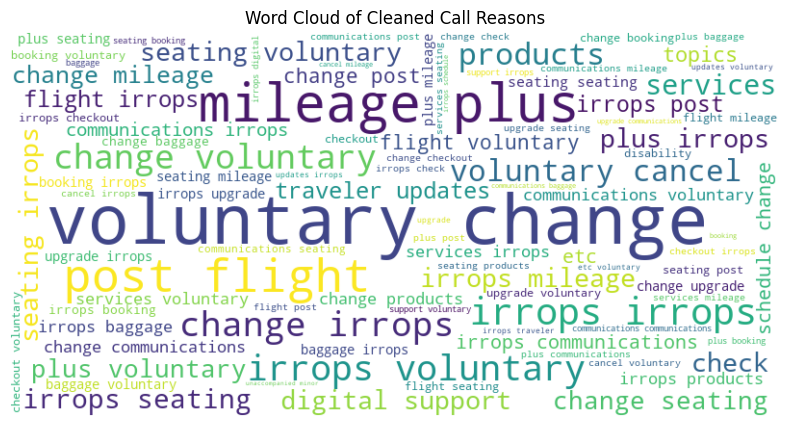

In [117]:
# Generate the word cloud
wordcloud_text = ' '.join(train['cleaned_call_reason'])  # Join all cleaned reasons into a single string

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(wordcloud_text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axes
plt.title('Word Cloud of Cleaned Call Reasons')
plt.show()

In [118]:
X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 101672 stored elements and shape (66653, 30)>

In [119]:
from sklearn.cluster import KMeans

# Choose the number of clusters (you can adjust this)
num_clusters = 40
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
train['cluster'] = kmeans.fit_predict(X)

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: ConvergenceWarning:

Number of distinct clusters (20) found smaller than n_clusters (40). Possibly due to duplicate points in X.



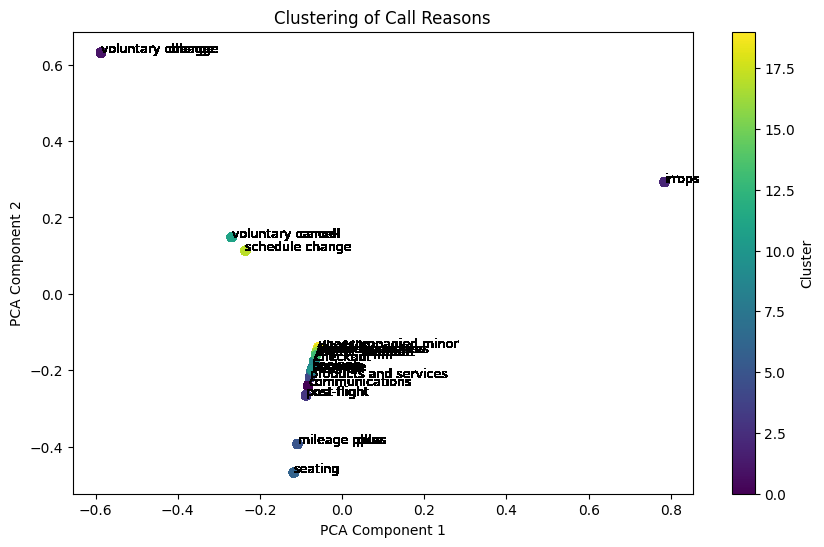

In [120]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for visualization
pca = PCA(n_components=2)
reduced_X = pca.fit_transform(X.toarray())

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(reduced_X[:, 0], reduced_X[:, 1], c=train['cluster'], cmap='viridis', marker='o')
for i, txt in enumerate(train['cleaned_call_reason']):
    plt.annotate(txt, (reduced_X[i, 0], reduced_X[i, 1]), fontsize=9)
plt.title('Clustering of Call Reasons')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster')
plt.show()

In [121]:
train.cluster

0        11
1         8
2         2
3        10
4         6
         ..
66648     5
66649     3
66650    10
66651    10
66652    13
Name: cluster, Length: 66653, dtype: int32

In [122]:
from pandasql import sqldf

In [123]:
pysqldf = lambda q: sqldf(q, globals())

# SQL query to get counts and proportions using window functions
query = """
SELECT 
    cluster,
    primary_call_reason,
    COUNT(*) AS reason_count,
    (COUNT(*) * 100.0 / SUM(COUNT(*)) OVER (PARTITION BY cluster)) AS proportion,
    FIRST_VALUE(primary_call_reason) OVER (PARTITION BY cluster ORDER BY COUNT(*) DESC) AS clean_primary_call_reason
FROM 
    train
GROUP BY 
    cluster, primary_call_reason
ORDER BY 
    cluster, proportion DESC;
"""

# Execute the query
reasons_cleaned = pysqldf(query)
reasons_cleaned


,cluster,primary_call_reason,reason_count,proportion,clean_primary_call_reason
0,0,Communications,3779,98.411458,Communications
1,0,Communications,61,1.588542,Communications
2,1,Voluntary Change,10291,94.865413,Voluntary Change
3,1,Voluntary Change,208,1.917404,Voluntary Change
4,1,Voluntary Change,200,1.843658,Voluntary Change
5,1,Voluntary Change,149,1.373525,Voluntary Change
6,2,IRROPS,13057,98.091804,IRROPS
7,2,IRROPS,254,1.908196,IRROPS
8,3,Post-Flight,3869,89.353349,Post-Flight
9,3,Post Flight,373,8.614319,Post-Flight


In [124]:
cluster_reasons = pysqldf("SELECT cluster,clean_primary_call_reason from reasons_cleaned GROUP BY cluster")

In [125]:
cluster_reasons

,cluster,clean_primary_call_reason
0,0,Communications
1,1,Voluntary Change
2,2,IRROPS
3,3,Post-Flight
4,4,Products and Services
5,5,Mileage Plus
6,6,Seating
7,7,Baggage
8,8,Booking
9,9,Check-In


In [126]:
# Define the query
query = """
SELECT train.*, cluster_reasons.clean_primary_call_reason
FROM train
LEFT JOIN  cluster_reasons ON train.cluster = cluster_reasons.cluster;
"""

train = pysqldf(query)



In [127]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cleaned_call_reason,cluster,clean_primary_call_reason
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,...,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,voluntary cancel,11,Voluntary Cancel
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1.0,calm,...,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,booking,8,Booking
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1.0,neutral,...,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,irrops,2,IRROPS
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,...,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,upgrade,10,Upgrade
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,...,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,seating,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,...,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,mileage plus,5,Mileage Plus
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1.0,calm,...,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,post flight,3,Post-Flight
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,...,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,upgrade,10,Upgrade
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1.0,calm,...,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,upgrade,10,Upgrade


In [128]:
cat_cols.remove('primary_call_reason')
cat_cols.append('clean_primary_call_reason')

In [129]:
cat_cols

['elite_level_code',
 'agent_tone',
 'customer_tone',
 'High_Volume',
 'clean_primary_call_reason']

In [130]:
cat_cols_test

['elite_level_code', 'agent_tone', 'customer_tone', 'High_Volume']

In [131]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST,
               (AST - max_AST) / max_AST * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST,
                   MAX(AST) OVER () AS max_AST
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST DESC; """ , locals())
    
    # Create a Plotly bar chart for AST
    fig_ast = go.Figure()
    
    # Add bar for AST
    fig_ast.add_trace(go.Bar(x=temp[i], y=temp['AST'], name='AST', marker_color='blue'))
    
    # Highlighting the extreme left and right bars
    fig_ast.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_ast.add_annotation(
            x=row[i],
            y=row['AST'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_ast.update_layout(title=f'AST Trends for {i}',
                          xaxis_title=i,
                          yaxis_title='AST Value',
                          template='plotly_white')
    
    fig_ast.show()

# Repeat similar structure for AST_HV trends
print("AST HV TRENDS:- \n \n")
for i in cat_cols[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST_HV,
               (AST_HV - max_AST_HV) / max_AST_HV * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST_HV,
                   MAX(AST_HV) OVER () AS max_AST_HV
            FROM train 
            WHERE High_Volume == 1 
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST_HV DESC;
        """ , locals())
    
    # Create a Plotly bar chart for AST_HV
    fig_ast_hv = go.Figure()
    
    # Add bar for AST_HV
    fig_ast_hv.add_trace(go.Bar(x=temp[i], y=temp['AST_HV'], name='AST_HV', marker_color='green'))
    
    # Highlighting the extreme left and right bars
    fig_ast_hv.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_ast_hv.add_annotation(
            x=row[i],
            y=row['AST_HV'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_ast_hv.update_layout(title=f'AST HV Trends for {i}',
                              xaxis_title=i,
                              yaxis_title='AST HV Value',
                              template='plotly_white')
    
    fig_ast_hv.show()

print("AHT TRENDS:- \n \n")
for i in cat_cols_test:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AHT,
               (AHT - max_AHT) / max_AHT * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AHT,
                   MAX(AHT) OVER () AS max_AHT
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AHT DESC; """ , locals())
    
    # Create a Plotly bar chart for AHT
    fig_aht = go.Figure()
    
    # Add bar for AHT
    fig_aht.add_trace(go.Bar(x=temp[i], y=temp['AHT'], name='AHT', marker_color='orange'))
    
    # Highlighting the extreme left and right bars
    fig_aht.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_aht.add_annotation(
            x=row[i],
            y=row['AHT'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_aht.update_layout(title=f'AHT Trends for {i}',
                          xaxis_title=i,
                          yaxis_title='AHT Value',
                          template='plotly_white')
    
    fig_aht.show()

for i in cat_cols_test[:-1]:  # Exclude the last column
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AHT_HV,
               (AHT_HV - max_AHT_HV) / max_AHT_HV * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AHT_HV,
                   MAX(AHT_HV) OVER () AS max_AHT_HV
            FROM train 
            WHERE High_Volume == 1 
            GROUP BY {i}
        ) AS subquery
        ORDER BY AHT_HV DESC;
        """ , locals())
    
    # Create a Plotly bar chart for AHT_HV
    fig_aht_hv = go.Figure()
    
    # Add bar for AHT_HV
    fig_aht_hv.add_trace(go.Bar(x=temp[i], y=temp['AHT_HV'], name='AHT_HV', marker_color='purple'))
    
    # Highlighting the extreme left and right bars
    fig_aht_hv.update_traces(marker=dict(line=dict(width=2, color='black')))
    
    # Display absolute percentage difference above bars
    for index, row in temp.iterrows():
        fig_aht_hv.add_annotation(
            x=row[i],
            y=row['AHT_HV'],
            text=f"{row['percentage_difference']:.2f}%",
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=-40,
            font=dict(color='red')
        )

    fig_aht_hv.update_layout(title=f'AHT HV Trends for {i}',
                              xaxis_title=i,
                              yaxis_title='AHT HV Value',
                              template='plotly_white')
    
    fig_aht_hv.show()

AST TRENDS:- 
 



AST HV TRENDS:- 
 



AHT TRENDS:- 
 



In [132]:
train = train.drop('cleaned_call_reason',axis =1)

In [133]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1.0,calm,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1.0,neutral,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2.0,neutral,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1.0,calm,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1.0,calm,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1.0,calm,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [134]:
train[num_cols]

,HT,ST,AST,AHT,AST_HV,AHT_HV,average_sentiment,silence_percent_average
0,31.0,7.0,7.0,10.893424,0.0,0.0,-0.04,0.39
1,12.0,3.0,3.0,11.471939,0.0,0.0,0.02,0.35
2,19.0,8.0,8.0,11.594005,0.0,0.0,-0.13,0.32
3,7.0,5.0,5.0,10.270718,0.0,0.0,-0.20,0.20
4,9.0,10.0,10.0,10.635762,0.0,0.0,-0.05,0.35
...,...,...,...,...,...,...,...,...
66648,10.0,6.0,6.0,15.000000,0.0,0.0,-0.19,0.51
66649,28.0,9.0,9.0,18.666667,0.0,0.0,0.05,0.34
66650,8.0,3.0,3.0,18.500000,0.0,0.0,0.03,0.22
66651,6.0,6.0,6.0,4.750000,0.0,0.0,0.05,0.42


In [135]:
train[cat_cols]

,elite_level_code,agent_tone,customer_tone,High_Volume,clean_primary_call_reason
0,4.0,neutral,angry,0,Voluntary Cancel
1,-1.0,calm,neutral,0,Booking
2,-1.0,neutral,polite,0,IRROPS
3,2.0,neutral,frustrated,0,Upgrade
4,0.0,neutral,polite,0,Seating
...,...,...,...,...,...
66648,2.0,neutral,frustrated,0,Mileage Plus
66649,-1.0,calm,calm,0,Post-Flight
66650,1.0,calm,frustrated,0,Upgrade
66651,-1.0,calm,polite,0,Upgrade


In [136]:
train['elite_level_code'] = train['elite_level_code'].astype(int)

In [137]:
all_features = cat_cols+num_cols

In [138]:
train[all_features]

,elite_level_code,agent_tone,customer_tone,High_Volume,clean_primary_call_reason,HT,ST,AST,AHT,AST_HV,AHT_HV,average_sentiment,silence_percent_average
0,4,neutral,angry,0,Voluntary Cancel,31.0,7.0,7.0,10.893424,0.0,0.0,-0.04,0.39
1,-1,calm,neutral,0,Booking,12.0,3.0,3.0,11.471939,0.0,0.0,0.02,0.35
2,-1,neutral,polite,0,IRROPS,19.0,8.0,8.0,11.594005,0.0,0.0,-0.13,0.32
3,2,neutral,frustrated,0,Upgrade,7.0,5.0,5.0,10.270718,0.0,0.0,-0.20,0.20
4,0,neutral,polite,0,Seating,9.0,10.0,10.0,10.635762,0.0,0.0,-0.05,0.35
...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2,neutral,frustrated,0,Mileage Plus,10.0,6.0,6.0,15.000000,0.0,0.0,-0.19,0.51
66649,-1,calm,calm,0,Post-Flight,28.0,9.0,9.0,18.666667,0.0,0.0,0.05,0.34
66650,1,calm,frustrated,0,Upgrade,8.0,3.0,3.0,18.500000,0.0,0.0,0.03,0.22
66651,-1,calm,polite,0,Upgrade,6.0,6.0,6.0,4.750000,0.0,0.0,0.05,0.42


In [139]:
cat_cols

['elite_level_code',
 'agent_tone',
 'customer_tone',
 'High_Volume',
 'clean_primary_call_reason']

In [140]:
train[cat_cols].dtypes

elite_level_code              int64
agent_tone                   object
customer_tone                object
High_Volume                   int64
clean_primary_call_reason    object
dtype: object

In [141]:
train

,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,neutral,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,calm,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,neutral,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,neutral,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,neutral,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,neutral,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,calm,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,calm,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,calm,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [142]:
train.to_csv('training_final.csv')

In [143]:
test.to_csv('test_final.csv')
test2.to_csv('test_from_train_final.csv')

KEY DRIVERS ANALYSIS

In [265]:
train = pd.read_csv('training_final.csv')

In [266]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [267]:
cat_cols = ['elite_level_code',
 'agent_tone',
 'customer_tone',
 'clean_primary_call_reason']

In [268]:
train[cat_cols]

,elite_level_code,agent_tone,customer_tone,clean_primary_call_reason
0,4,neutral,angry,Voluntary Cancel
1,-1,calm,neutral,Booking
2,-1,neutral,polite,IRROPS
3,2,neutral,frustrated,Upgrade
4,0,neutral,polite,Seating
...,...,...,...,...
66648,2,neutral,frustrated,Mileage Plus
66649,-1,calm,calm,Post-Flight
66650,1,calm,frustrated,Upgrade
66651,-1,calm,polite,Upgrade


In [269]:
dictionaries_list = []

# Loop through each categorical column
for i in cat_cols:
    # Construct the SQL query
    query_sentiment = f"SELECT {i}, AVG(average_sentiment) AS Sentiment FROM train GROUP BY {i} ORDER BY Sentiment ASC"
    
    # Execute the SQL query
    sentiment = psql.sqldf(query_sentiment, locals())
    print(sentiment)
    # Create a dictionary with keys as sentiment.iloc[:, 0] and values as sequential integers
    sentiment_dict = dict(zip(sentiment.iloc[:, 0], range(1, len(sentiment) + 1)))
    
    # Append the dictionary to the list
    dictionaries_list.append(sentiment_dict)

# Print the list of dictionaries
(dictionaries_list)

   elite_level_code  Sentiment
0                 4  -0.036905
1                 1  -0.035925
2                -1  -0.033365
3                 0  -0.033209
4                 3  -0.032857
5                 2  -0.031441
6                 5  -0.029977
   agent_tone  Sentiment
0     Unknown  -0.637938
1       angry  -0.615273
2  frustrated  -0.329933
3     neutral  -0.080335
4        calm   0.101260
5      polite   0.674691
  customer_tone  Sentiment
0    frustrated  -0.034625
1        polite  -0.034524
2       neutral  -0.033754
3         angry  -0.032708
4          calm  -0.032530
   clean_primary_call_reason  Sentiment
0                     IRROPS  -0.074065
1                   Checkout  -0.069030
2                Post-Flight  -0.063914
3                        ETC  -0.049327
4                   Check-In  -0.042993
5            Digital Support  -0.042131
6             Communications  -0.036392
7      Products and Services  -0.034430
8            Schedule Change  -0.033844
9           Vol

[{4: 1, 1: 2, -1: 3, 0: 4, 3: 5, 2: 6, 5: 7},
 {'Unknown': 1,
  'angry': 2,
  'frustrated': 3,
  'neutral': 4,
  'calm': 5,
  'polite': 6},
 {'frustrated': 1, 'polite': 2, 'neutral': 3, 'angry': 4, 'calm': 5},
 {'IRROPS': 1,
  'Checkout': 2,
  'Post-Flight': 3,
  'ETC': 4,
  'Check-In': 5,
  'Digital Support': 6,
  'Communications': 7,
  'Products and Services': 8,
  'Schedule Change': 9,
  'Voluntary Cancel': 10,
  'Mileage Plus': 11,
  'Baggage': 12,
  'Upgrade': 13,
  'Unaccompanied Minor': 14,
  'Booking': 15,
  'Other Topics': 16,
  'Voluntary Change': 17,
  'Seating': 18,
  'Traveler Updates': 19,
  'Disability': 20}]

In [270]:
for i, mapping in zip(cat_cols, dictionaries_list):
    # Use the replace method to perform ordinal encoding
    train[i] = train[i].replace(mapping)

# Display the updated DataFrame
train

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\3348195374.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train[i] = train[i].replace(mapping)


,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,1,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,10
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,3,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,15
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,3,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,1
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,6,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,13
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,4,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,6,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,11
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,3,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,3
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,2,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,13
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,3,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,13


In [271]:
train[cat_cols].corr('spearman')

,elite_level_code,agent_tone,customer_tone,clean_primary_call_reason
elite_level_code,1.000000,0.011959,-0.000105,0.000325
agent_tone,0.011959,1.000000,0.004285,0.149581
customer_tone,-0.000105,0.004285,1.000000,-0.001571
clean_primary_call_reason,0.000325,0.149581,-0.001571,1.000000


In [272]:
train.isnull().sum()

Unnamed: 0                     0
call_start_datetime            0
call_id                        0
customer_id                    0
agent_id                       0
agent_assigned_datetime        0
call_end_datetime              0
call_transcript                0
customer_name                  0
elite_level_code               0
agent_tone                     0
customer_tone                  0
average_sentiment            101
silence_percent_average        0
primary_call_reason            0
HT                             0
ST                             0
AHT                            0
AST                            0
rounded_hour                   0
High_Volume                    0
AST_HV                         0
AHT_HV                         0
cluster                        0
clean_primary_call_reason      0
dtype: int64

In [273]:
train = train.dropna()

In [276]:
train[cat_cols_with_target].astype(str)

,elite_level_code,agent_tone,customer_tone,High_Volume,clean_primary_call_reason
0,1,4,4,0,10
1,3,5,3,0,15
2,3,4,2,0,1
3,6,4,1,0,13
4,4,4,2,0,18
...,...,...,...,...,...
66648,6,4,1,0,11
66649,3,5,5,0,3
66650,2,5,1,0,13
66651,3,5,2,0,13


In [147]:
num_cols

['HT',
 'ST',
 'AST',
 'AHT',
 'AST_HV',
 'AHT_HV',
 'average_sentiment',
 'silence_percent_average']

In [279]:
target_col = 'clean_primary_call_reason'


In [278]:
num_cols = ['HT','ST','AST','AHT','AST_HV','AHT_HV','average_sentiment', 'silence_percent_average']

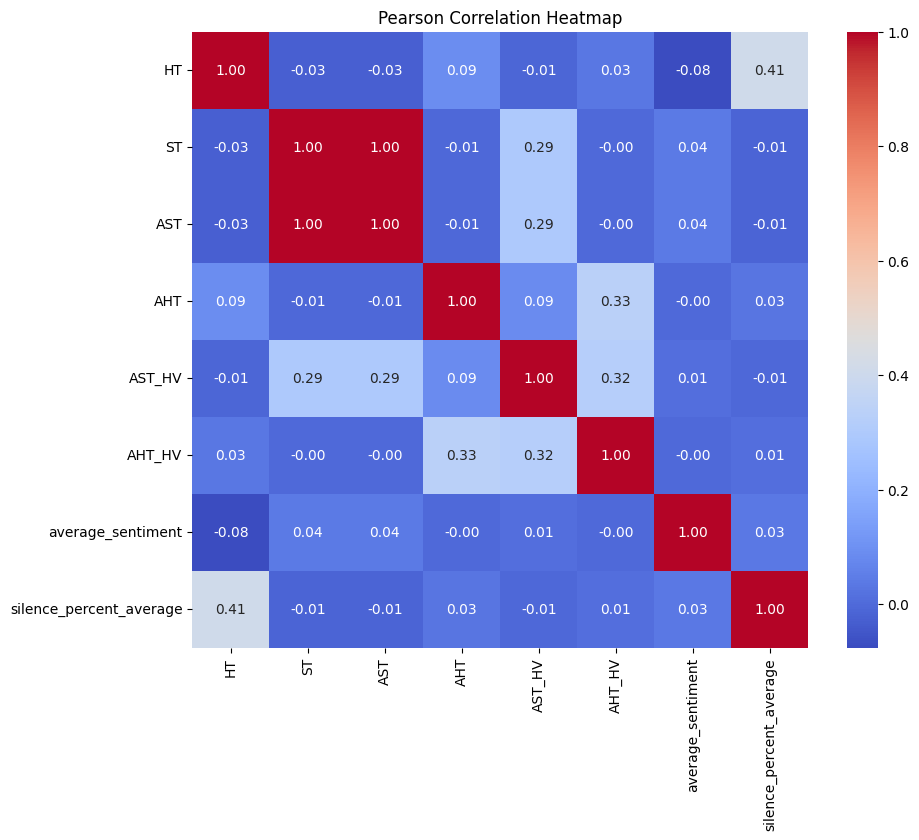

In [280]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Step 1: Calculate the Pearson correlation matrix
correlation_matrix = train[num_cols].corr(method='pearson')

# Step 2: Create the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Pearson Correlation Heatmap")
plt.show()

In [281]:
train[cat_cols]

,elite_level_code,agent_tone,customer_tone,clean_primary_call_reason
0,1,4,4,10
1,3,5,3,15
2,3,4,2,1
3,6,4,1,13
4,4,4,2,18
...,...,...,...,...
66648,6,4,1,11
66649,3,5,5,3
66650,2,5,1,13
66651,3,5,2,13


In [285]:
cat_cols

['elite_level_code',
 'agent_tone',
 'customer_tone',
 'clean_primary_call_reason']

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\1190245017.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[cat_cols] = train[cat_cols].astype('category')


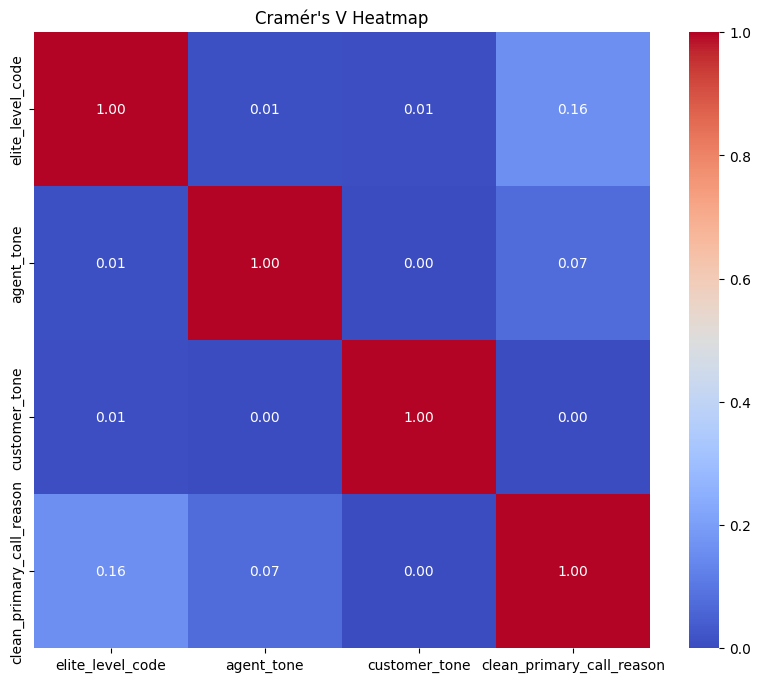

In [286]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt


# Step 1: Convert specified columns to category type
train[cat_cols] = train[cat_cols].astype('category')

# Step 2: Define function to calculate Cramér's V
def cramers_v(x, y):
    contingency_table = pd.crosstab(x, y)
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    r, k = contingency_table.shape
    phi2 = chi2 / n
    phi2corr = max(0, phi2 - (k - 1) * (r - 1) / (n - 1))
    r_corrected = r - (r - 1)**2 / (n - 1)
    k_corrected = k - (k - 1)**2 / (n - 1)
    
    return np.sqrt(phi2corr / min(r_corrected - 1, k_corrected - 1))

# Step 3: Calculate Cramér's V for each pair of categorical columns
cramers_v_matrix = pd.DataFrame(index=cat_cols, columns=cat_cols)

for i in cat_cols:
    for j in cat_cols:
        if i == j:
            cramers_v_matrix.loc[i, j] = 1.0  # Perfect correlation with itself
        else:
            cramers_v_matrix.loc[i, j] = cramers_v(train[i], train[j])

# Convert the values to float for heatmap visualization
cramers_v_matrix = cramers_v_matrix.astype(float)

# Step 4: Display the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Cramér's V Heatmap")
plt.show()

In [155]:
predictors = num_cols+cat_cols[:-1]

In [288]:
predictors

['HT',
 'ST',
 'AST',
 'AHT',
 'AST_HV',
 'AHT_HV',
 'average_sentiment',
 'silence_percent_average',
 'elite_level_code',
 'agent_tone',
 'customer_tone',
 'High_Volume']

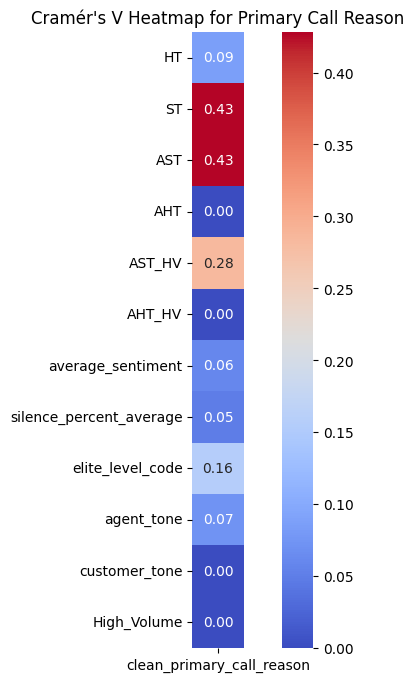

In [296]:
cramers_v_matrix = pd.DataFrame(index=predictors, columns=[target_col])

for i in predictors :
    for j in [target_col]:
        if i == j:
            cramers_v_matrix.loc[i, j] = 1.0  # Perfect correlation with itself
        else:
            cramers_v_matrix.loc[i, j] = cramers_v(train[i], train[j])

# Convert the values to float for heatmap visualization
cramers_v_matrix = cramers_v_matrix.astype(float)

# Step 4: Display the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Cramér's V Heatmap for Primary Call Reason")
plt.show()

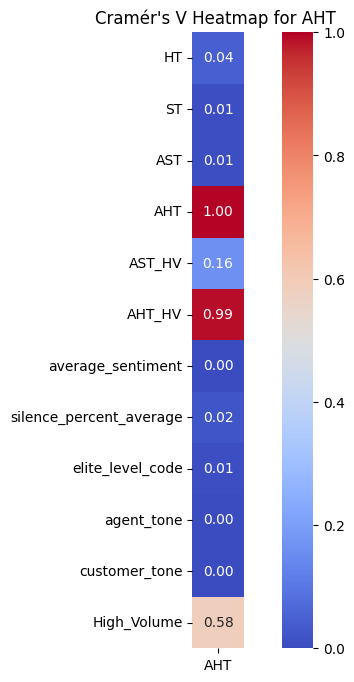

In [295]:
cramers_v_matrix = pd.DataFrame(index=predictors, columns=['AHT'])

for i in predictors :
    for j in ['AHT']:
        if i == j:
            cramers_v_matrix.loc[i, j] = 1.0  # Perfect correlation with itself
        else:
            cramers_v_matrix.loc[i, j] = cramers_v(train[i], train[j])

# Convert the values to float for heatmap visualization
cramers_v_matrix = cramers_v_matrix.astype(float)

# Step 4: Display the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Cramér's V Heatmap for AHT ")
plt.show()

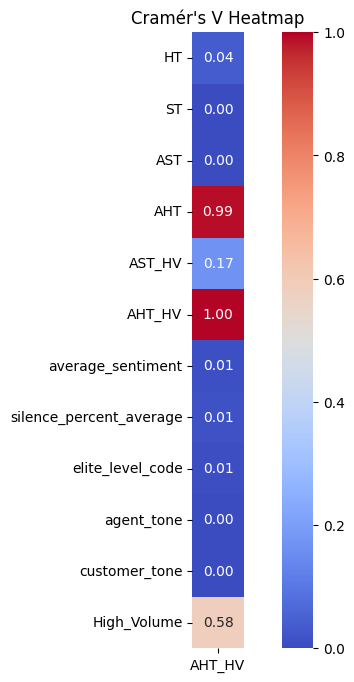

In [291]:
cramers_v_matrix = pd.DataFrame(index=predictors, columns=['AHT_HV'])

for i in predictors :
    for j in ['AHT_HV']:
        if i == j:
            cramers_v_matrix.loc[i, j] = 1.0  # Perfect correlation with itself
        else:
            cramers_v_matrix.loc[i, j] = cramers_v(train[i], train[j])

# Convert the values to float for heatmap visualization
cramers_v_matrix = cramers_v_matrix.astype(float)

# Step 4: Display the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Cramér's V Heatmap")
plt.show()

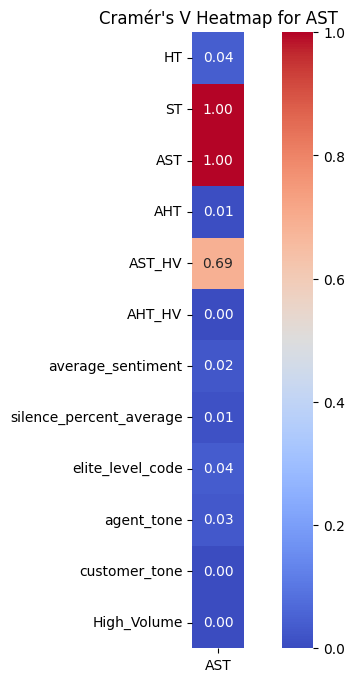

In [294]:
cramers_v_matrix = pd.DataFrame(index=predictors, columns=['AST'])

for i in predictors :
    for j in ['AST']:
        if i == j:
            cramers_v_matrix.loc[i, j] = 1.0  # Perfect correlation with itself
        else:
            cramers_v_matrix.loc[i, j] = cramers_v(train[i], train[j])

# Convert the values to float for heatmap visualization
cramers_v_matrix = cramers_v_matrix.astype(float)

# Step 4: Display the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Cramér's V Heatmap for AST")
plt.show()

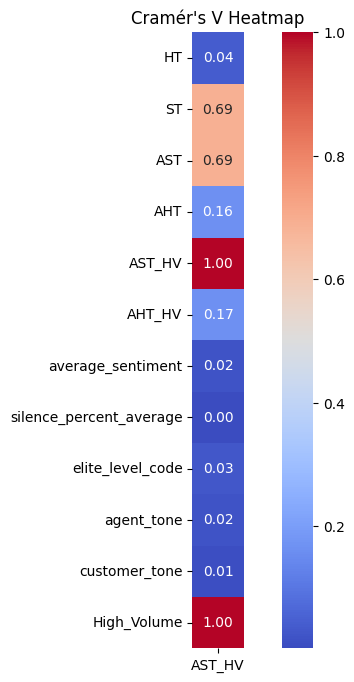

In [293]:
cramers_v_matrix = pd.DataFrame(index=predictors, columns=['AST_HV'])

for i in predictors :
    for j in ['AST_HV']:
        if i == j:
            cramers_v_matrix.loc[i, j] = 1.0  # Perfect correlation with itself
        else:
            cramers_v_matrix.loc[i, j] = cramers_v(train[i], train[j])

# Convert the values to float for heatmap visualization
cramers_v_matrix = cramers_v_matrix.astype(float)

# Step 4: Display the heatmap using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Cramér's V Heatmap")
plt.show()

In [158]:
train[num_cols]

,HT,ST,AST,AHT,AST_HV,AHT_HV,average_sentiment,silence_percent_average
0,31.0,7.0,7.0,10.893424,0.0,0.0,-0.04,0.39
1,12.0,3.0,3.0,11.471939,0.0,0.0,0.02,0.35
2,19.0,8.0,8.0,11.594005,0.0,0.0,-0.13,0.32
3,7.0,5.0,5.0,10.270718,0.0,0.0,-0.20,0.20
4,9.0,10.0,10.0,10.635762,0.0,0.0,-0.05,0.35
...,...,...,...,...,...,...,...,...
66648,10.0,6.0,6.0,15.000000,0.0,0.0,-0.19,0.51
66649,28.0,9.0,9.0,18.666667,0.0,0.0,0.05,0.34
66650,8.0,3.0,3.0,18.500000,0.0,0.0,0.03,0.22
66651,6.0,6.0,6.0,4.750000,0.0,0.0,0.05,0.42


In [159]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"""
        SELECT {i}, 
               AST,
               (AST - max_AST) / max_AST * 100 AS percentage_difference
        FROM (
            SELECT {i}, 
                   AST,
                   MAX(AST) OVER () AS max_AST
            FROM train
            GROUP BY {i}
        ) AS subquery
        ORDER BY AST; """ , locals())
    print(f"AST for {i}")
    print(temp)
    print("\n")


AST TRENDS:- 
 

AST for elite_level_code
  elite_level_code   AST  percentage_difference
0               -1   3.0                  -70.0
1                2   5.0                  -50.0
2                5   5.0                  -50.0
3                4   7.0                  -30.0
4                1   8.0                  -20.0
5                3   9.0                  -10.0
6                0  10.0                    0.0


AST for agent_tone
   agent_tone   AST  percentage_difference
0        calm   3.0             -75.000000
1     Unknown   7.0             -41.666667
2     neutral   7.0             -41.666667
3       angry   9.0             -25.000000
4  frustrated   9.0             -25.000000
5      polite  12.0               0.000000


AST for customer_tone
  customer_tone  AST  percentage_difference
0       neutral  3.0                  -62.5
1          calm  5.0                  -37.5
2    frustrated  5.0                  -37.5
3         angry  7.0                  -12.5
4       

In [160]:
print("AST TRENDS:- \n \n")
for i in cat_cols:
    temp = psql.sqldf(f"""
        WITH MostFrequent AS (
            SELECT {i}, 
                   AST,
                   COUNT(*) AS freq,
                   RANK() OVER (ORDER BY COUNT(*) DESC) AS rank
            FROM train
            GROUP BY {i}, AST
        ),
        MostFrequentAST AS (
            SELECT AST AS most_frequent_AST
            FROM MostFrequent
            WHERE rank = 1
            LIMIT 1
        )
        SELECT 
            mf.{i}, 
            mf.AST,
            (mf.AST - mfa.most_frequent_AST) / mfa.most_frequent_AST * 100 AS percentage_difference
        FROM 
            MostFrequent mf
        CROSS JOIN 
            MostFrequentAST mfa
        ORDER BY 
            mf.AST;
    """, locals())

    print(f"AST for {i}")
    print(temp)
    print("\n")

AST TRENDS:- 
 

AST for elite_level_code
   elite_level_code   AST  percentage_difference
0                -1   3.0                  -70.0
1                 1   3.0                  -70.0
2                 0   3.0                  -70.0
3                 2   3.0                  -70.0
4                 3   3.0                  -70.0
..              ...   ...                    ...
86                0  15.0                   50.0
87                2  15.0                   50.0
88                3  15.0                   50.0
89                4  15.0                   50.0
90                5  15.0                   50.0

[91 rows x 3 columns]


AST for agent_tone
    agent_tone   AST  percentage_difference
0      neutral   3.0             -57.142857
1         calm   3.0             -57.142857
2   frustrated   3.0             -57.142857
3        angry   3.0             -57.142857
4      Unknown   3.0             -57.142857
..         ...   ...                    ...
69     Unknown  14

# DATA VISUALIZATION

In [161]:
train = pd.read_csv("C:/Users/Acer/Desktop/training_final.csv")

In [162]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


WITH GRAPHS

In [165]:
for j in num_cols[2:4]:
    print('ORDERING WITH RESPECT TO ', j, '\n')
    for i in cat_cols:
        tmp = psql.sqldf(f"""
            WITH t AS (
                SELECT {i}, 
                       ({j}) , 
                       COUNT(*) AS count, 
                       ROW_NUMBER() OVER (ORDER BY COUNT(*) DESC) AS ORDINAL_RANK
                FROM train 
                GROUP BY {i}
            )
            SELECT t.*, 
                   100 * ({j} - FIRST_VALUE({j}) OVER (ORDER BY count DESC)) / FIRST_VALUE({j}) OVER (ORDER BY count DESC) AS percent_difference
            FROM t
            ORDER BY count DESC;
        """, locals())
        print(tmp)

ORDERING WITH RESPECT TO  AST 

   elite_level_code   AST  count  ORDINAL_RANK  percent_difference
0                -1   3.0  23959             1            0.000000
1                 1   8.0  13338             2          166.666667
2                 0  10.0  13338             3          233.333333
3                 2   5.0   7468             4           66.666667
4                 3   9.0   5284             5          200.000000
5                 4   7.0   1961             6          133.333333
6                 5   5.0   1305             7           66.666667
   agent_tone   AST  count  ORDINAL_RANK  percent_difference
0     neutral   7.0  39688             1            0.000000
1        calm   3.0  22882             2          -57.142857
2  frustrated   9.0   3438             3           28.571429
3       angry   9.0    366             4           28.571429
4     Unknown   7.0    198             5            0.000000
5      polite  12.0     81             6           71.428571
  cus

In [166]:
cat_cols = cat_cols + [target_col]

In [167]:
for j in num_cols[4:]:
    print('ORDERING WITH RESPECT TO ', j, '\n')
    for i in cat_cols:
        tmp = psql.sqldf(f"""
            WITH t AS (
                SELECT {i}, 
                       AVG({j}) AS avg_val, 
                       COUNT(*) AS count, 
                       ROW_NUMBER() OVER (ORDER BY COUNT(*) DESC) AS ORDINAL_RANK
                FROM train 
                GROUP BY {i}
            )
            SELECT t.*, 
                   100 * (avg_val - FIRST_VALUE(avg_val) OVER (ORDER BY count DESC)) / FIRST_VALUE(avg_val) OVER (ORDER BY count DESC) AS percent_difference
            FROM t
            ORDER BY count DESC;
        """, locals())
        print(tmp)

ORDERING WITH RESPECT TO  AST_HV 

   elite_level_code   avg_val  count  ORDINAL_RANK  percent_difference
0                -1  3.525565  23959             1            0.000000
1                 1  3.459889  13338             2           -1.862836
2                 0  3.417004  13338             3           -3.079236
3                 2  3.466524   7468             4           -1.674644
4                 3  3.428085   5284             5           -2.764939
5                 4  3.281489   1961             6           -6.923018
6                 5  3.242146   1305             7           -8.038965
   agent_tone   avg_val  count  ORDINAL_RANK  percent_difference
0     neutral  3.441720  39688             1            0.000000
1        calm  3.513329  22882             2            2.080612
2  frustrated  3.326062   3438             3           -3.360492
3       angry  3.642077    366             4            5.821393
4     Unknown  4.065657    198             5           18.128612
5      

FINAL

In [168]:
import plotly.graph_objects as go

# Loop through the specified numerical columns
for j in num_cols[2:4]:
    print('ORDERING WITH RESPECT TO ', j, '\n')
    for i in cat_cols:
        # Execute the SQL query to calculate values and percentage differences
        tmp = psql.sqldf(f"""
            WITH t AS (
                SELECT {i}, 
                       {j} AS value, 
                       COUNT(*) AS count, 
                       ROW_NUMBER() OVER (ORDER BY COUNT(*) DESC) AS ORDINAL_RANK
                FROM train 
                GROUP BY {i}
            )
            SELECT t.*, 
                   100 * (value - FIRST_VALUE(value) OVER (ORDER BY count DESC)) / FIRST_VALUE(value) OVER (ORDER BY count DESC) AS percent_difference
            FROM t
            ORDER BY count DESC;
        """, locals())

        # Create a Plotly bar chart for the values
        fig_value = go.Figure()

        # Find the maximum ORDINAL_RANK for highlighting
        max_ordinal_rank = tmp['ORDINAL_RANK'].max()

        # Add bars for values, highlighting the one with ORDINAL_RANK = 1 and least common
        for index, row in tmp.iterrows():
            if row['ORDINAL_RANK'] == 1:
                color = 'orange'  # Highlight color for the most common subclass
                legend_name = f'{row[i]} (Most Common)'
            elif row['ORDINAL_RANK'] == max_ordinal_rank:
                color = 'blue'  # Contrasting color for the least common subclass
                legend_name = f'{row[i]} (Least Common)'  # Updated legend name
            else:
                color = 'green'  # Default color for other subclasses
                legend_name = f'{row[i]}'

            # Add bar trace with appropriate colors and names
            fig_value.add_trace(go.Bar(x=[row[i]], y=[row['value']], name=legend_name, marker_color=color))

        # Highlighting the extreme left and right bars
        fig_value.update_traces(marker=dict(line=dict(width=2, color='black')))
        
        # Display absolute percentage difference above bars with only numeric values
        for index, row in tmp.iterrows():
            fig_value.add_annotation(
                x=row[i],  # Use the x-axis label directly from the DataFrame
                y=row['value'],
                text=f"{row['percent_difference']:.2f}%",  # Only show percentage difference
                showarrow=True,
                arrowhead=2,
                ax=0,
                ay=-40,
                font=dict(color='red')
            )

        fig_value.update_layout(title=f'{j} Trends for {i}',
                                xaxis_title=i,
                                yaxis_title=f'Value {j}',
                                template='plotly_white')
        
        fig_value.show()

ORDERING WITH RESPECT TO  AST 



ORDERING WITH RESPECT TO  AHT 



In [169]:
import plotly.graph_objects as go

# Loop through the specified numerical columns
for j in num_cols[4:]:
    print('ORDERING WITH RESPECT TO ', j, '\n')
    for i in cat_cols:
        # Execute the SQL query to calculate average values and percentage differences
        tmp = psql.sqldf(f"""
            WITH t AS (
                SELECT {i}, 
                       AVG({j}) AS avg_val, 
                       COUNT(*) AS count, 
                       ROW_NUMBER() OVER (ORDER BY COUNT(*) DESC) AS ORDINAL_RANK
                FROM train 
                GROUP BY {i}
            )
            SELECT t.*, 
                   100 * (avg_val - FIRST_VALUE(avg_val) OVER (ORDER BY count DESC)) / FIRST_VALUE(avg_val) OVER (ORDER BY count DESC) AS percent_difference
            FROM t
            ORDER BY count DESC;
        """, locals())

        # Create a Plotly bar chart for the average values
        fig_avg = go.Figure()

        # Find the maximum and minimum ORDINAL_RANK for highlighting
        max_ordinal_rank = tmp['ORDINAL_RANK'].max()
        min_ordinal_rank = tmp['ORDINAL_RANK'].min()

        # Add bars for average values, highlighting the most common and least common subclasses
        for index, row in tmp.iterrows():
            if row['ORDINAL_RANK'] == 1:
                color = 'orange'  # Highlight color for the most common subclass
                legend_name = f'{row[i]} (Most Common)'
            elif row['ORDINAL_RANK'] == max_ordinal_rank:
                color = 'blue'  # Contrasting color for the least common subclass (highest ORDINAL_RANK)
                legend_name = f'{row[i]} (Least Common)'  # Updated legend name
            else:
                color = 'green'  # Default color for other subclasses
                legend_name = f'{row[i]}'

            # Add bar trace with appropriate colors and names
            fig_avg.add_trace(go.Bar(x=[row[i]], y=[row['avg_val']], name=legend_name, marker_color=color))

        # Highlighting the extreme left and right bars
        fig_avg.update_traces(marker=dict(line=dict(width=2, color='black')))
        
        # Display absolute percentage difference above bars with only numeric values
        for index, row in tmp.iterrows():
            percent_diff = row['percent_difference']
            if percent_diff is not None:  # Check if percent_diff is not None
                fig_avg.add_annotation(
                    x=row[i],  # Use the x-axis label directly from the DataFrame
                    y=row['avg_val'],
                    text=f"{percent_diff:.2f}%",  # Only show percentage difference
                    showarrow=True,
                    arrowhead=2,
                    ax=0,
                    ay=-40,
                    font=dict(color='red')
                )

        fig_avg.update_layout(title=f'Average {j} Trends for {i}',
                              xaxis_title=i,
                              yaxis_title=f'Average {j} Value',
                              template='plotly_white')
        
        fig_avg.show()

ORDERING WITH RESPECT TO  AST_HV 



ORDERING WITH RESPECT TO  AHT_HV 



ORDERING WITH RESPECT TO  average_sentiment 



ORDERING WITH RESPECT TO  silence_percent_average 



In [170]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [171]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [172]:
train.isnull().sum()

Unnamed: 0                     0
call_start_datetime            0
call_id                        0
customer_id                    0
agent_id                       0
agent_assigned_datetime        0
call_end_datetime              0
call_transcript                0
customer_name                  0
elite_level_code               0
agent_tone                     0
customer_tone                  0
average_sentiment            101
silence_percent_average        0
primary_call_reason            0
HT                             0
ST                             0
AHT                            0
AST                            0
rounded_hour                   0
High_Volume                    0
AST_HV                         0
AHT_HV                         0
cluster                        0
clean_primary_call_reason      0
dtype: int64

In [173]:
train.iloc[0,:]

Unnamed: 0                                                                   0
call_start_datetime                                 2024-07-31 23:56:00.000000
call_id                                                             4667960400
customer_id                                                         2033123310
agent_id                                                                963118
agent_assigned_datetime                             2024-08-01 00:03:00.000000
call_end_datetime                                   2024-08-01 00:34:00.000000
call_transcript              \n\nAgent: Thank you for calling United Airlin...
customer_name                                                   Matthew Foster
elite_level_code                                                             4
agent_tone                                                             neutral
customer_tone                                                            angry
average_sentiment                                   

In [174]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [175]:
num_cols

['HT',
 'ST',
 'AST',
 'AHT',
 'AST_HV',
 'AHT_HV',
 'average_sentiment',
 'silence_percent_average']

In [176]:
cat_cols = ['agent_tone',
 'customer_tone',
 'primary_call_reason',
 'clean_primary_call_reason']

In [177]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [178]:
train.dtypes

Unnamed: 0                     int64
call_start_datetime           object
call_id                        int64
customer_id                    int64
agent_id                       int64
agent_assigned_datetime       object
call_end_datetime             object
call_transcript               object
customer_name                 object
elite_level_code               int64
agent_tone                    object
customer_tone                 object
average_sentiment            float64
silence_percent_average      float64
primary_call_reason           object
HT                           float64
ST                           float64
AHT                          float64
AST                          float64
rounded_hour                  object
High_Volume                    int64
AST_HV                       float64
AHT_HV                       float64
cluster                        int64
clean_primary_call_reason     object
dtype: object

In [179]:
cat_cols = ['agent_tone', 'customer_tone', 'primary_call_reason', 'High_Volume', 'elite_level_code']

In [180]:
train[cat_cols] = train[cat_cols].astype(object)

In [181]:
num_cols = ['HT','ST','AST','AHT','AST_HV','AHT_HV', 'silence_percent_average'] # 'average_sentiment'

In [182]:
train[num_cols] = train[num_cols].astype(float)

In [183]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,HT,ST,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4,...,31.0,7.0,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.0,11,Voluntary Cancel
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,-1,...,12.0,3.0,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.0,8,Booking
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,-1,...,19.0,8.0,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.0,2,IRROPS
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2,...,7.0,5.0,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.0,10,Upgrade
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0,...,9.0,10.0,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.0,6,Seating
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66648,66648,2024-08-31 23:51:00.000000,7569738090,7367304988,783441,2024-08-31 23:57:00.000000,2024-09-01 00:07:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kevin Warner,2,...,10.0,6.0,15.000000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,5,Mileage Plus
66649,66649,2024-08-31 23:48:00.000000,1563273072,8022667294,413148,2024-08-31 23:57:00.000000,2024-09-01 00:25:00.000000,\n\nAgent: Thank you for calling United Airlin...,Dennis Singleton DDS,-1,...,28.0,9.0,18.666667,9.0,2024-08-31 23:00:00.000000,0,0.0,0.0,3,Post-Flight
66650,66650,2024-08-31 23:55:00.000000,8865997781,4474867021,980156,2024-08-31 23:58:00.000000,2024-09-01 00:06:00.000000,\n\nAgent: Thank you for calling United Airlin...,Paul Mitchell,1,...,8.0,3.0,18.500000,3.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade
66651,66651,2024-08-31 23:52:00.000000,8019240181,9762042472,616988,2024-08-31 23:58:00.000000,2024-09-01 00:04:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kaylee Lang,-1,...,6.0,6.0,4.750000,6.0,2024-08-31 23:00:00.000000,0,0.0,0.0,10,Upgrade


In [184]:
cat_cols

['agent_tone',
 'customer_tone',
 'primary_call_reason',
 'High_Volume',
 'elite_level_code']

In [198]:
train.columns

Index(['Unnamed: 0', 'call_start_datetime', 'call_id', 'customer_id',
       'agent_id', 'agent_assigned_datetime', 'call_end_datetime',
       'call_transcript', 'customer_name', 'elite_level_code', 'agent_tone',
       'customer_tone', 'average_sentiment', 'silence_percent_average',
       'primary_call_reason', 'HT', 'ST', 'AHT', 'AST', 'rounded_hour',
       'High_Volume', 'AST_HV', 'AHT_HV', 'cluster',
       'clean_primary_call_reason'],
      dtype='object')

In [188]:
cat_cols = ['agent_tone',
 'customer_tone',
 'clean_primary_call_reason',
 'High_Volume',
 'elite_level_code']

In [189]:
train.clean_primary_call_reason

0        Voluntary Cancel
1                 Booking
2                  IRROPS
3                 Upgrade
4                 Seating
               ...       
66648        Mileage Plus
66649         Post-Flight
66650             Upgrade
66651             Upgrade
66652     Digital Support
Name: clean_primary_call_reason, Length: 66653, dtype: object

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target
  warnings.warn(msg, UserWarning)
c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning: Clustering metrics expects discr

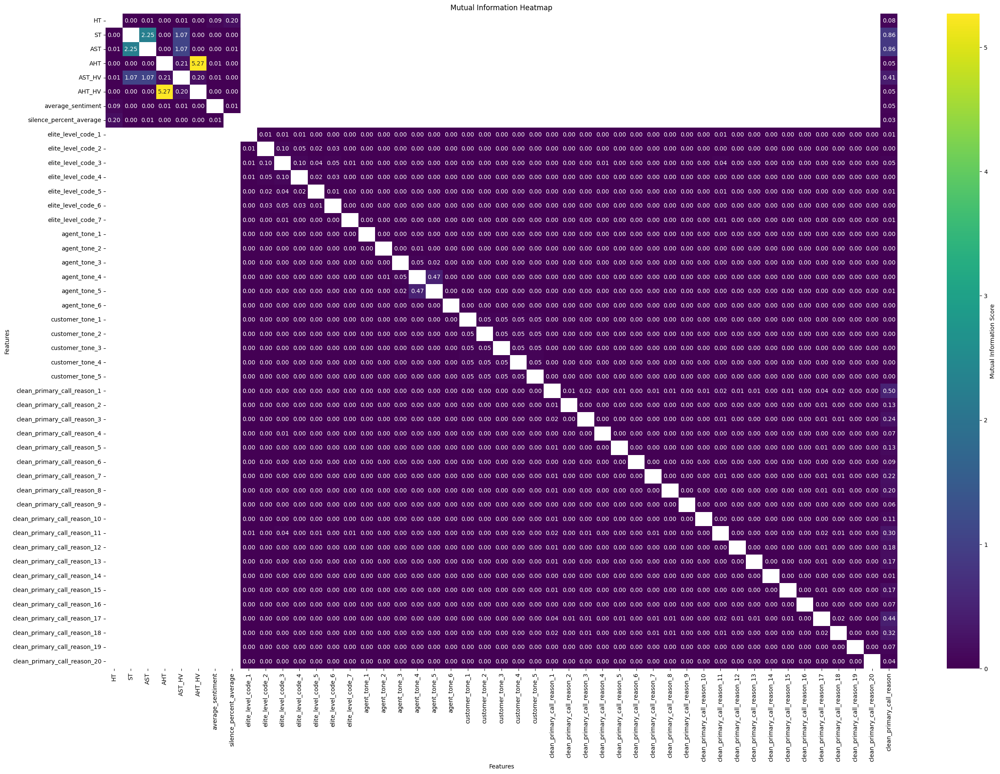

In [297]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
import seaborn as sns
import matplotlib.pyplot as plt



# Step 2: One-Hot Encode Categorical Columns
train_encoded = pd.get_dummies(train[cat_cols], drop_first=False)  # Drop first to avoid multicollinearity

# Combine encoded categorical columns with numerical columns
train_combined = pd.concat([train[num_cols], train_encoded], axis=1)

# Step 3: Initialize a DataFrame to hold mutual information scores
mutual_info_matrix = pd.DataFrame(index=train_combined.columns, columns=train_combined.columns)

# Step 4: Compute mutual information scores for categorical vs target
target = train['clean_primary_call_reason']

for col in train_combined.columns:
    if col != 'clean_primary_call_reason':  # Exclude the target variable itself
        score = mutual_info_classif(train_combined[[col]], target, discrete_features=True)
        mutual_info_matrix.loc[col, 'clean_primary_call_reason'] = score[0]

# Step 5: Compute mutual information scores for numerical vs numerical features
for i in range(len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        score = mutual_info_regression(train_combined[[num_cols[i]]], train_combined[num_cols[j]])
        mutual_info_matrix.loc[num_cols[i], num_cols[j]] = score[0]
        mutual_info_matrix.loc[num_cols[j], num_cols[i]] = score[0]  # Symmetric

# Step 6: Compute mutual information scores for categorical vs categorical features
# Update cat_cols to reflect one-hot encoded column names
new_cat_cols = train_encoded.columns.tolist()

for i in range(len(new_cat_cols)):
    for j in range(i + 1, len(new_cat_cols)):
        score = mutual_info_classif(train_encoded[[new_cat_cols[i]]], train_encoded[new_cat_cols[j]], discrete_features=True)
        mutual_info_matrix.loc[new_cat_cols[i], new_cat_cols[j]] = score[0]
        mutual_info_matrix.loc[new_cat_cols[j], new_cat_cols[i]] = score[0]  # Symmetric

# Fill diagonal with NaN or zero if needed (not applicable here)
np.fill_diagonal(mutual_info_matrix.values, 0)

# Convert the DataFrame to numeric type (if needed)
mutual_info_matrix = mutual_info_matrix.astype(float)

# Step 7: Create and display a heatmap of mutual information scores using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(mutual_info_matrix, annot=True, fmt=".2f", cmap='viridis', cbar_kws={'label': 'Mutual Information Score'})
plt.title('Mutual Information Heatmap')
plt.xlabel('Features')
plt.ylabel('Features')
plt.show()

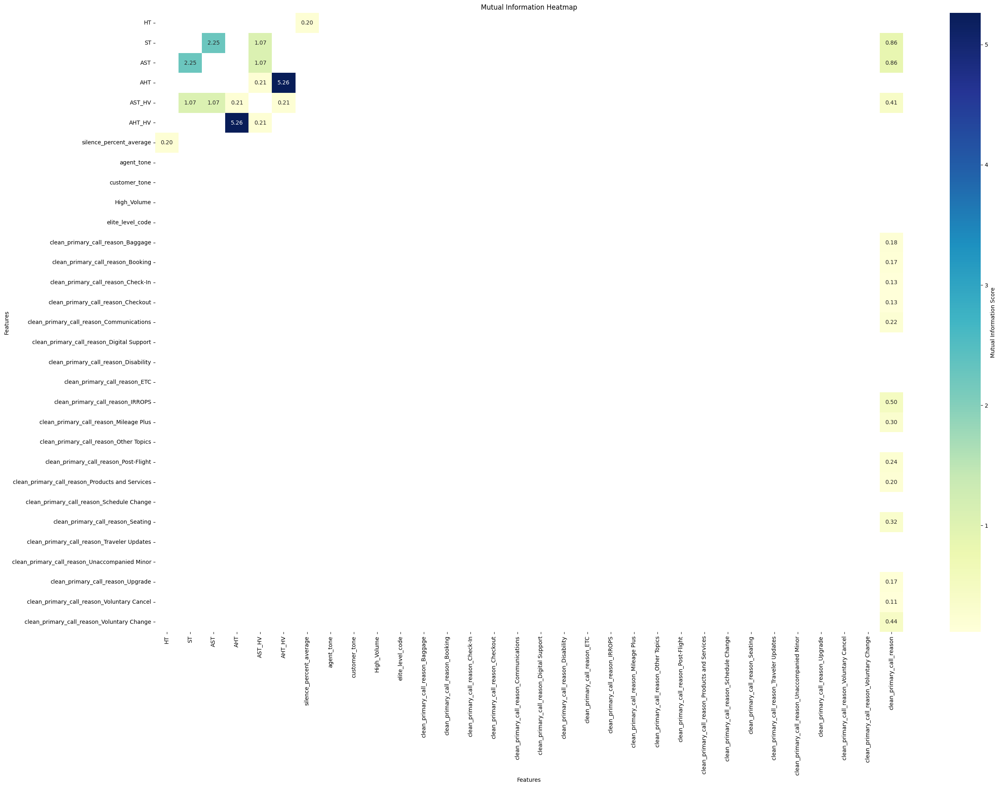

In [191]:
filtered_mi_matrix = mutual_info_matrix[mutual_info_matrix > 0.1]
# Step 7: Create and display a heatmap of mutual information scores using Seaborn
plt.figure(figsize=(30, 20))
sns.heatmap(filtered_mi_matrix, annot=True, fmt=".2f", cmap='YlGnBu', cbar_kws={'label': 'Mutual Information Score'})
plt.title('Mutual Information Heatmap')
plt.xlabel('Features')
plt.ylabel('Features')
plt.show()


In [192]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
import plotly.express as px


# Step 2: One-Hot Encode Categorical Columns
train_encoded = pd.get_dummies(train[cat_cols], drop_first=True)  # Drop first to avoid multicollinearity

# Combine encoded categorical columns with numerical columns
train_combined = pd.concat([train[num_cols], train_encoded], axis=1)

# Step 3: Initialize a DataFrame to hold mutual information scores
mutual_info_matrix = pd.DataFrame(index=train_combined.columns, columns=train_combined.columns)

# Step 4: Compute mutual information scores for categorical vs target
target = train['clean_primary_call_reason'].values.ravel()  # Flatten the target variable

for col in train_combined.columns:
    if col != 'clean_primary_call_reason':  # Exclude the target variable itself
        score = mutual_info_classif(train_combined[[col]], target, discrete_features=True)
        mutual_info_matrix.loc[col, 'clean_primary_call_reason'] = score[0]

# Step 5: Compute mutual information scores for numerical vs numerical features
for i in range(len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        score = mutual_info_regression(train_combined[[num_cols[i]]], train_combined[num_cols[j]])
        mutual_info_matrix.loc[num_cols[i], num_cols[j]] = score[0]
        mutual_info_matrix.loc[num_cols[j], num_cols[i]] = score[0]  # Symmetric

# Step 6: Compute mutual information scores for categorical vs categorical features
new_cat_cols = train_encoded.columns.tolist()

for i in range(len(new_cat_cols)):
    for j in range(i + 1, len(new_cat_cols)):
        score = mutual_info_classif(train_encoded[[new_cat_cols[i]]], train_encoded[[new_cat_cols[j]]], discrete_features=True)
        mutual_info_matrix.loc[new_cat_cols[i], new_cat_cols[j]] = score[0]
        mutual_info_matrix.loc[new_cat_cols[j], new_cat_cols[i]] = score[0]  # Symmetric

# Fill diagonal with NaN or zero if needed (not applicable here)
np.fill_diagonal(mutual_info_matrix.values, 0)

# Convert the DataFrame to numeric type (if needed)
mutual_info_matrix = mutual_info_matrix.astype(float)

# Step 7: Extract and filter the mutual info values for clean_primary_call_reason
mi_values = mutual_info_matrix['clean_primary_call_reason'].dropna().sort_values(ascending=False)

# Exclude features that contain "clean_primary_call_reason" in their names
mi_values_filtered = mi_values[~mi_values.index.str.contains('clean_primary_call_reason')]

# Step 8: Create a bar plot using Plotly with annotations
fig = px.bar(
    x=mi_values_filtered.index,
    y=mi_values_filtered.values,
    labels={'x': 'Features', 'y': 'Mutual Information Score'},
    title='Mutual Information with Respect to clean_primary_call_reason',
    text=mi_values_filtered.values  # Display values on top of bars
)

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')  # Format text displayed on bars

fig.update_layout(
    xaxis_title='Features',
    yaxis_title='Mutual Information Score',
    xaxis_tickangle=-45,
)

fig.show()

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning:

Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning:

Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\cluster\_supervised.py:66: UserWarning:

Clustering metrics expects discrete values but received continuous values for label, and multiclass values for target

c:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ra

In [197]:
train[cat_cols]

,agent_tone,customer_tone,clean_primary_call_reason,High_Volume,elite_level_code
0,4,0,Voluntary Cancel,0,5
1,2,3,Booking,0,0
2,4,4,IRROPS,0,0
3,4,2,Upgrade,0,3
4,4,4,Seating,0,1
...,...,...,...,...,...
66648,4,2,Mileage Plus,0,3
66649,2,1,Post-Flight,0,0
66650,2,2,Upgrade,0,2
66651,2,4,Upgrade,0,0


In [199]:
train = pd.read_csv('training_final.csv')

In [204]:
cat_cols2 = cat_cols.copy()
cat_cols2.remove('clean_primary_call_reason')

In [206]:
test[cat_cols2].isnull().sum()

agent_tone            19
customer_tone          0
High_Volume            0
elite_level_code    1808
dtype: int64

In [207]:
test['agent_tone'] = test['agent_tone'].fillna('Unknown')
test['elite_level_code'] = test['elite_level_code'].fillna(-1)

In [ ]:
cat_cols = ['agent_tone',
 'customer_tone',
 'clean_primary_call_reason',
 'High_Volume',
 'elite_level_code']

NLP 

In [302]:
testdf.elite_level_code = testdf.elite_level_code.fillna(-1)
testdf.agent_tone = testdf.agent_tone.fillna('Unknown')


C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\1147695737.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testdf.elite_level_code = testdf.elite_level_code.fillna(-1)
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\1147695737.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testdf.agent_tone = testdf.agent_tone.fillna('Unknown')


In [303]:
testdf.isnull().sum()

call_id                    0
customer_id                0
agent_id                   0
call_start_datetime        0
agent_assigned_datetime    0
call_end_datetime          0
call_transcript            0
customer_name              0
elite_level_code           0
agent_tone                 0
customer_tone              0
average_sentiment          8
silence_percent_average    0
HT                         0
ST                         0
dtype: int64

In [304]:
train.isnull().sum()

Unnamed: 0                   0
call_start_datetime          0
call_id                      0
customer_id                  0
agent_id                     0
agent_assigned_datetime      0
call_end_datetime            0
call_transcript              0
customer_name                0
elite_level_code             0
agent_tone                   0
customer_tone                0
average_sentiment            0
silence_percent_average      0
primary_call_reason          0
HT                           0
ST                           0
AHT                          0
AST                          0
rounded_hour                 0
High_Volume                  0
AST_HV                       0
AHT_HV                       0
cluster                      0
clean_primary_call_reason    0
dtype: int64

In [308]:
train.loc[0,'call_transcript']

"\n\nAgent: Thank you for calling United Airlines customer service, my name is Sarah how may I help you?\n\nCustomer: Hi, yeah I'm calling because my flight from Chicago to New York was delayed by over 3 hours! This is ridiculous, I'm missing important meetings because of this. \n\nAgent: I'm so sorry to hear about the delay, that's definitely frustrating. Umm, let me pull up your reservation and take a look at what happened. *typing sounds* Okay, it looks like there was severe weather in Chicago that caused multiple flight cancellations and delays across the board for all the airlines. Ahh shoot, yeah your original flight was scheduled to depart at 2pm but didn't actually take off until after 5pm.\n\nCustomer: Ugh this is such poor planning on United's part, you should have rerouted passengers or put us on other flights that weren't delayed. Now I've wasted a whole day. \n\nAgent: I understand your frustration sir, delays are never fun. Let me see what options I have available to help

In [309]:
train_bp = train.copy()
test_bp = test.copy()

In [316]:
train

,Unnamed: 0,call_start_datetime,call_id,customer_id,agent_id,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,...,AHT,AST,rounded_hour,High_Volume,AST_HV,AHT_HV,cluster,clean_primary_call_reason,cleaned_customer_transcript,sentiment_score
0,0,2024-07-31 23:56:00.000000,4667960400,2033123310,963118,2024-08-01 00:03:00.000000,2024-08-01 00:34:00.000000,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,1,...,10.893424,7.0,2024-07-31 23:00:00.000000,0,0.0,0.000000,11,10,,0.0
1,1,2024-08-01 00:03:00.000000,1122072124,8186702651,519057,2024-08-01 00:06:00.000000,2024-08-01 00:18:00.000000,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,3,...,11.471939,3.0,2024-08-01 00:00:00.000000,0,0.0,0.000000,8,15,,0.0
2,2,2024-07-31 23:59:00.000000,6834291559,2416856629,158319,2024-08-01 00:07:00.000000,2024-08-01 00:26:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,3,...,11.594005,8.0,2024-07-31 23:00:00.000000,0,0.0,0.000000,2,1,,0.0
3,3,2024-08-01 00:05:00.000000,2266439882,1154544516,488324,2024-08-01 00:10:00.000000,2024-08-01 00:17:00.000000,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,6,...,10.270718,5.0,2024-08-01 00:00:00.000000,0,0.0,0.000000,10,13,,0.0
4,4,2024-08-01 00:04:00.000000,1211603231,5214456437,721730,2024-08-01 00:14:00.000000,2024-08-01 00:23:00.000000,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,4,...,10.635762,10.0,2024-08-01 00:00:00.000000,0,0.0,0.000000,6,18,,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,295,2024-08-01 10:00:00.000000,1169068270,4432864674,349957,2024-08-01 10:07:00.000000,2024-08-01 10:10:00.000000,"\n\nAgent: United Airlines customer service, t...",Jessica Gomez,3,...,10.950292,7.0,2024-08-01 10:00:00.000000,0,0.0,9.746835,18,20,,0.0
296,296,2024-08-01 09:58:00.000000,5038767938,8872271021,391212,2024-08-01 10:07:00.000000,2024-08-01 10:11:00.000000,\n\nAgent: Thank you for calling United Airlin...,Jennifer Melendez,2,...,11.537037,9.0,2024-08-01 09:00:00.000000,0,0.0,10.884615,1,17,,0.0
297,297,2024-08-01 10:04:00.000000,8511714437,1078620052,645129,2024-08-01 10:08:00.000000,2024-08-01 10:14:00.000000,\n\nAgent: Thank you for calling United Airlin...,Arthur Pennington,3,...,11.219512,4.0,2024-08-01 10:00:00.000000,0,0.0,8.739130,8,15,,0.0
298,298,2024-08-01 09:59:00.000000,8466115310,4401468874,880532,2024-08-01 10:08:00.000000,2024-08-01 10:15:00.000000,\n\nAgent: Thank you for calling United Airlin...,Kimberly Evans,1,...,12.503333,9.0,2024-08-01 09:00:00.000000,0,0.0,11.066667,1,17,,0.0


C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\1917521171.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['cleaned_customer_transcript'] = test['call_transcript'].apply(clean_customer_transcript)
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\1917521171.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['sentiment_score'] = test['cleaned_customer_transcript'].apply(calculate_sentiment)


Test Transcript 0:


Agent: Thank you for calling United Airlines customer service, my name is Sarah how can I help you today?

Customer: Hi Sarah, um I'm calling about my upcoming flight from Chicago to London next week. 

Agent: Okay, no problem. What would you like to know about your flight to London?

Customer: Well uhh, I was hoping to change the date of my return flight. The return date I have booked is no longer good for me. 

Agent: I understand, thanks for letting me know. Let me pull up your reservation so I can take a look at your options for changing the return date. May I have your last name and confirmation number please?

Customer: Sure, my last name is Smith and the confirmation number is... *customer provides confirmation number* 

Agent: Alright Mr. Smith, I've got your reservation up on my screen. What date were you looking to change your return flight to?

Customer: Umm, *customer pauses to check calendar* if possible I'd like to change it to returning on the follow

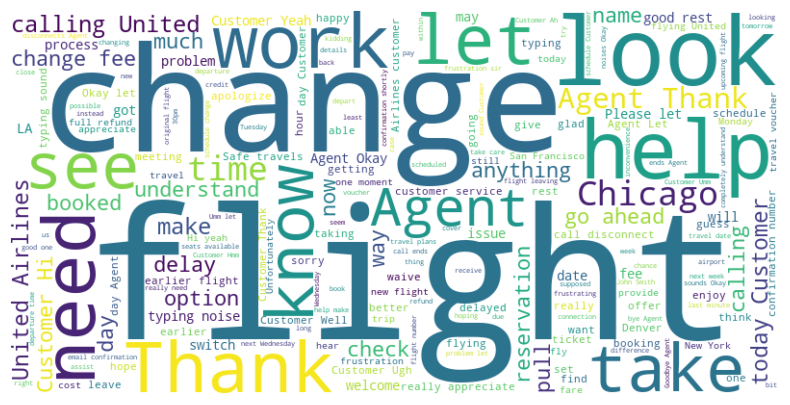

In [322]:
import pandas as pd
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from textblob import TextBlob

# Load SpaCy model
nlp = spacy.load("en_core_web_sm")

# Sample DataFrames (replace with your actual data)


# Function to clean customer parts and extract important words (without filtering)
def clean_customer_transcript(transcript):
    lines = transcript.split('\n')
    customer_lines = [line for line in lines if line.startswith("Customer:")]
    
    # Join customer lines into a single string without filtering parts of speech
    customer_text = " ".join(customer_lines)
    
    return customer_text

# Clean transcripts and calculate sentiment scores for train DataFrame
train['cleaned_customer_transcript'] = train['call_transcript'].apply(clean_customer_transcript)

def calculate_sentiment(text):
    return TextBlob(text).sentiment.polarity

# Calculate sentiment scores
train['sentiment_score'] = train['cleaned_customer_transcript'].apply(calculate_sentiment)

# Clean test DataFrame similarly and calculate sentiment scores
test['cleaned_customer_transcript'] = test['call_transcript'].apply(clean_customer_transcript)
test['sentiment_score'] = test['cleaned_customer_transcript'].apply(calculate_sentiment)

# Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_train = vectorizer.fit_transform(train['cleaned_customer_transcript'])
tfidf_test = vectorizer.transform(test['cleaned_customer_transcript'])

# Calculate cosine similarity and find nearest neighbors
nbrs = NearestNeighbors(n_neighbors=5, metric='cosine').fit(tfidf_train)
distances, indices = nbrs.kneighbors(tfidf_test)

# Calculate average sentiment score per agent in training data
agent_avg_sentiment = train.groupby('agent_id')['sentiment_score'].mean().reset_index()

# Display nearest neighbors and their transcripts along with agent_id with highest average sentiment score
for i in range(len(test)):
    print(f"Test Transcript {i}:")
    print(test['call_transcript'].iloc[i])
    
    print("\nNearest Neighbors:")
    
    # Collect sentiment scores and corresponding agent IDs from neighbors
    neighbor_sentiments = []
    
    for idx in indices[i]:
        print(f"Training Transcript: {train['call_transcript'].iloc[idx]}")
        
        # Get agent ID of the neighbor
        agent_id = train['agent_id'].iloc[idx]
        
        # Get sentiment score of the neighbor
        sentiment_score = train['sentiment_score'].iloc[idx]
        
        # Append to list for finding max later
        neighbor_sentiments.append((agent_id, sentiment_score))
    
    # Find agent with highest average sentiment score among neighbors
    highest_avg_agent_id = None
    highest_avg_sentiment_score = -float('inf')
    
    for agent_id, _ in neighbor_sentiments:
        avg_sentiment_score = agent_avg_sentiment[agent_avg_sentiment['agent_id'] == agent_id]['sentiment_score'].values[0]
        
        if avg_sentiment_score > highest_avg_sentiment_score:
            highest_avg_sentiment_score = avg_sentiment_score
            highest_avg_agent_id = agent_id
    
    print(f"Agent ID with Highest Average Sentiment Score: {highest_avg_agent_id}")

# Generate WordCloud for training transcripts of nearest neighbors
all_neighbors_text = ' '.join(train['call_transcript'].iloc[indices.flatten()])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_neighbors_text)

# Display WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\2629134249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['cleaned_customer_transcript'] = train['call_transcript'].apply(clean_customer_transcript)
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\2629134249.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['sentiment_score'] = train['cleaned_customer_transcript'].apply(calculate_sentiment)
C:\Users\Acer\AppData\Local\Temp\ipykernel_7944\2629134249.py:34: SettingWithCopyWarning: 
A value i

Test Transcript 0:


Agent: Thank you for calling United Airlines customer service, my name is Sarah how can I help you today?

Customer: Hi Sarah, um I'm calling about my upcoming flight from Chicago to London next week. 

Agent: Okay, no problem. What would you like to know about your flight to London?

Customer: Well uhh, I was hoping to change the date of my return flight. The return date I have booked is no longer good for me. 

Agent: I understand, thanks for letting me know. Let me pull up your reservation so I can take a look at your options for changing the return date. May I have your last name and confirmation number please?

Customer: Sure, my last name is Smith and the confirmation number is... *customer provides confirmation number* 

Agent: Alright Mr. Smith, I've got your reservation up on my screen. What date were you looking to change your return flight to?

Customer: Umm, *customer pauses to check calendar* if possible I'd like to change it to returning on the follow

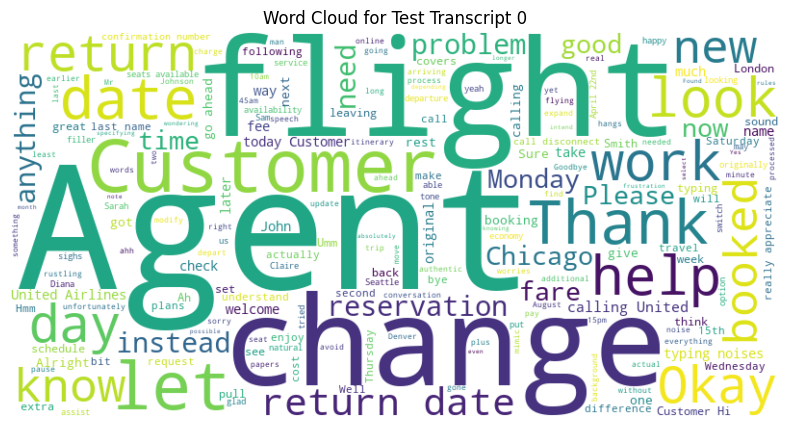

Best Agent ID: 922729
Test Transcript 1:


Agent: Thank you for calling United Airlines, my name is Adam. How can I help you today?

Customer: Hello, yeah I'm calling because I have a complaint about my recent flight. 
*sighs angrily* 
It was an absolute nightmare.

Agent: I'm sorry to hear you had a bad experience. Can you tell me about what happened on your flight? 

Customer: Well first of all, my flight was delayed by over three hours with no explanation given. We just sat on the plane forever with no updates. 
Then when we finally took off, the cabin was freezing cold the entire time and my daughter got sick. 
And to top it all off, when we landed my bag was one of the last ones to come out on the carousel. It was a complete mess.

Agent: I understand, that does sound like a very frustrating travel experience. *typing sounds* Let me pull up the details of your flight. What was the flight number and date?

Customer: It was flight 488 from Chicago to Denver, last Thursday.

Agent: O

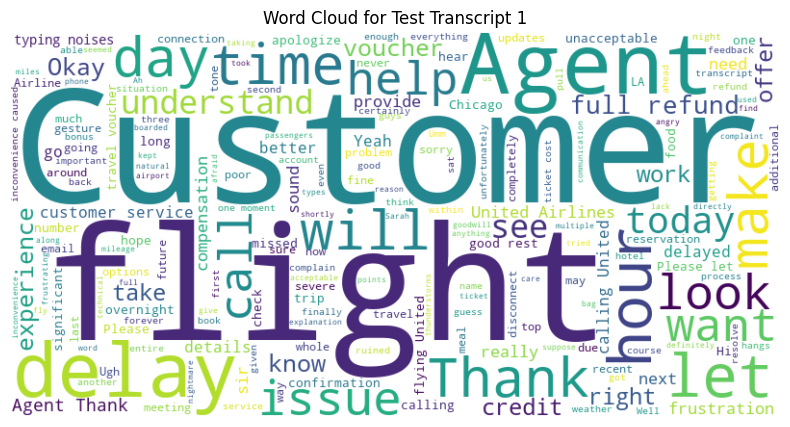

Best Agent ID: 817160
Test Transcript 2:


Agent: Thank you for calling United Airlines customer service, this is Alex speaking. How may I help you today?

Customer: Hi Alex, my name is John. I'm calling about a flight I have booked from Chicago to San Francisco next Thursday. 

Agent: Okay John, let me pull up your booking. What's the flight number?

Customer: It's flight UA1268, departing at 10:30am. 

Agent: Just one moment while I look that up...okay, I've found your reservation. What questions do you have about the flight?

Customer: Well, I've run into a little problem. My meeting in San Francisco got pushed back a day so I need to change my return flight from Friday to Saturday. Is there any way I can do that without paying a change fee? 

Agent: Hmm, let me check the rules for that fare. *typing noises* Unfortunately since it's within 7 days of travel, there would be a $200 change fee to switch you to the Saturday flight. However, what I could do instead is give you a credit fo

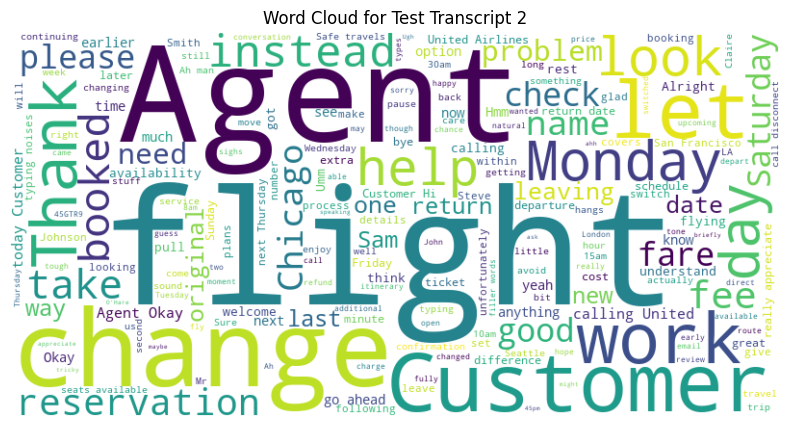

Best Agent ID: 922729
Test Transcript 3:


Agent: Thank you for calling United Airlines, this is David how can I help you today?

Customer: Hi, I'm calling to complain about my recent flight from Chicago to New York. It was a complete disaster.

Agent: I'm sorry to hear about your poor experience. Can you tell me what happened on your flight?

Customer: Well first of all, your gate agents were a mess. They kept changing the boarding time and it seemed like they had no idea what was going on. Then when we finally boarded, we sat on the tarmac for over an hour with no updates. People were getting annoyed. 

Agent: Umm, yeah that's definitely not ideal. Delays on the tarmac are never fun. *typing noise* Let me pull up the flight details. What's the date of your travel?

Customer: It was last Wednesday, April 6th. Flight 237. 

Agent: Okay, got it. *more typing* According to our records, that flight did experience a lengthy delay due to maintenance issues. The agents probably should have c

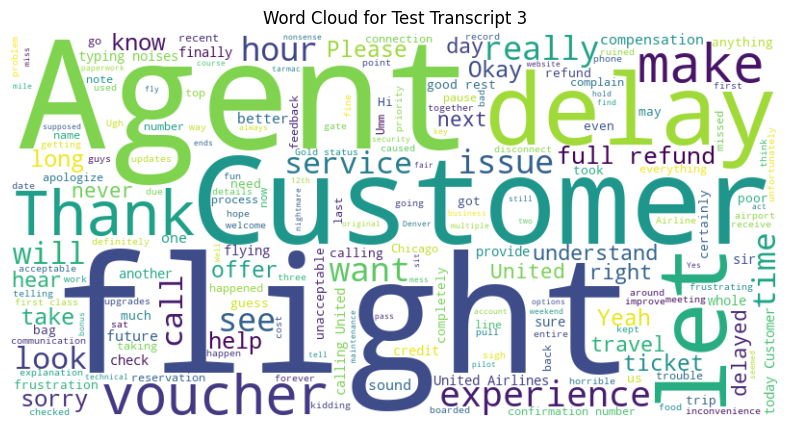

Best Agent ID: 963118
Test Transcript 4:


Agent: Thank you for calling United Airlines customer service, this is Adam speaking. How can I help you out today?

Customer: Hi, yeah I'm calling because I'm having some issues with a flight I booked. Ugh, this is so frustrating. 

Agent: I understand, it's never fun when flight plans change. Can you tell me what's going on with your itinerary? 

Customer: So I booked a flight from LA to New York for next weekend. Only now when I went to check-in online, the flight is canceled! They have me rescheduled for a connecting flight that's gonna take like 10 hours instead of the direct flight I paid for. 

Agent: Okay, let me pull up your reservation. *typing noises* Yup, I'm seeing the nonstop flight was unfortunately canceled due to maintenance issues. I apologize for any inconvenience the change causes. May I ask what made the connecting flight take so much longer?

Customer: Umm, I guess it's got like 3 layovers now instead of being direct. Fir

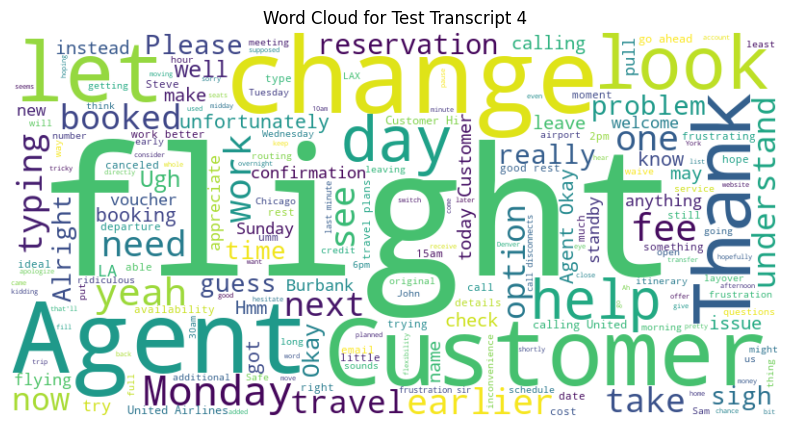

Best Agent ID: 817160
Test Transcript 5:


Agent: Thank you for calling United Airlines, my name is Jack. How can I help you today?

Customer: Hi, yeah I'm calling because I have a flight from Chicago to LA next Wednesday and I'm really worried it's going to get delayed or canceled. The weather has been so bad lately.

Agent: I understand your concern about delays and cancellations. Let me take a look at your flight details. What's the booking reference number?

Customer: It's UA1238457. I booked it last month for a work trip. 

Agent: Okay, let me pull that up... *typing noises* Alright, I've got the flight here. Based on the current weather forecast, things are looking good for next Wednesday. No major storms are in the forecast for Chicago or LA. Of course, things can always change last minute but as of now it's on schedule to depart at 10am. How does that make you feel?

Customer: I don't know, I'm just really stressed about this trip. My presentation is important and I can't miss 

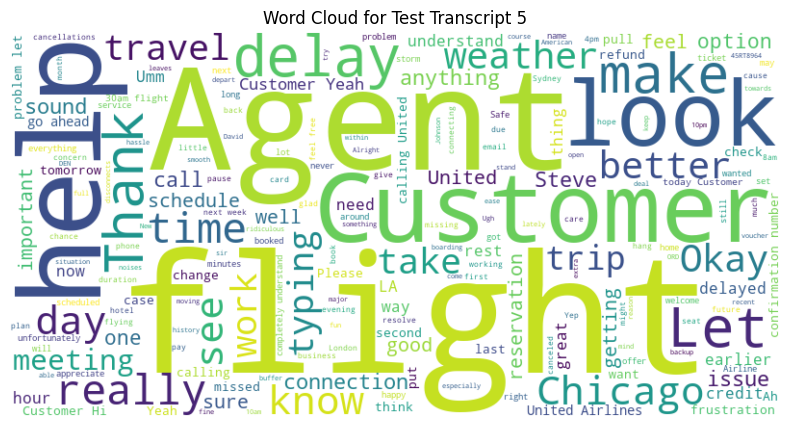

Best Agent ID: 963118
Test Transcript 6:


Agent: Thank you for calling United Airlines, my name is Sam. How can I help you today?

Customer: Hi Sam, yeah I'm calling because I'm trying to change the date of my upcoming flight. My flight is this Friday but something came up and I need to move it to next week.

Agent: No problem, let me pull up your reservation. What's the name the ticket is booked under?

Customer: It's under John Smith.

Agent: Okay, got it. Let me take a look here...hmm it looks like the flight for this Friday is pretty full. The closest flight I can get you on for next week leaves on Wednesday. How does that work for you?

Customer: Wednesday would still be a bit too late, is there anything in between Friday and Wednesday? 

Agent: *typing noises* Let me check some other dates...it looks like we have seats available on Monday. Would that work better for your schedule?

Customer: Monday would work, yeah. Can you switch me over to that flight then?

Agent: Absolutely,

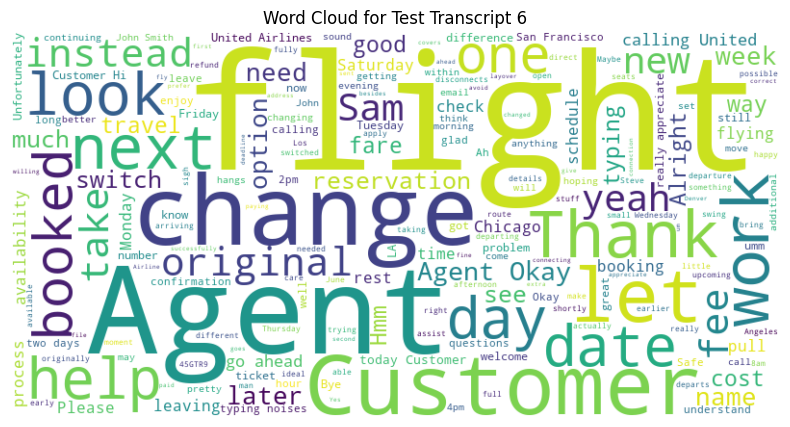

Best Agent ID: 721730
Test Transcript 7:


Agent: Thank you for calling United Airlines, my name is Jim, how may I help you?

Customer: Hi Jim, yeah I'm calling about a flight I have coming up next week. My flight number is UA1245 from Chicago to Denver.

Agent: Okay, let me pull that flight up. *typing sounds* Okay, I've got the flight details here. What questions did you have about your trip?

Customer: Well, when I checked in online earlier it said my seat assignment wasn't available yet. I was hoping to find out if that's been assigned now or if there's any way to get a better seat.

Agent: No problem, let me take a look. *more typing* It looks like seat assignments just came through for that flight within the last hour. Unfortunately the available seats left are in the back of the plane. However, I can try to get you upgraded if we have any upgrade inventory available. What would you consider a better seat? Aisle, window?

Customer: Umm, yeah an aisle seat would be better if possi

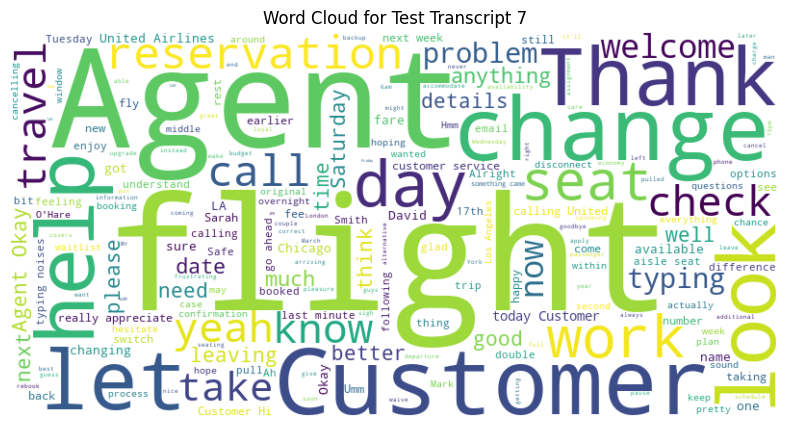

Best Agent ID: 721730
Test Transcript 8:


Agent: Thank you for calling United Airlines, my name is James. How may I help you today?

Customer: Hi, I'm calling because my flight from Chicago to New York was delayed by over three hours! This is unacceptable.

Agent: I apologize for the lengthy delay, those are always very frustrating. May I have your confirmation number so I can pull up the flight details?

Customer: It's PX456132. Look, I paid a lot of money for this ticket and your delay made me miss an important business meeting. You need to compensate me for this.

Agent: Let me take a look here...okay, I see the flight was originally scheduled to depart at 2:30pm but was delayed until after 5:30pm due to severe weather in Chicago. I understand your frustration with missing such an important meeting. Umm...just one second *typing noise*...let me see what options we may have as far as compensation. Our policy is to provide compensation for delays over three hours beyond the traveler'

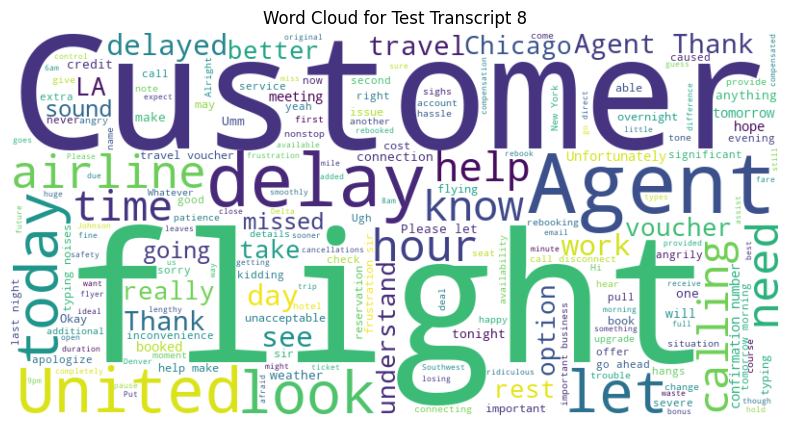

Best Agent ID: 524049
Test Transcript 9:


Agent: Thank you for calling United Airlines, my name is Alex. How may I help you today?

Customer: Ugh, finally! I've been on hold forever. I need to change my flight, it's just completely unacceptable. 

Agent: I apologize for the long wait, we've been very busy. May I have your confirmation number so I can pull up your reservation?

Customer: It's PX456132. And it better not take you long to find it, I don't have all day!

Agent: Okay, just one moment... *typing noises*... alright, I have your reservation here for a flight from Chicago to Los Angeles next Wednesday. What change did you need to make?

Customer: I need to change it to tomorrow! The flight I was supposed to be on last week got delayed for hours and I missed an important business meeting. And now this flight is supposed to leave at the same time? No way, there's no way I'm risking being late again. You guys need to get your act together. 

Agent: I understand your frustration s

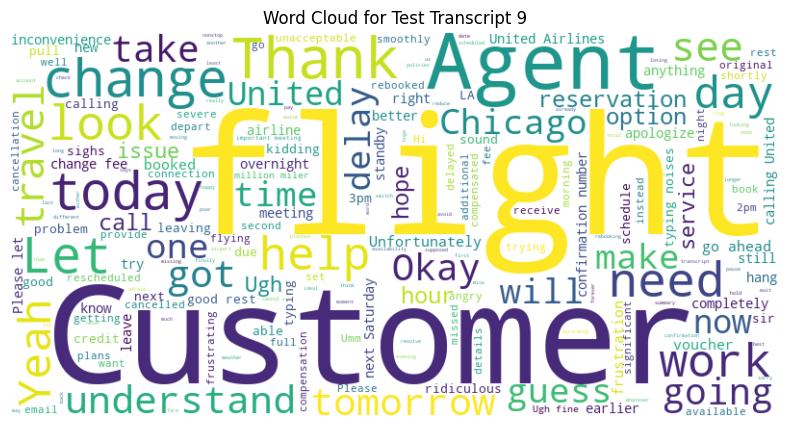

Best Agent ID: 721730
Test Transcript 10:


Agent: Thank you for calling United Airlines, this is John speaking. How may I help you?

Customer: Hi, yeah I've got a problem with a recent flight I took with you guys. The flight was supposed to leave at 6pm but it got delayed for over 3 hours with no explanation. I missed an important work meeting because of it.

Agent: I'm sorry to hear about that delay, umm lets take a look at your flight details and see what happened. Can I get your confirmation number please?

Customer: Ugh it's B6782A4. This is ridiculous, you guys need to do a better job of keeping customers informed during delays. Just telling us it's delayed doesn't cut it.

Agent: *typing sounds* Okay, I've pulled up your flight. It looks like there was an issue with the plane having a mechanical problem right before your scheduled departure time. The engineers needed extra time to fix it to ensure safety. I apologize for the lack of updates during the delay, you're right passeng

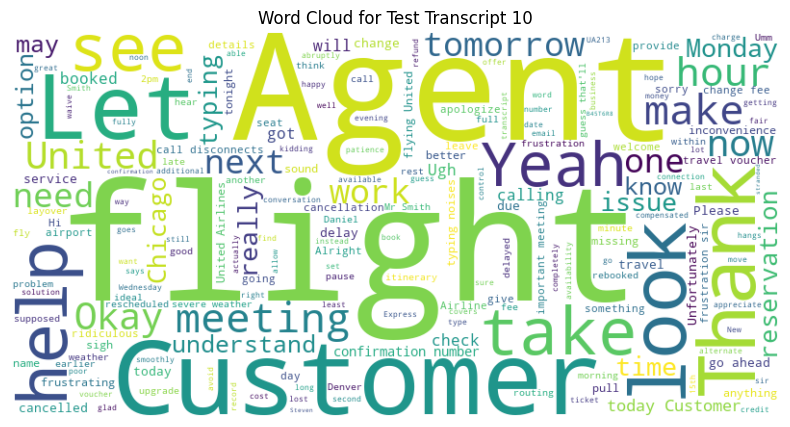

Best Agent ID: 721730
Test Transcript 11:


Agent: Thank you for calling United Airlines, my name is Ram. How may I help you today?

Customer: Hi Ram, umm thanks for taking my call. I have a small issue regarding my upcoming flight booking. *some background music and noise heard* 

Agent: No issues, please go ahead and share your concern. I'll be happy to help.

Customer: Sure, so I had booked a flight from New York to San Francisco next week Friday. But unfortunately some important work has come up and I need to postponed my travel by a week. Is there any way I can change the date without paying any additional fees? 

Agent: Let me pull up your booking details. What's the last name and confirmation number?

Customer: Last name is Johnson, confirmation number is XYX123567. *typing sound heard* 

Agent: Got it, let me take a look. *few seconds of pause* Unfortunately as you are requesting to change within the same week of travel, there would be a change fee applicable as per our policie

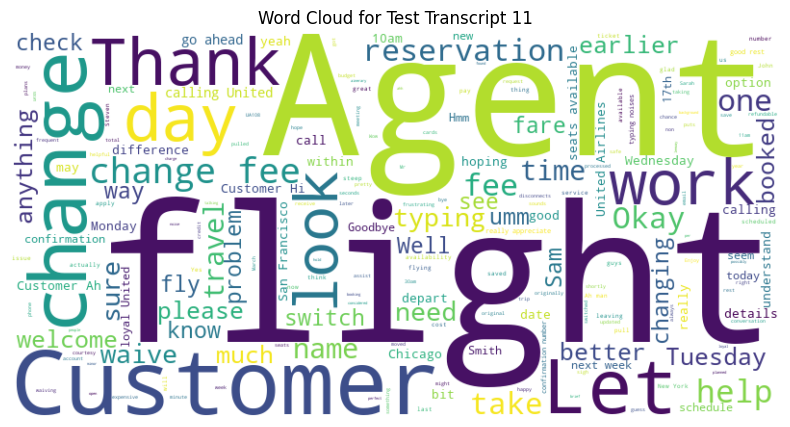

Best Agent ID: 721730
Test Transcript 12:


Agent: Thank you for calling United Airlines customer service, my name is Sam. How may I help you today?

Customer: Hi, um, I'm calling about a flight I have coming up next week. My flight number is UA108 from New York to Los Angeles.

Agent: Okay, let me pull up your reservation. *typing noises* Okay, I've got the flight here. What questions do you have about it?

Customer: Well, I know the scheduled departure time is 6pm next Thursday, but I was hoping to change it to an earlier flight if possible. My meeting in LA got moved up to the morning and I need to be there earlier. 

Agent: I see. Let me check flight availability for that day. *more typing* It looks like we have seats available on our 1pm flight. Would you like me to switch you over to that one? There would be a $75 change fee since it's within a week of travel.

Customer: Umm, is there anything earlier? That 1pm flight still gets me into LA pretty late. 

Agent: *checks schedule* 

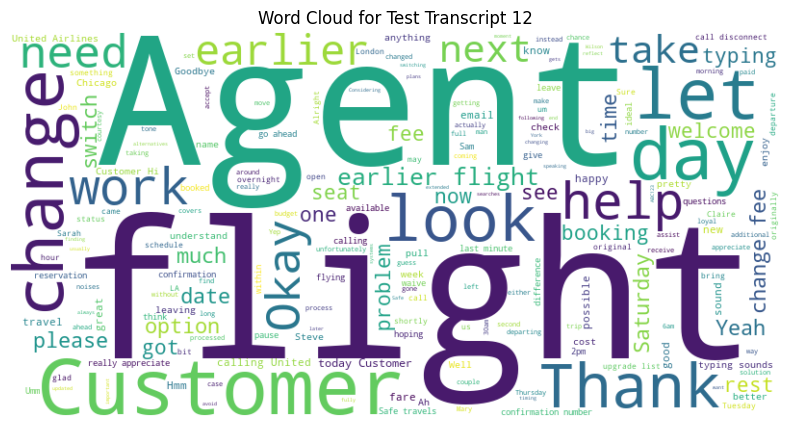

Best Agent ID: 524049
Test Transcript 13:


Agent: Thank you for calling United Airlines, this is Steve how can I help you today?

Customer: Yeah hi, I'm calling to complain about my flight from last week. The service was absolutely terrible. 

Agent: I'm sorry to hear you had a bad experience. Can you tell me what happened on your flight?

Customer: So my flight from Chicago to LA was delayed by over 3 hours. No one gave us any information about what was causing the delay or when we would take off. We were just left sitting on the plane. And then when we finally did take off, we hit turbulence the whole flight. I was terrified! The flight attendants weren't any help either. 

Agent: Oh man, that does sound really frustrating. (papers shuffling in the background) Let me pull up the flight information for that route last week. Umm...it looks like there was severe weather in both Chicago and LA that caused many flights to be delayed. The pilots also reported turbulence throughout the fli

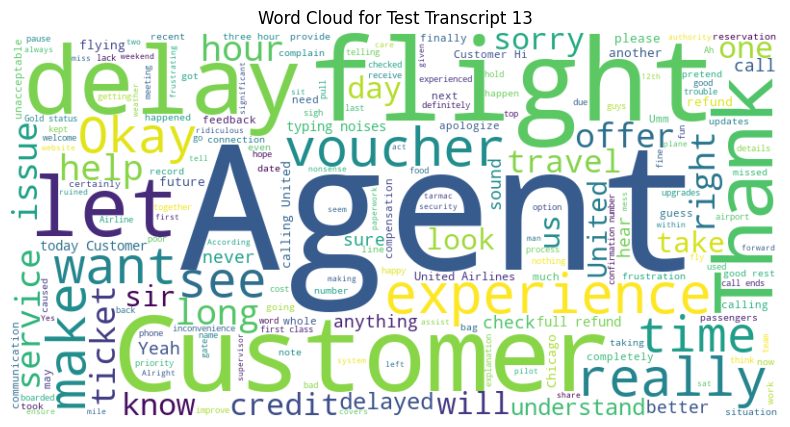

Best Agent ID: 963118
Test Transcript 14:


Agent: Thank you for calling United Airlines, my name is Sarah how can I help you today?

Customer: Hi Sarah, thanks for taking my call. I'm calling about a flight I have booked from Chicago to San Francisco next Wednesday. Umm, I was hoping to change the departure time if possible.

Agent: No problem, let me pull up your reservation. Can I get your confirmation number please?

Customer: Sure, it's BK348921. 

Agent: Okay, got it. Let me take a look at the available flights for that route on Wednesday. *typing noises* It looks like the flight you're currently booked on departs at 10am. What time were you looking to change it to?

Customer: Well, I just found out I have a meeting in SF that starts at 11:30 so I was hoping to get on an earlier flight if possible, maybe around 8 or 8:30 if there's anything.

Agent: Got it, let me see what I can do for you. *more typing* Unfortunately the 8am flight is fully booked but I do have availability on a

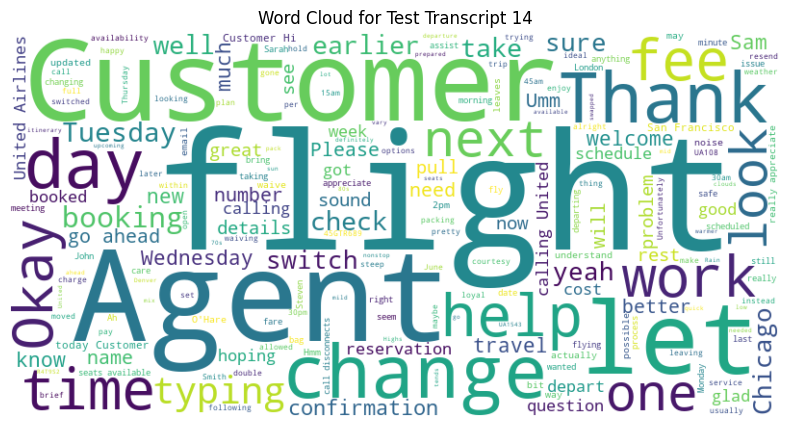

Best Agent ID: 878048
Test Transcript 15:


Agent: Thank you for calling United Airlines, my name is Ryan. How can I help you today?

Customer: Hi, yeah I'm calling because I need to change my flight. Umm, my return flight is this Saturday but something's come up and I need to go home a day earlier. 

Agent: Okay no problem, let me pull up your reservation. Can I get your last name and confirmation number please?

Customer: Yeah it's Smith, confirmation number is BK47392. *sighs* I'm sorry, I'm just really stressed about missing this family thing.

Agent: No worries, I understand. Let me take a look here...okay Mr. Smith, I see your flight. What day did you need to change your return to?

Customer: Friday instead of Saturday. Is there any way to do that without paying a change fee? This is really last minute so I wasn't expecting there to be any seats left but it would be great if I didn't have to pay. 

Agent: Hmm, let me check availability for Friday. *typing sounds* Unfortunately it

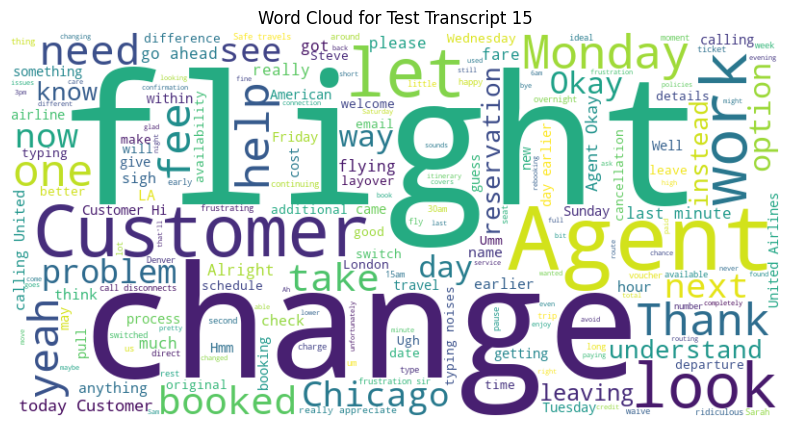

Best Agent ID: 817160
Test Transcript 16:


Agent: Thank you for calling United Airlines, my name is Alex. How can I help you today?

Customer: Ugh, finally! I've been on hold for over an hour. I want to complain about my recent flight from Chicago to LA. 

Agent: I apologize for the long wait, we've been very busy. Can you tell me about your experience on that flight?

Customer: It was a nightmare. First, my flight was delayed by 3 hours with no explanation. Then when I finally board the plane, I find out they had overbooked and I didn't have a seat! I had to sit between two large men in the very back with no room to move. 

Agent: Oh wow, that does sound extremely unpleasant. *typing noise* Let me pull up the details of your flight. What was the date of travel?

Customer: Last Tuesday. Flight number was United 2121. The whole experience has really soured me on United. This is not how you treat customers who have flown with you for 10 years!

Agent: I completely understand your frustr

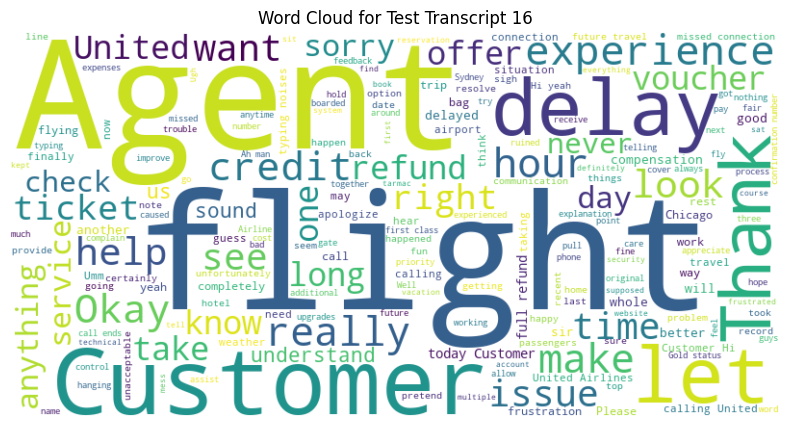

Best Agent ID: 963118
Test Transcript 17:


Agent: Thank you for calling United Airlines customer service, my name is Jane how may I help you today?

Customer: Yeah I'm calling to complain about my flight from Chicago to San Francisco that I took last week. The flight was delayed by over 3 hours and I missed my connection, it was a complete nightmare. 

Agent: I'm sorry to hear about your experience, delays are never fun. Umm, may I have your confirmation number so I can look up your reservation? There seems to be some static, let me move to another room where it's quieter. *sounds of chair moving, papers shuffling* Okay that's better. Go ahead and give me your confirmation.

Customer: It's PX456213. I paid over $600 for these tickets and your airline couldn't even get me to my destination on time. I had to spend the night in an airport hotel and my whole schedule was thrown off. 

Agent: Okay, let me pull up your reservation...one moment...alright I see the flight here. It looks like 

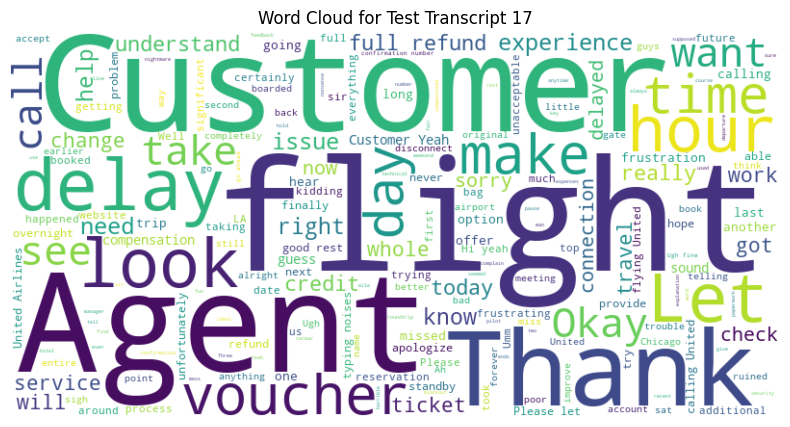

Best Agent ID: 963118
Test Transcript 18:


Agent: Thank you for calling United Airlines customer service, this is John speaking. How may I help you today?

Customer: Yeah hi, I'm calling because my flight from Chicago to LA got delayed, again. This is the third time it's been delayed within the past month and I'm sick of it. 

Agent: I understand your frustration sir. Can you please provide me with your confirmation number so I can pull up your record?

Customer: *rustling noises as customer searches for confirmation number* Ugh, hold on let me find it. *papers shuffling* Okay, it's B6387291. 

Agent: *typing noises* Okay, I see the flight you're referring to. It looks like it was delayed due to maintenance issues with the aircraft. I apologize for the multiple delays, I'm sure that's been very inconvenient. 

Customer: Inconvenient doesn't even cover it, I've had to reschedule so many meetings and appointments. This is unacceptable service. 

Agent: You're completely right to be upse

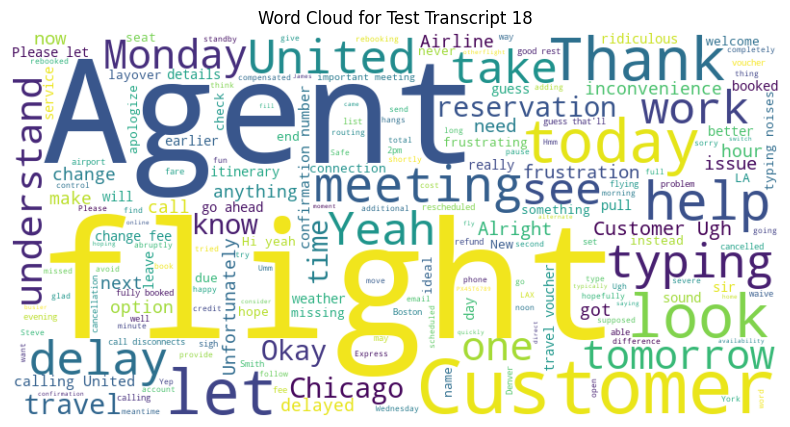

Best Agent ID: 721730
Test Transcript 19:


Agent: Thank you for calling United Airlines customer service, my name is John. How may I help you today?

Customer: Hi, yeah I'm calling because I'm having some issues with a flight that I booked. Umm, my flight from Chicago to New York that was supposed to leave tomorrow at 1pm just got delayed by like 4 hours for no reason. I'm really frustrated cause I have plans that I'm gonna miss now.

Agent: I understand your frustration sir. Delays are never fun, especially when you have plans. Let me take a look at your reservation and see what happened. *typing noises* Okay, it looks like that flight got delayed due to maintenance issues with the aircraft. The mechanics found an issue during their pre-flight check and need some extra time to fix it before it can fly safely. I know it's inconvenient, but safety has to come first. What were your plans that will be affected by the delay? Maybe I can help try to find an alternative option.

Customer: U

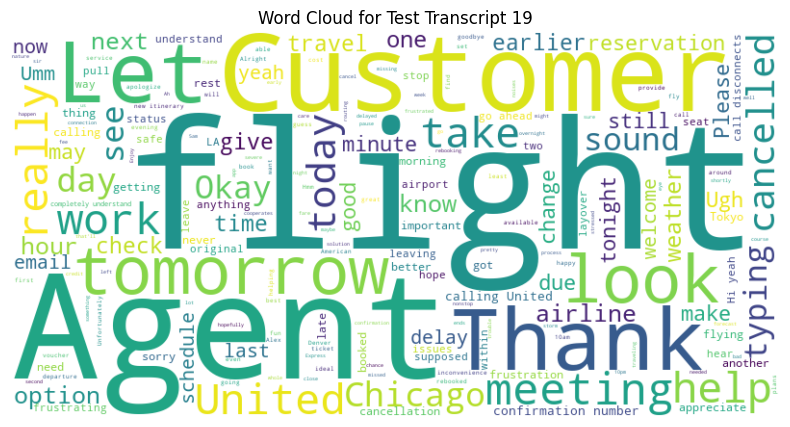

Best Agent ID: 721730
Test Transcript 20:


Agent: Thank you for calling United Airlines Customer Service, my name is Sarah how may I help you today?

Customer: Hi, yeah I'm calling to complain about a flight I took last week from New York to San Francisco. The flight was delayed by over 3 hours and I missed an important meeting because of it. *sighs angrily* I need to know what compensation I can get for this.

Agent: I understand your frustration with the long delay sir. One moment while I pull up the details of your flight. *typing sounds* Okay, it looks like your flight from New York to San Francisco last Thursday was delayed due to severe weather conditions on the east coast that caused many flights to be backed up. Let me take a look at our policies for delays and see what options are available for you. Umm...it seems like for delays over 3 hours we do provide either a full refund or a travel credit for 125% of the original ticket price to be used for future travel within the nex

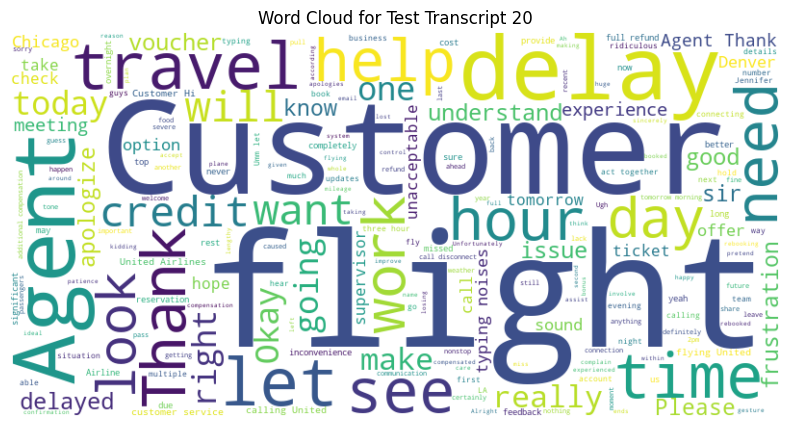

Best Agent ID: 721730
Test Transcript 21:


Agent: Thank you for calling United Airlines customer service, my name is Mark. How may I help you today?

Customer: Hi, yeah I'm calling to complain about my recent flight. The service was absolutely terrible. 

Agent: I'm sorry to hear you had a poor experience. Can you tell me what happened on your flight?

Customer: Well first of all, our flight was delayed for over 3 hours with no explanation. We were just left sitting on the runway the whole time. Then when we finally took off, they ran out of the meal they said they were serving so a bunch of us didn't get anything to eat. And the cabin was so hot and stuffy, I felt like I was going to pass out the whole flight. It was ridiculous. 

Agent: I apologize for the delay and issues with the food and cabin environment, that must have been very frustrating. Umm, let me pull up the flight details and take a look at what happened. *typing noises* Okay, it looks like there was severe weather at t

KeyboardInterrupt: 

In [331]:
import pandas as pd
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from textblob import TextBlob

# Load SpaCy model
nlp = spacy.load("en_core_web_sm")



# Function to clean customer parts and extract important words (without filtering)
def clean_customer_transcript(transcript):
    lines = transcript.split('\n')
    customer_lines = [line for line in lines if line.startswith("Customer:")]
    
    # Join customer lines into a single string without filtering parts of speech
    customer_text = " ".join(customer_lines)
    
    return customer_text

# Clean transcripts and calculate sentiment scores for train DataFrame
train['cleaned_customer_transcript'] = train['call_transcript'].apply(clean_customer_transcript)

def calculate_sentiment(text):
    return TextBlob(text).sentiment.polarity

# Calculate sentiment scores
train['sentiment_score'] = train['cleaned_customer_transcript'].apply(calculate_sentiment)

# Clean test DataFrame similarly and calculate sentiment scores
test['cleaned_customer_transcript'] = test['call_transcript'].apply(clean_customer_transcript)
test['sentiment_score'] = test['cleaned_customer_transcript'].apply(calculate_sentiment)

# Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_train = vectorizer.fit_transform(train['cleaned_customer_transcript'])
tfidf_test = vectorizer.transform(test['cleaned_customer_transcript'])

# Calculate cosine similarity and find nearest neighbors
nbrs = NearestNeighbors(n_neighbors=5, metric='cosine').fit(tfidf_train)
distances, indices = nbrs.kneighbors(tfidf_test)

# Calculate average sentiment score per agent in training data
agent_avg_sentiment = train.groupby('agent_id')['sentiment_score'].mean().reset_index()

# Create KNN columns and best_agent column in test DataFrame
for i in range(5):
    test[f'KNN-{i+1}'] = [train['call_transcript'].iloc[idx] for idx in indices[:, i]]

# Determine best agent based on average sentiment score among neighbors
best_agents = []
for i in range(len(test)):
    neighbor_agents = [train['agent_id'].iloc[idx] for idx in indices[i]]
    
    # Find agent with highest average sentiment score among neighbors
    highest_avg_agent_id = None
    highest_avg_sentiment_score = -float('inf')
    
    for agent_id in neighbor_agents:
        avg_sentiment_score = agent_avg_sentiment[agent_avg_sentiment['agent_id'] == agent_id]['sentiment_score'].values[0]
        
        if avg_sentiment_score > highest_avg_sentiment_score:
            highest_avg_sentiment_score = avg_sentiment_score
            highest_avg_agent_id = agent_id
            
    best_agents.append(highest_avg_agent_id)

test['best_agent'] = best_agents

# Display results and generate word cloud for each test row
for i in range(len(test)):
    print(f"Test Transcript {i}:")
    print(test['call_transcript'].iloc[i])
    
    # Generate WordCloud from KNN transcripts
    all_neighbors_text = ' '.join(test[f'KNN-{j+1}'].iloc[i] for j in range(5))
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_neighbors_text)

    # Display WordCloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Test Transcript {i}')
    plt.show()
    
    # Display best agent information
    print(f"Best Agent ID: {test['best_agent'].iloc[i]}")


,call_id
0,7732610078
1,2400299738
2,6533095063
3,7774450920
4,9214147168
5,2931134074
6,2010588624
7,6611494442
8,8655666048
9,3564872843


In [332]:
test

,call_id,customer_id,agent_id,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,...,HT,ST,cleaned_customer_transcript,sentiment_score,KNN-1,KNN-2,KNN-3,KNN-4,KNN-5,best_agent
0,7732610078,4029953261,488324,2024-08-01 00:23:00,2024-08-01 00:34:00,2024-08-01 01:32:00,\n\nAgent: Thank you for calling United Airlin...,Cassandra Flores,-1.0,neutral,...,58.0,11.0,"Customer: Hi Sarah, um I'm calling about my up...",0.200000,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,922729
1,2400299738,2034858976,963118,2024-08-01 01:33:00,2024-08-01 01:41:00,2024-08-01 01:54:00,\n\nAgent: Thank you for calling United Airlin...,Hannah Drake,0.0,calm,...,13.0,8.0,"Customer: Hello, yeah I'm calling because I ha...",-0.007692,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,817160
2,6533095063,1874845993,519057,2024-08-01 02:17:00,2024-08-01 02:27:00,2024-08-01 02:29:00,\n\nAgent: Thank you for calling United Airlin...,Larry Nolan,-1.0,neutral,...,2.0,10.0,"Customer: Hi Alex, my name is John. I'm callin...",0.147475,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,922729
3,7774450920,2633426588,963118,2024-08-01 02:49:00,2024-08-01 02:53:00,2024-08-01 02:57:00,\n\nAgent: Thank you for calling United Airlin...,Shelby Wright,-1.0,calm,...,4.0,4.0,"Customer: Hi, I'm calling to complain about my...",-0.086423,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,963118
4,9214147168,8334856492,158319,2024-08-01 02:49:00,2024-08-01 02:55:00,2024-08-01 02:59:00,\n\nAgent: Thank you for calling United Airlin...,Mr. Thomas Simmons,3.0,neutral,...,4.0,6.0,"Customer: Hi, yeah I'm calling because I'm hav...",0.078066,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,817160
5,2931134074,9716882970,519057,2024-08-01 03:19:00,2024-08-01 03:29:00,2024-08-01 03:34:00,\n\nAgent: Thank you for calling United Airlin...,Devin Spencer,3.0,calm,...,5.0,10.0,"Customer: Hi, yeah I'm calling because I have ...",0.157500,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,963118
6,2010588624,9073592136,963118,2024-08-01 04:17:00,2024-08-01 04:21:00,2024-08-01 04:25:00,\n\nAgent: Thank you for calling United Airlin...,Tara Lopez,-1.0,neutral,...,4.0,4.0,"Customer: Hi Sam, yeah I'm calling because I'm...",-0.150000,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,\n\nAgent: Thank you for calling United Airlin...,721730
7,6611494442,8346569426,721730,2024-08-01 04:35:00,2024-08-01 04:42:00,2024-08-01 04:47:00,\n\nAgent: Thank you for calling United Airlin...,Anthony Escobar,2.0,neutral,...,5.0,7.0,"Customer: Hi Jim, yeah I'm calling about a fli...",0.295000,\n\nAgent: Thank you for call

In [336]:
test.cleaned_customer_transcript[0]

"Customer: Hi Sarah, um I'm calling about my upcoming flight from Chicago to London next week.  Customer: Well uhh, I was hoping to change the date of my return flight. The return date I have booked is no longer good for me.  Customer: Sure, my last name is Smith and the confirmation number is... *customer provides confirmation number*  Customer: Umm, *customer pauses to check calendar* if possible I'd like to change it to returning on the following Saturday instead of the current Thursday return date.  Customer: Ah yeah, that fee is okay. I just need to change that one return flight, my other travel plans won't work with the original date.  Customer: Nope, I think that covers it. Thanks so much for your help, Sarah, I appreciate you getting that changed for me. Customer: You too, thanks! Goodbye."